In [ ]:
import pandas as pd
import numpy as np
import seaborn as sns
import keras
import time
sns.set()

data = pd.read_pickle(r'C:\Users\admin\Desktop\Γιάννης\Πτυχιακή\files\TOV_tab_data.pkl')
data

,rho_c,M,R
0,5.500000e+14,0.507957,11.406550
1,5.527418e+14,0.512967,11.397576
2,5.554973e+14,0.518019,11.388848
3,5.582666e+14,0.523112,11.380356
4,5.610496e+14,0.528246,11.372093
...,...,...,...
395,3.921222e+15,1.678635,8.270069
396,3.940770e+15,1.676750,8.258821
397,3.960415e+15,1.674857,8.247619
398,3.980158e+15,1.672956,8.236475


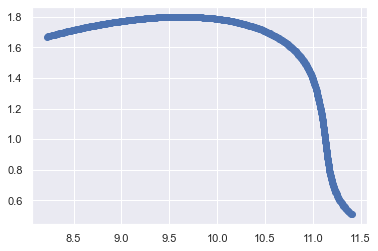

In [ ]:
import matplotlib.pyplot as plt

plt.scatter(data.R, data.M)

In [ ]:
TargetVariable=['M','R']
Predictors=['rho_c']

X=data[Predictors].values
y=data[TargetVariable].values

from sklearn.preprocessing import StandardScaler
PredictorScaler=StandardScaler()
TargetVarScaler=StandardScaler()

PredictorScalerFit=PredictorScaler.fit(X)
TargetVarScalerFit=TargetVarScaler.fit(y)

X=PredictorScalerFit.transform(X)
y=TargetVarScalerFit.transform(y)

from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

print(X_train.shape)
print(y_train.shape)
print(X_test.shape)
print(y_test.shape)

(280, 1)
(280, 2)
(120, 1)
(120, 2)


In [ ]:
from keras.models import Sequential
from keras.layers import Dense

model = Sequential()

model.add(Dense(units=20, input_dim=1, kernel_initializer='normal', activation='relu'))

model.add(Dense(units=15, kernel_initializer='normal', activation='tanh'))

model.add(Dense(units=15, kernel_initializer='normal', activation='tanh'))

# model.add(Dense(units=15, kernel_initializer='normal', activation='tanh'))

# model.add(Dense(units=20, kernel_initializer='normal', activation='relu'))


model.add(Dense(2, kernel_initializer='normal'))

model.compile(loss='mean_squared_error', optimizer='adam')

model.fit(X_train, y_train ,batch_size = 5, epochs = 50, verbose=1)

Epoch 1/50
56/56 [==============================] - 0s 800us/step - loss: 0.9178
Epoch 2/50
56/56 [==============================] - 0s 800us/step - loss: 0.4217
Epoch 3/50
56/56 [==============================] - 0s 764us/step - loss: 0.1809
Epoch 4/50
56/56 [==============================] - 0s 782us/step - loss: 0.1732
Epoch 5/50
56/56 [==============================] - 0s 764us/step - loss: 0.1685
Epoch 6/50
56/56 [==============================] - 0s 746us/step - loss: 0.1652
Epoch 7/50
56/56 [==============================] - 0s 727us/step - loss: 0.1624
Epoch 8/50
56/56 [==============================] - 0s 709us/step - loss: 0.1594
Epoch 9/50
56/56 [==============================] - 0s 746us/step - loss: 0.1574
Epoch 10/50
56/56 [==============================] - 0s 782us/step - loss: 0.1547
Epoch 11/50
56/56 [==============================] - 0s 746us/step - loss: 0.1530
Epoch 12/50
56/56 [==============================] - 0s 764us/step - loss: 0.1504
Epoch 13/50
56/56 [======

In [ ]:
def FunctionFindBestParams(X_train, y_train, X_test, y_test):
    
    batch_size_list=[5, 8, 10]
    epoch_list  =   [10, 50, 100]
    
    import pandas as pd
    SearchResultsData=pd.DataFrame(columns=['TrialNumber', 'Parameters', 'Accuracy'])
    
    TrialNumber=0
    for batch_size_trial in batch_size_list:
        for epochs_trial in epoch_list:
            temp = pd.DataFrame({})
            
            TrialNumber+=1
            
            model = Sequential()
            
            model.add(Dense(units=5, input_dim=X_train.shape[1], kernel_initializer='normal', activation='tanh'))

            model.add(Dense(units=20, kernel_initializer='normal', activation='tanh'))
            
            model.add(Dense(units=25, kernel_initializer='normal', activation='relu'))
            
            model.add(Dense(units=15, kernel_initializer='normal', activation='tanh'))
            
            model.add(Dense(units=20, kernel_initializer='normal', activation='relu'))

            model.add(Dense(2, kernel_initializer='normal'))

            model.compile(loss='mean_squared_error', optimizer='adam')

            model.fit(X_train, y_train ,batch_size = batch_size_trial, epochs = epochs_trial, verbose=0)
            
            y_mod       = model.predict(X_test)
            y_mod_norm  = np.sqrt(y_mod.T[0]**2 + y_mod.T[1]**2)
            y_test_norm = np.sqrt(y_test.T[0]**2 + y_test.T[1]**2)
            
            MAPE = np.mean(100 * (np.abs(y_test_norm-y_mod_norm)/y_test_norm))
            
            # printing the results of the current iteration
            print(TrialNumber, 'Parameters:','batch_size:', batch_size_trial,'-', 'epochs:',epochs_trial, 'Accuracy:', 100-MAPE)
            
            temp = pd.DataFrame(data=[[TrialNumber, str(batch_size_trial)+'-'+str(epochs_trial), 100-MAPE]],
                                                                    columns=['TrialNumber', 'Parameters', 'Accuracy'] )
            
            frames = [SearchResultsData,temp]
            
            SearchResultsData = pd.concat(frames, ignore_index = True)
    return(SearchResultsData)

ResultsData=FunctionFindBestParams(X_train, y_train, X_test, y_test)

4/4 [==============================] - 0s 1ms/step
1 Parameters: batch_size: 5 - epochs: 10 Accuracy: 83.89835216630817
4/4 [==============================] - 0s 667us/step
2 Parameters: batch_size: 5 - epochs: 50 Accuracy: 99.42513230025368
4/4 [==============================] - 0s 667us/step
3 Parameters: batch_size: 5 - epochs: 100 Accuracy: 99.29813629765286
4/4 [==============================] - 0s 1ms/step
4 Parameters: batch_size: 8 - epochs: 10 Accuracy: 86.13939845606001
4/4 [==============================] - 0s 1ms/step
5 Parameters: batch_size: 8 - epochs: 50 Accuracy: 98.68814985366488
4/4 [==============================] - 0s 1ms/step
6 Parameters: batch_size: 8 - epochs: 100 Accuracy: 99.27843259016143
4/4 [==============================] - 0s 1ms/step
7 Parameters: batch_size: 10 - epochs: 10 Accuracy: 84.70348914720813
4/4 [==============================] - 0s 1ms/step
8 Parameters: batch_size: 10 - epochs: 50 Accuracy: 98.75200874135784
4/4 [===========================

<AxesSubplot:xlabel='Parameters'>

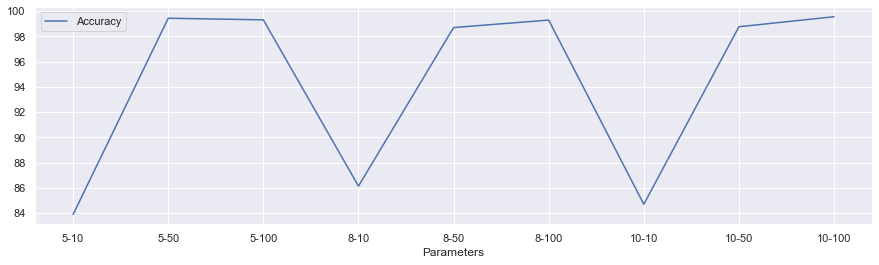

In [ ]:
%matplotlib inline
ResultsData.plot(x='Parameters', y='Accuracy', figsize=(15,4), kind='line')

## Straight lines correlation to number of neurons (3 layers)

4/4 [==============================] - 0s 1ms/step
The Accuracy of ANN model is: 99.85614257270116


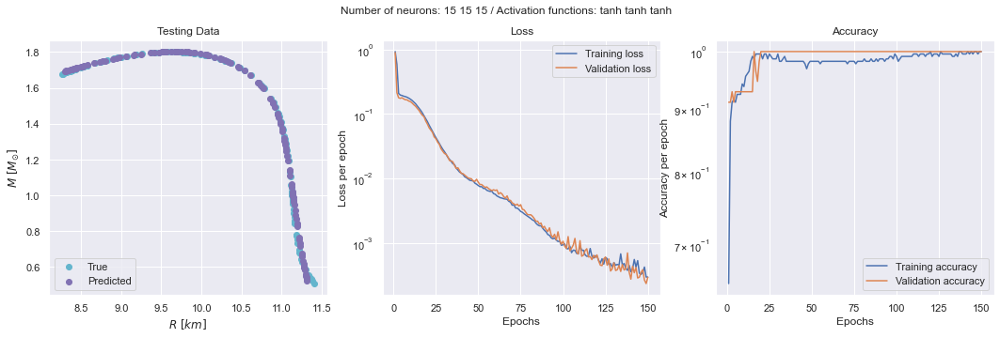

4/4 [==============================] - 0s 667us/step
The Accuracy of ANN model is: 99.82723288236637


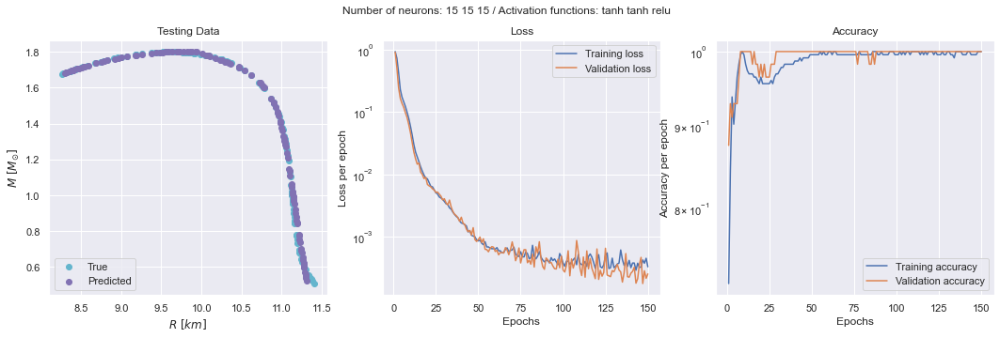

4/4 [==============================] - 0s 1ms/step
The Accuracy of ANN model is: 99.83829366898722


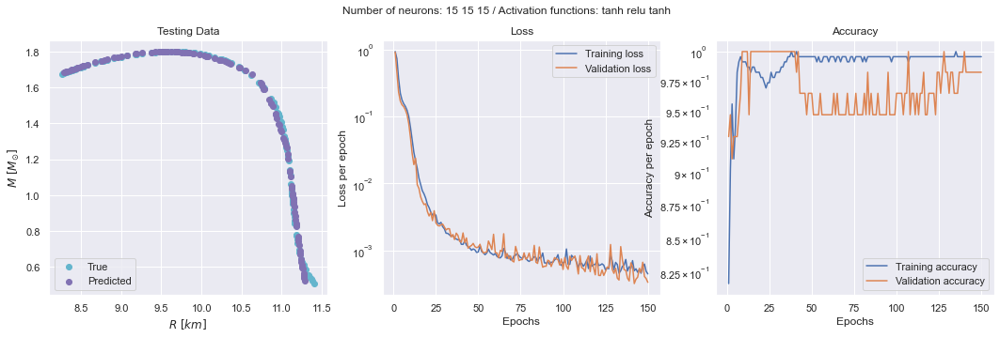

4/4 [==============================] - 0s 667us/step
The Accuracy of ANN model is: 99.87261658132688


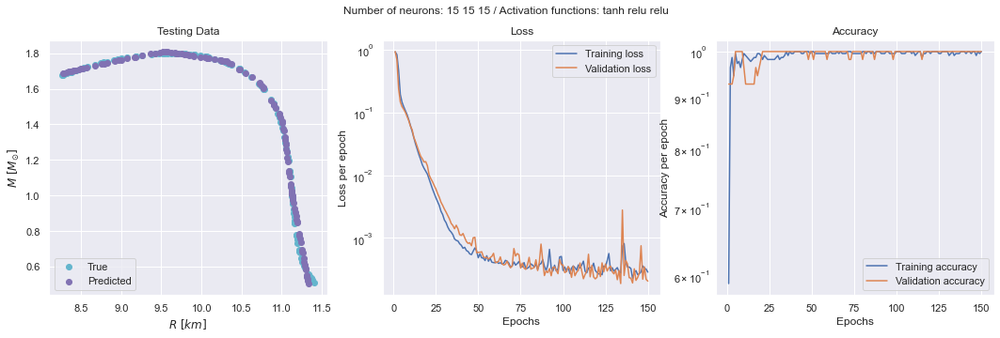

4/4 [==============================] - 0s 667us/step
The Accuracy of ANN model is: 99.84460229705111


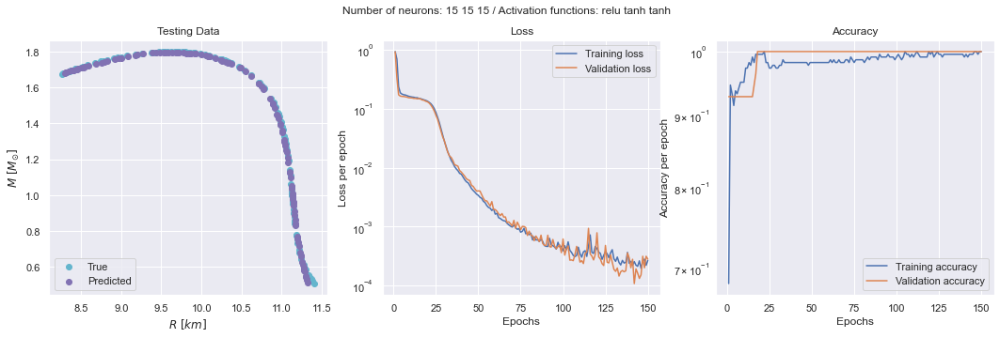

4/4 [==============================] - 0s 667us/step
The Accuracy of ANN model is: 99.8520119564694


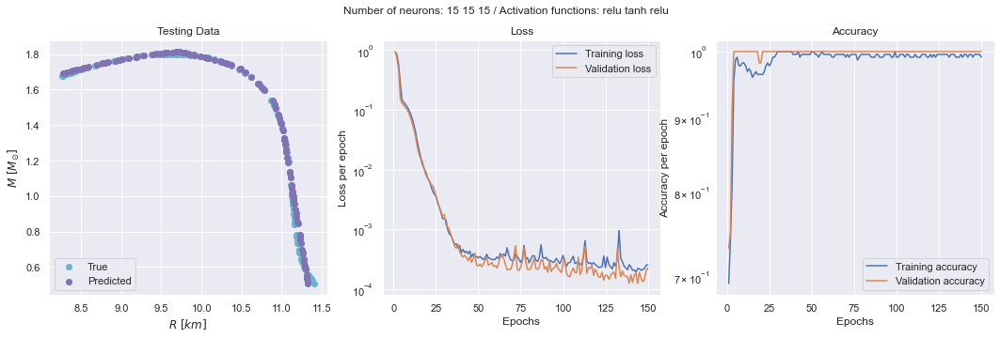

4/4 [==============================] - 0s 667us/step
The Accuracy of ANN model is: 99.90563907445676


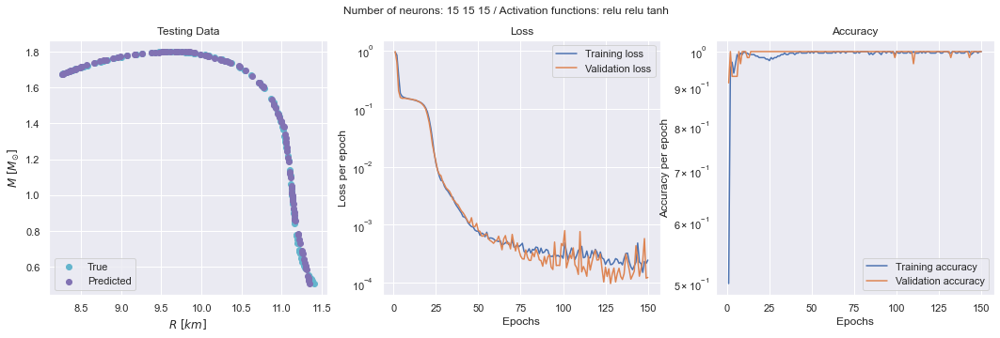

4/4 [==============================] - 0s 667us/step
The Accuracy of ANN model is: 99.85948658808384


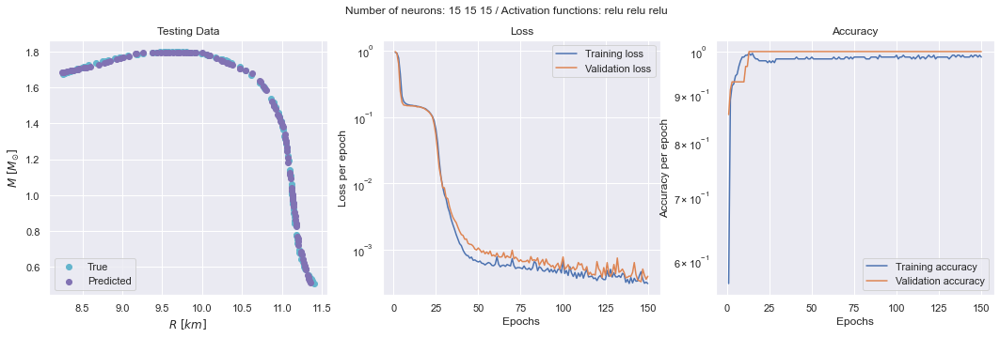

4/4 [==============================] - 0s 1ms/step
The Accuracy of ANN model is: 99.86439529697493


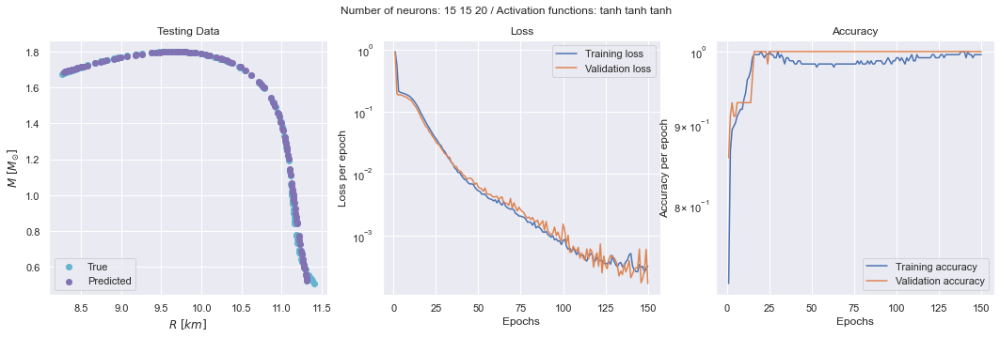

4/4 [==============================] - 0s 1ms/step
The Accuracy of ANN model is: 99.83429893214678


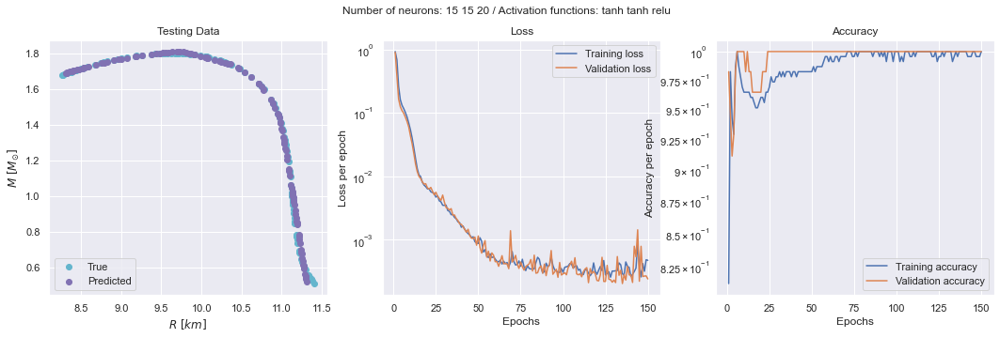

4/4 [==============================] - 0s 1ms/step
The Accuracy of ANN model is: 99.8192680211901


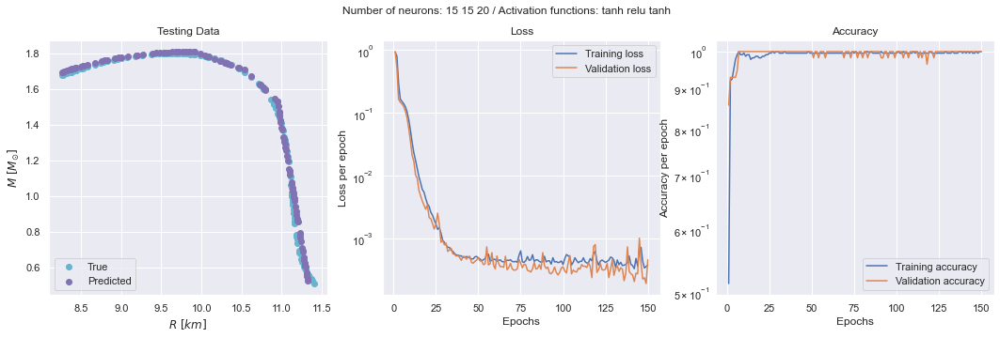

4/4 [==============================] - 0s 1000us/step
The Accuracy of ANN model is: 99.91417348158227


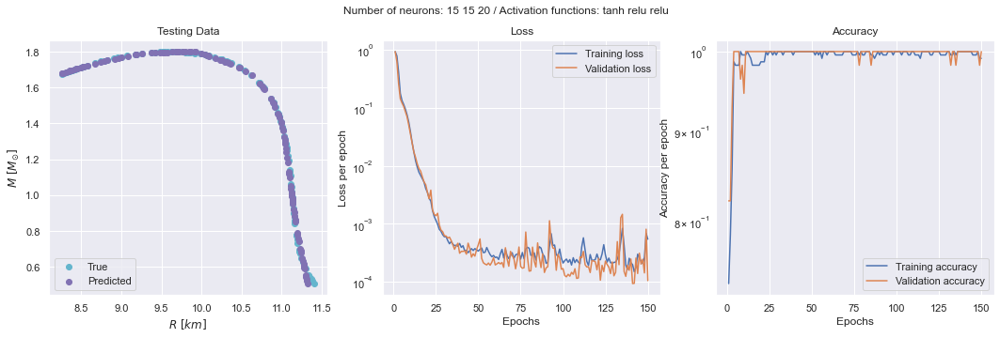

4/4 [==============================] - 0s 667us/step
The Accuracy of ANN model is: 99.88921274357611


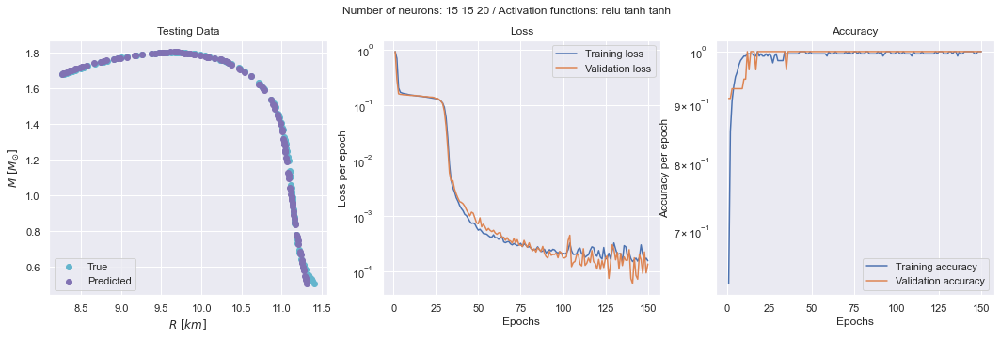

4/4 [==============================] - 0s 667us/step
The Accuracy of ANN model is: 99.81347121015989


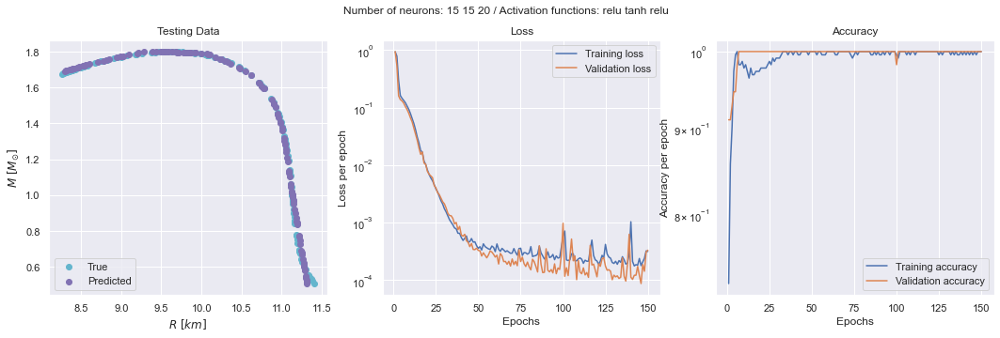

4/4 [==============================] - 0s 667us/step
The Accuracy of ANN model is: 99.85594956697412


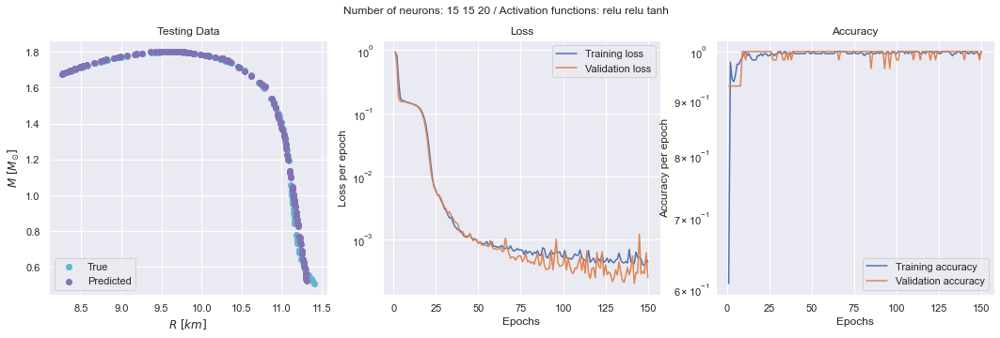

4/4 [==============================] - 0s 1ms/step
The Accuracy of ANN model is: 99.77995411520165


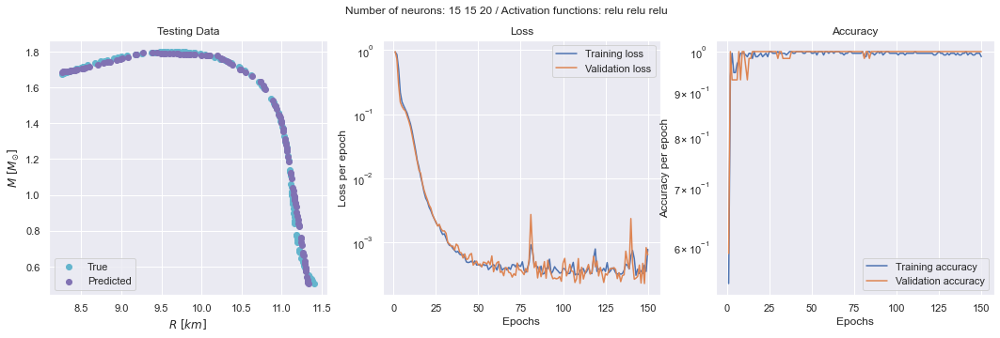

4/4 [==============================] - 0s 1ms/step
The Accuracy of ANN model is: 99.8872902285433


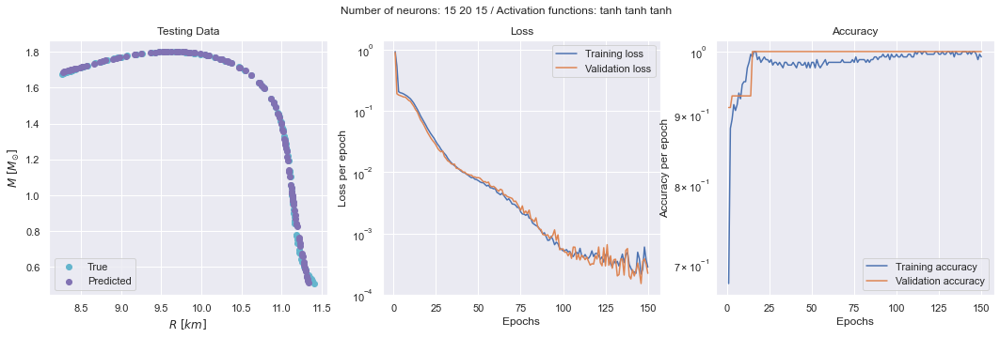

4/4 [==============================] - 0s 667us/step
The Accuracy of ANN model is: 99.85968134015494


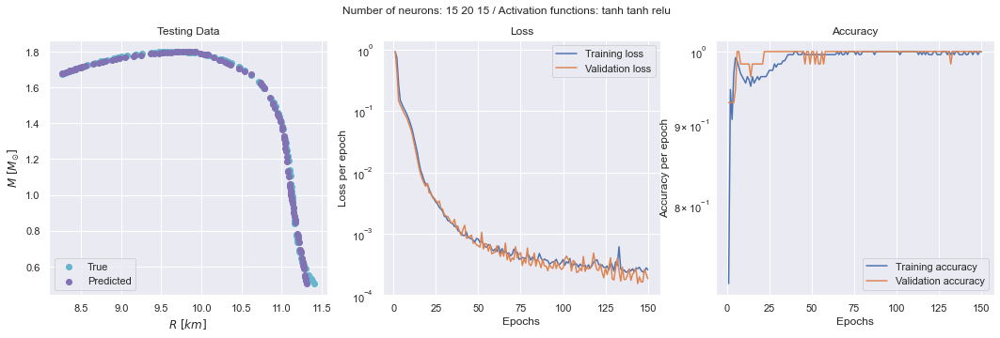

4/4 [==============================] - 0s 1ms/step
The Accuracy of ANN model is: 99.91372517532554


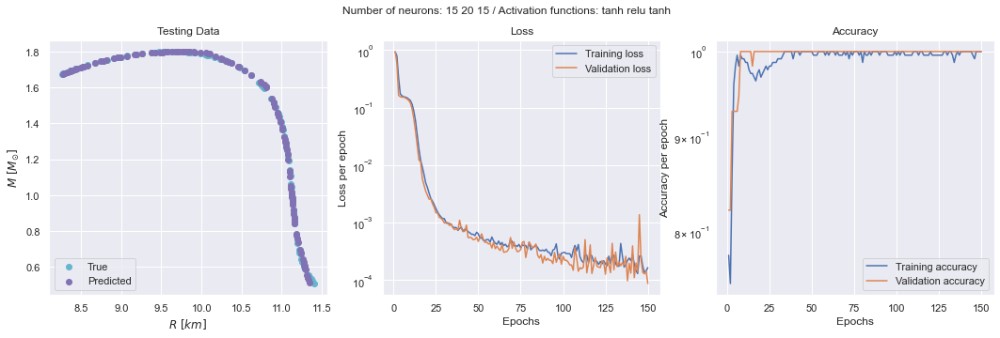

4/4 [==============================] - 0s 667us/step
The Accuracy of ANN model is: 99.82243602263355


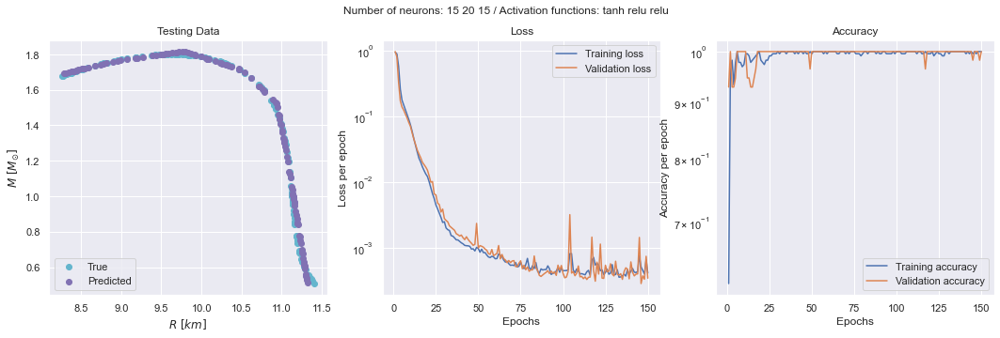

4/4 [==============================] - 0s 667us/step
The Accuracy of ANN model is: 99.90225689691773


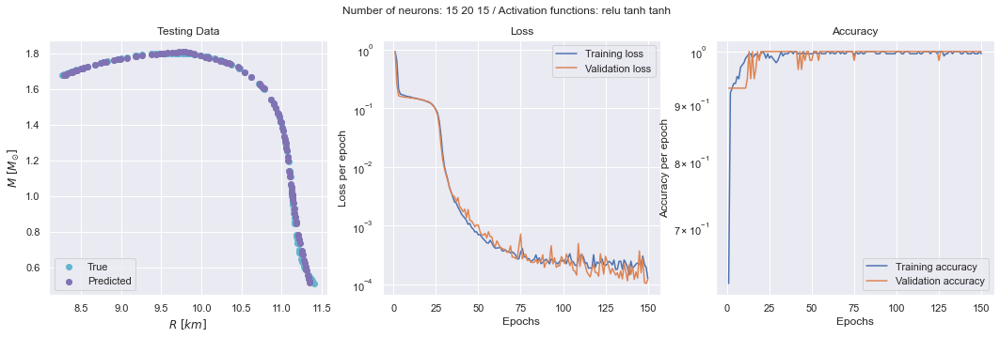

4/4 [==============================] - 0s 667us/step
The Accuracy of ANN model is: 99.85903718225175


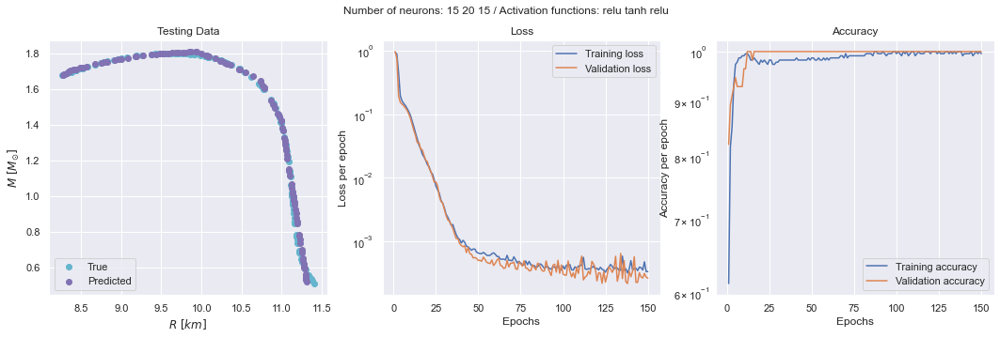

4/4 [==============================] - 0s 667us/step
The Accuracy of ANN model is: 99.89998349322954


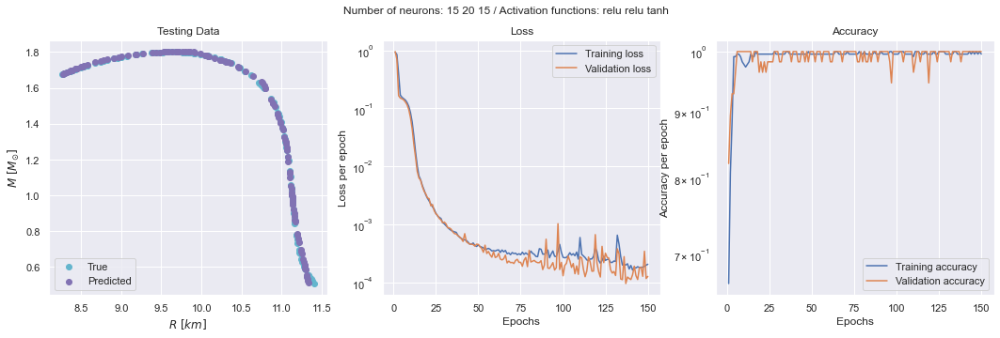

4/4 [==============================] - 0s 1ms/step
The Accuracy of ANN model is: 99.83447445997741


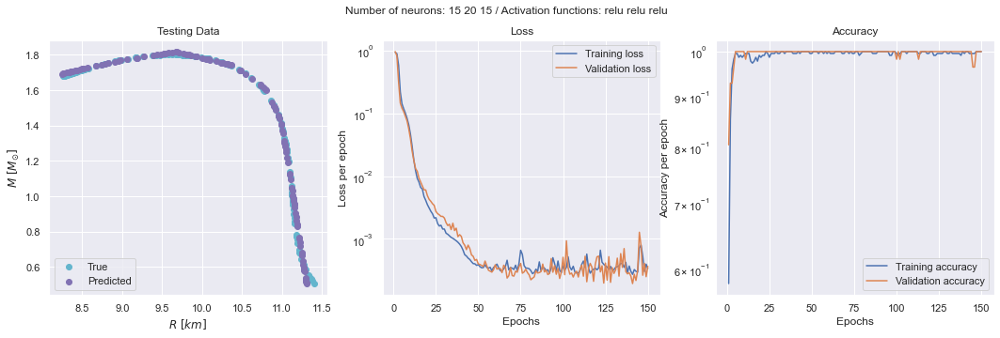

4/4 [==============================] - 0s 1ms/step
The Accuracy of ANN model is: 99.74703846800011


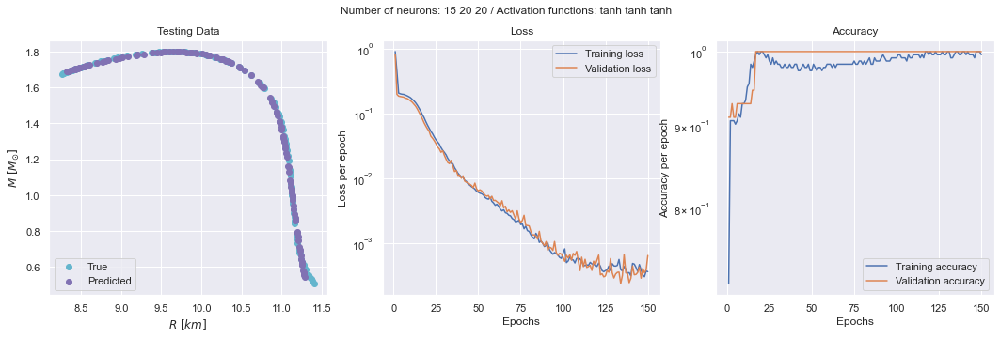

4/4 [==============================] - 0s 1ms/step
The Accuracy of ANN model is: 99.88236709005912


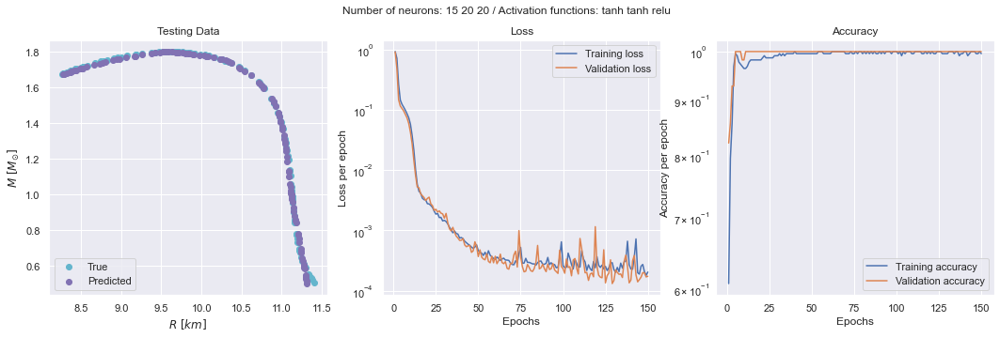

4/4 [==============================] - 0s 1ms/step
The Accuracy of ANN model is: 99.92897738814627


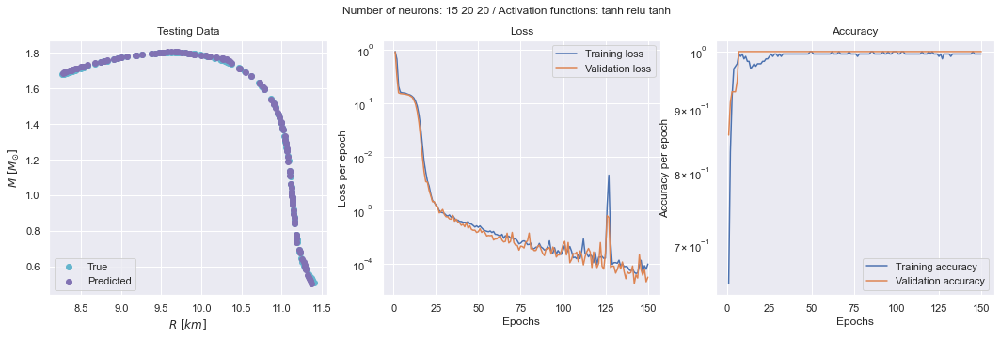

4/4 [==============================] - 0s 1ms/step
The Accuracy of ANN model is: 99.92768592108985


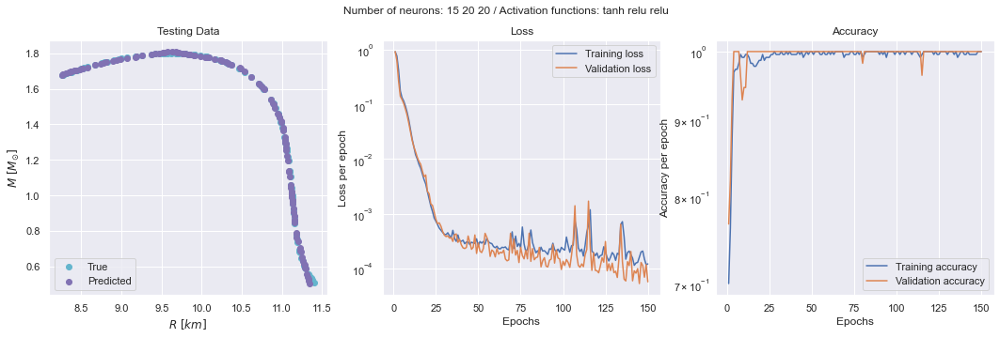

4/4 [==============================] - 0s 667us/step
The Accuracy of ANN model is: 99.85073566864486


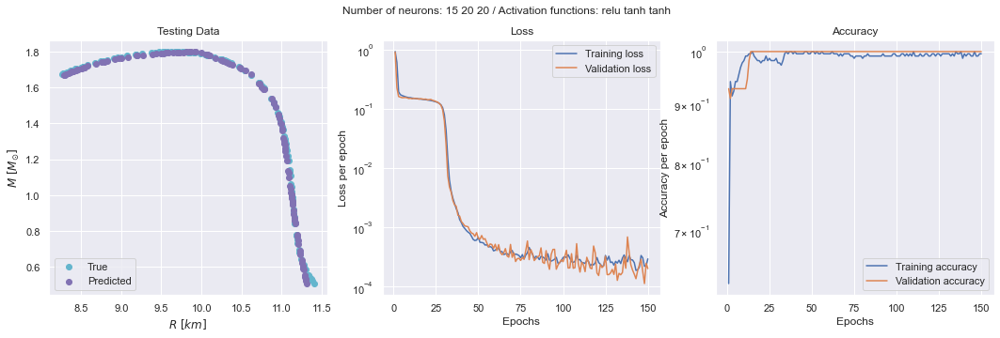

4/4 [==============================] - 0s 1ms/step
The Accuracy of ANN model is: 99.91597535638053


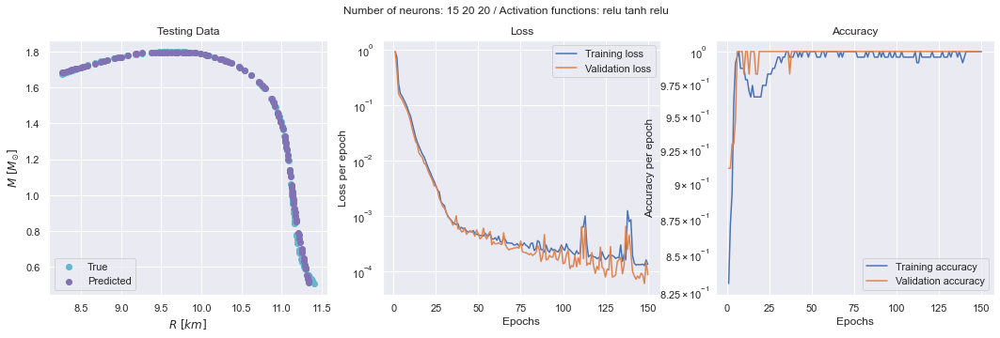

4/4 [==============================] - 0s 1ms/step
The Accuracy of ANN model is: 99.8395916651867


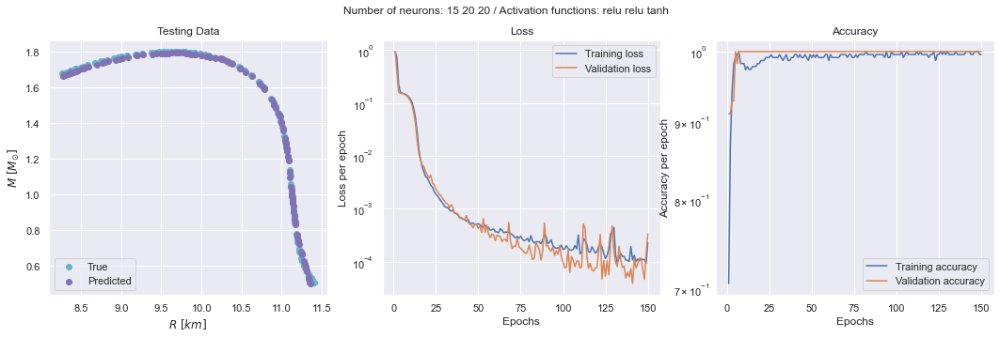

4/4 [==============================] - 0s 1ms/step
The Accuracy of ANN model is: 99.74562012810665


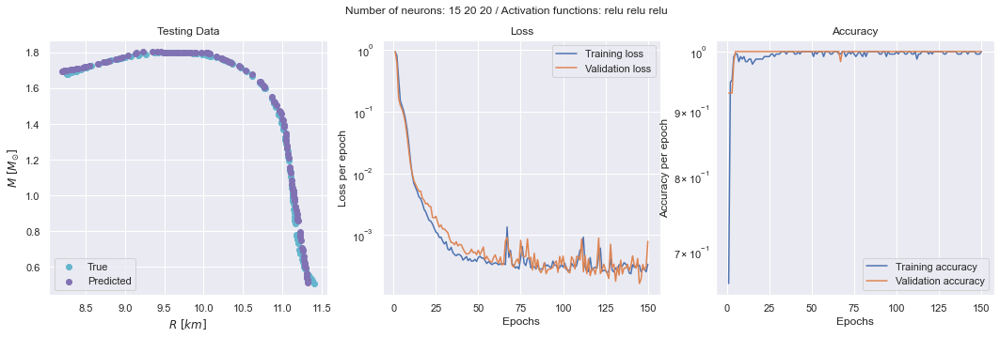

4/4 [==============================] - 0s 667us/step
The Accuracy of ANN model is: 99.76586261918122


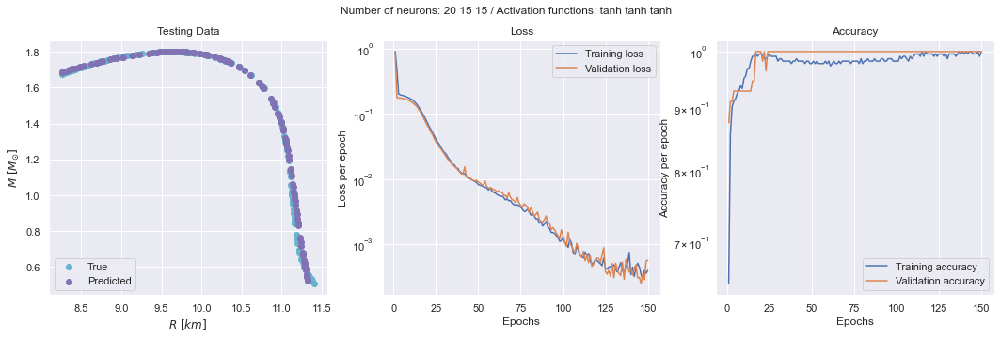

4/4 [==============================] - 0s 1ms/step
The Accuracy of ANN model is: 99.8792956708571


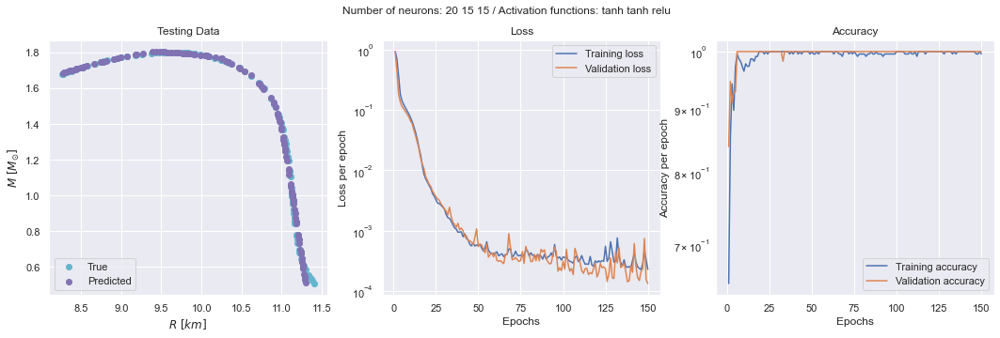

4/4 [==============================] - 0s 667us/step
The Accuracy of ANN model is: 99.88592557326204


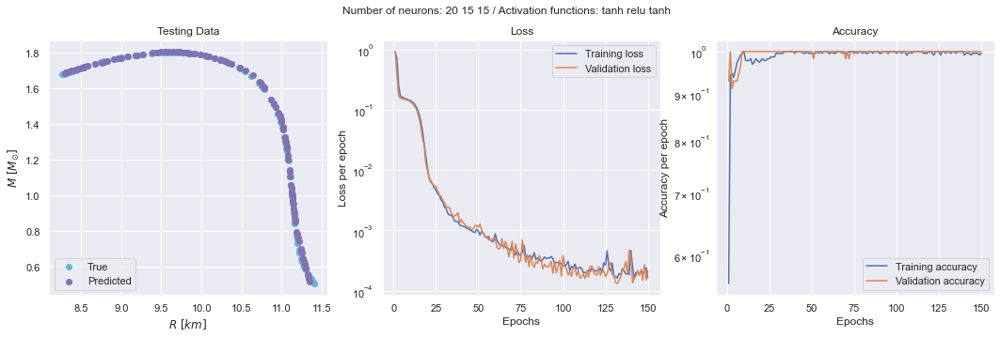

4/4 [==============================] - 0s 667us/step
The Accuracy of ANN model is: 99.86761606023708


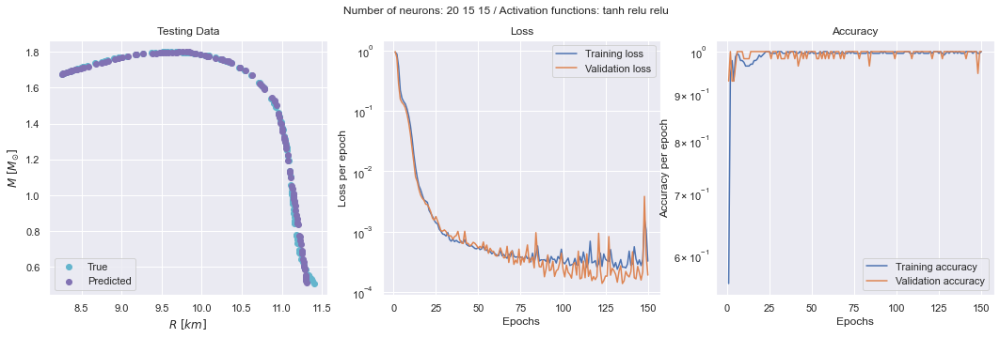

4/4 [==============================] - 0s 667us/step
The Accuracy of ANN model is: 99.94858864286704


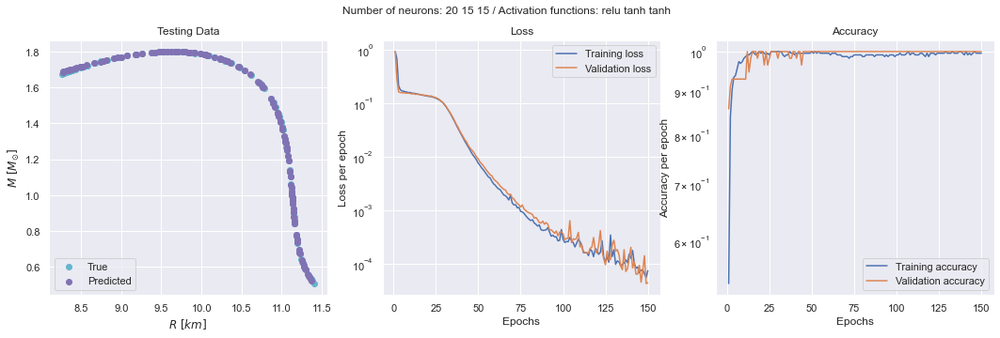

4/4 [==============================] - 0s 1ms/step
The Accuracy of ANN model is: 99.88780240434951


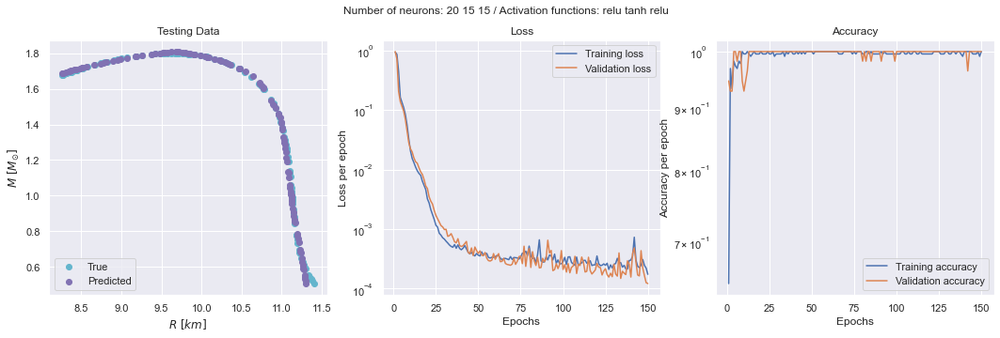

4/4 [==============================] - 0s 1ms/step
The Accuracy of ANN model is: 99.8107836615308


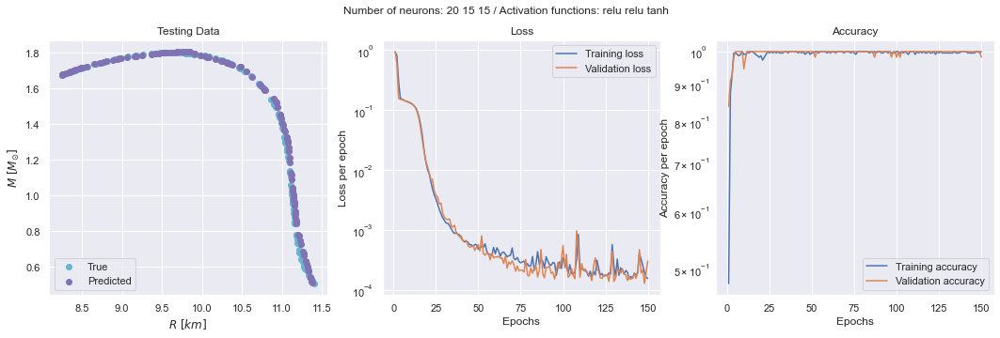

4/4 [==============================] - 0s 1ms/step
The Accuracy of ANN model is: 99.82754610532254


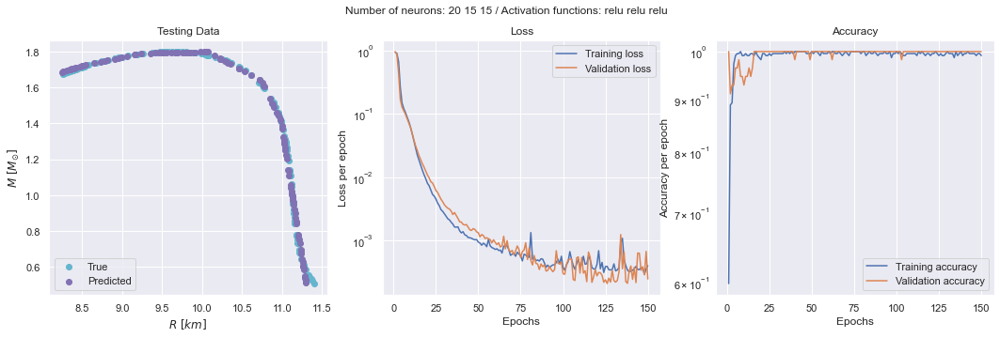

4/4 [==============================] - 0s 1ms/step
The Accuracy of ANN model is: 99.81689334076309


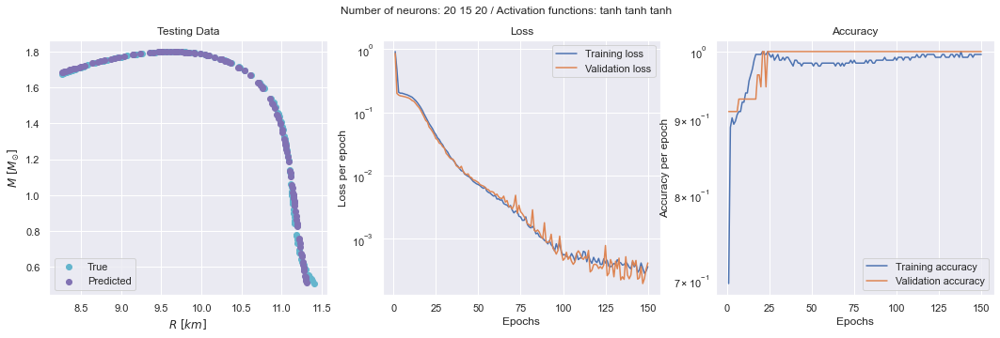

4/4 [==============================] - 0s 1ms/step
The Accuracy of ANN model is: 99.90249477721935


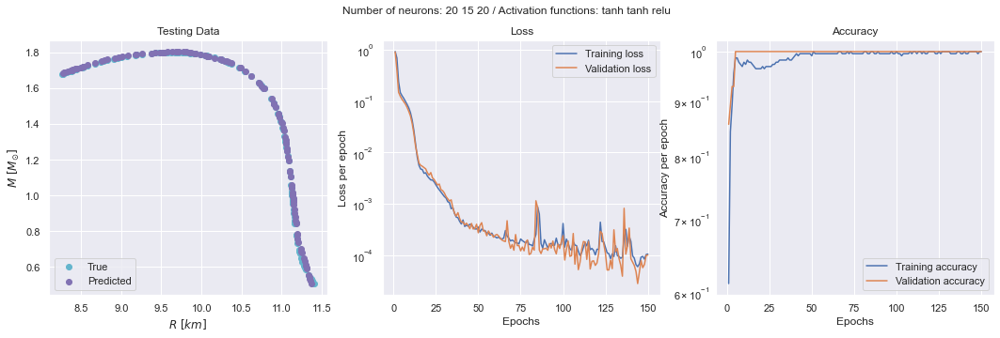

4/4 [==============================] - 0s 1ms/step
The Accuracy of ANN model is: 99.85893356652171


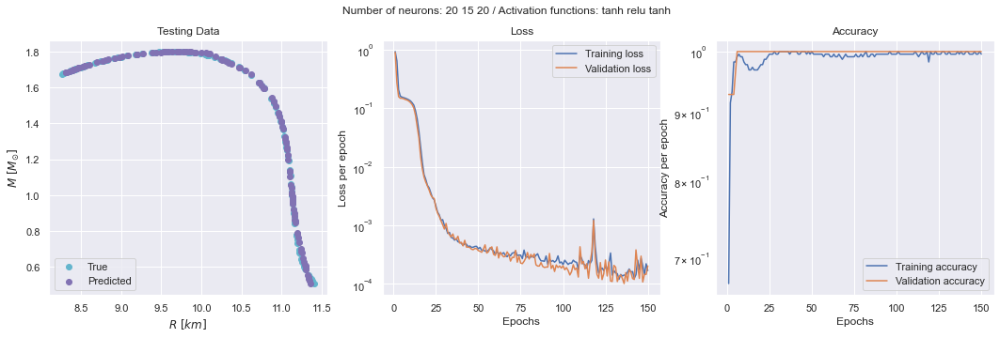

4/4 [==============================] - 0s 1ms/step
The Accuracy of ANN model is: 99.87294545332202


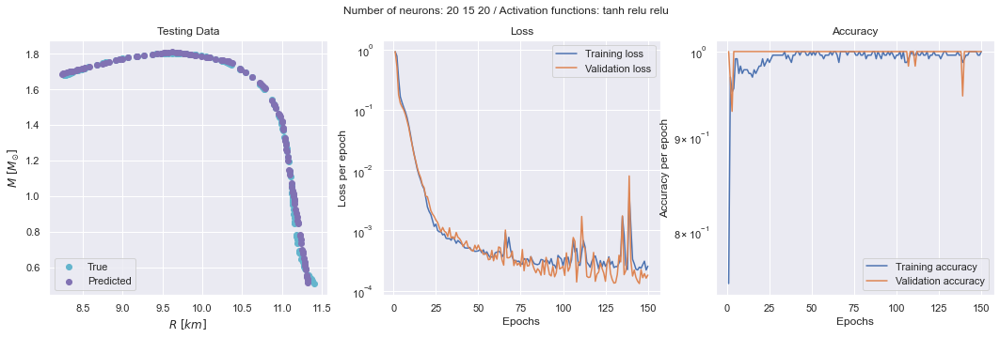

4/4 [==============================] - 0s 1ms/step
The Accuracy of ANN model is: 99.87069751489325


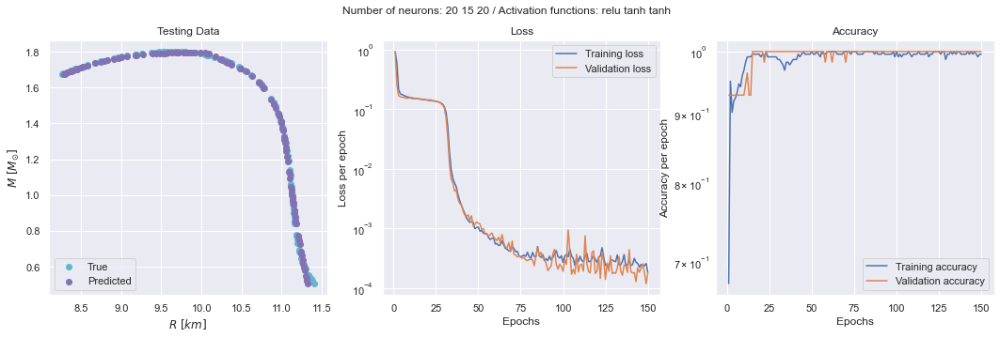

4/4 [==============================] - 0s 667us/step
The Accuracy of ANN model is: 99.91262709960753


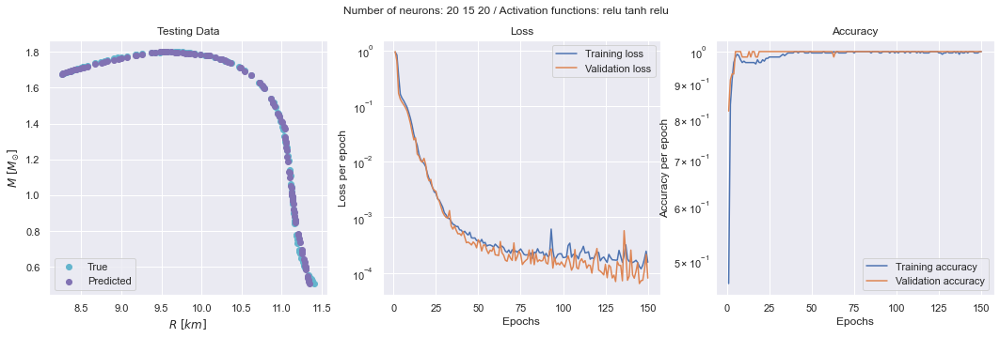

4/4 [==============================] - 0s 1ms/step
The Accuracy of ANN model is: 99.89923153257465


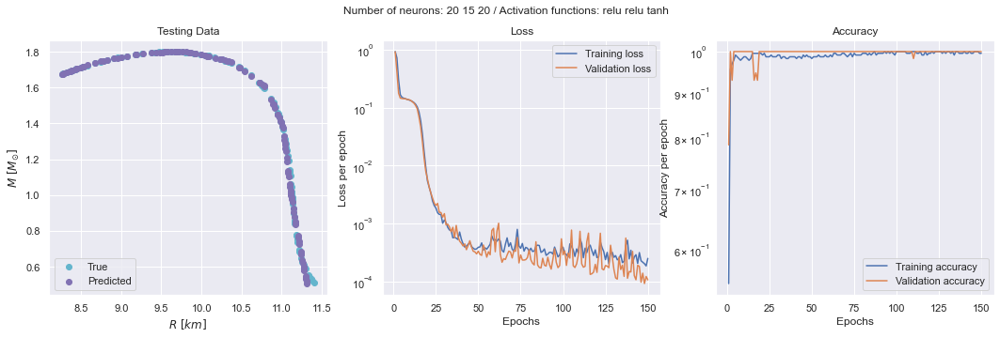

4/4 [==============================] - 0s 667us/step
The Accuracy of ANN model is: 99.8681598997231


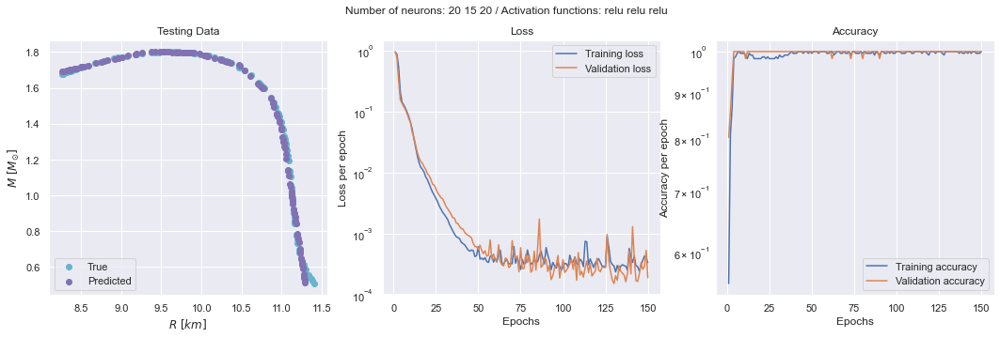

4/4 [==============================] - 0s 1ms/step
The Accuracy of ANN model is: 99.90060243866209


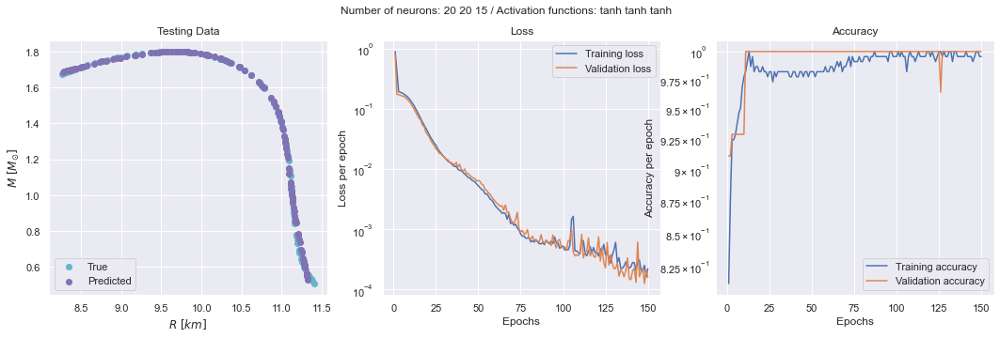

4/4 [==============================] - 0s 667us/step
The Accuracy of ANN model is: 99.77031880579183


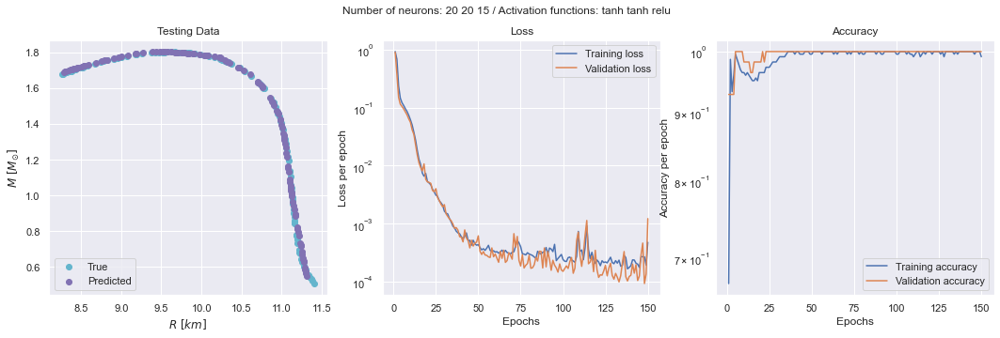

4/4 [==============================] - 0s 1ms/step
The Accuracy of ANN model is: 99.9122531681161


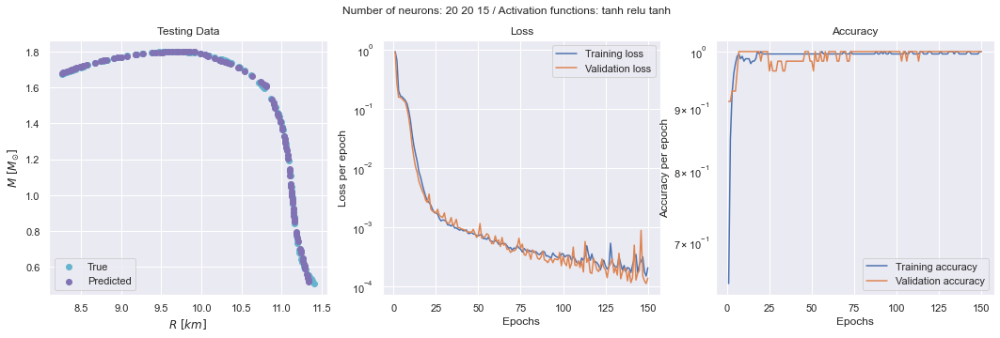

4/4 [==============================] - 0s 1ms/step
The Accuracy of ANN model is: 99.86647909025211


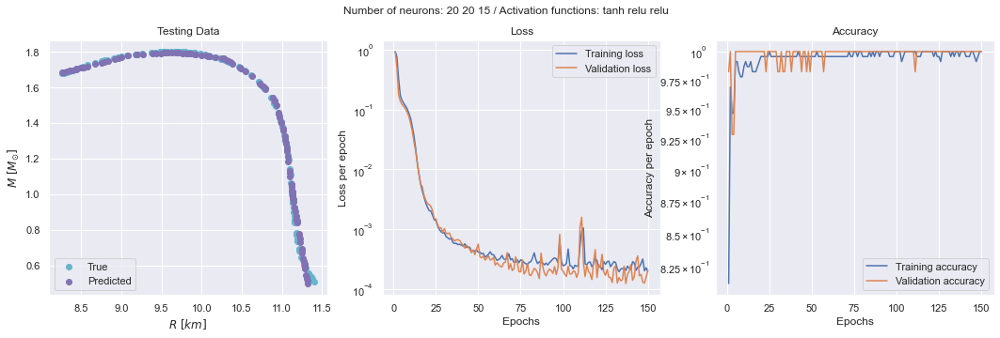

4/4 [==============================] - 0s 1ms/step
The Accuracy of ANN model is: 99.89217254954063


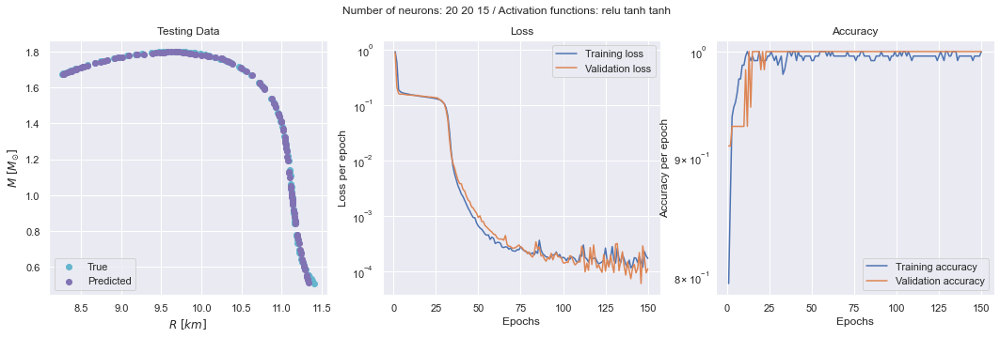

4/4 [==============================] - 0s 667us/step
The Accuracy of ANN model is: 99.81315703555812


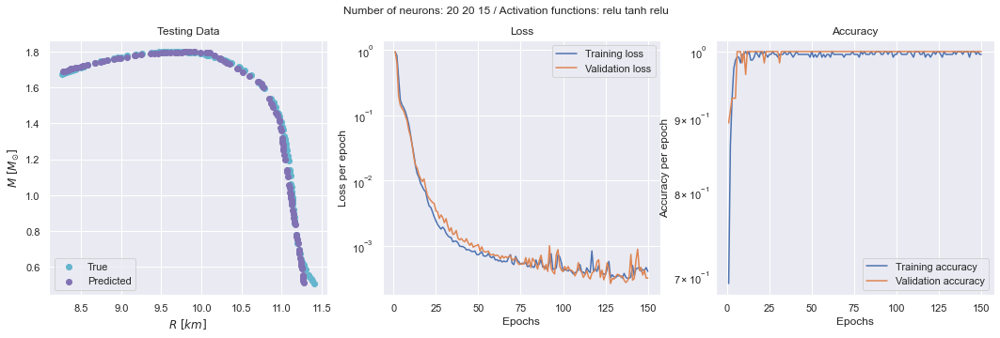

4/4 [==============================] - 0s 1ms/step
The Accuracy of ANN model is: 99.8559590113186


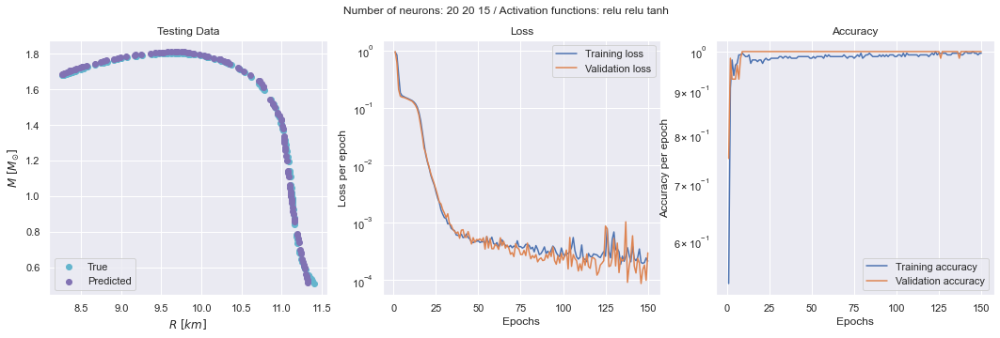

4/4 [==============================] - 0s 667us/step
The Accuracy of ANN model is: 99.8194339213333


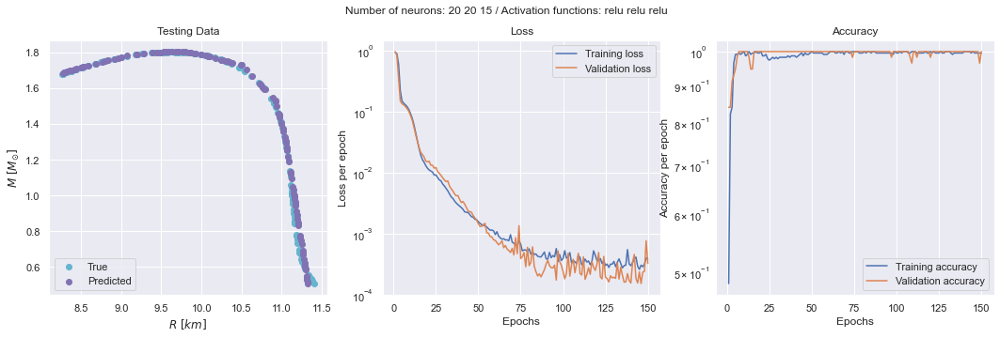

4/4 [==============================] - 0s 1ms/step
The Accuracy of ANN model is: 99.814672654852


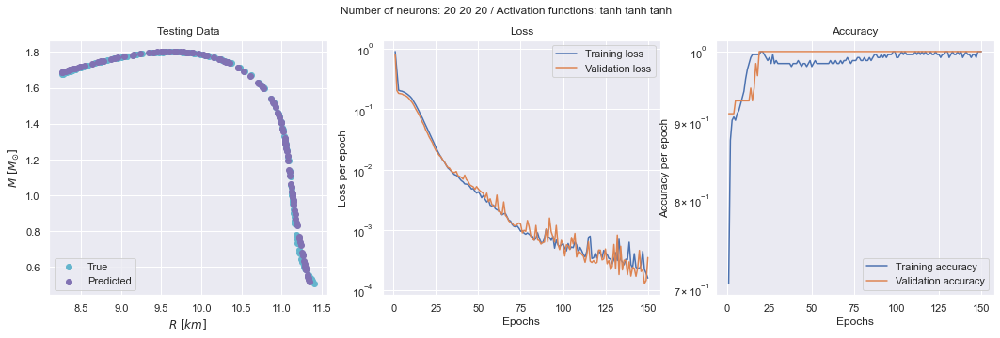

4/4 [==============================] - 0s 1ms/step
The Accuracy of ANN model is: 99.83999646749328


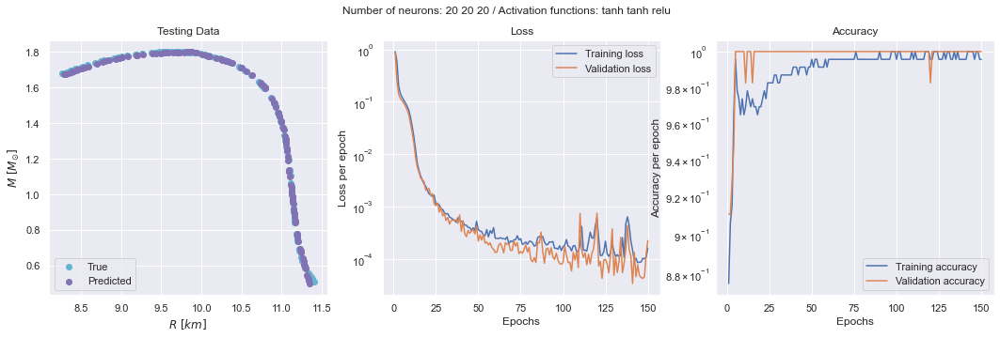

4/4 [==============================] - 0s 1ms/step
The Accuracy of ANN model is: 99.86049804469262


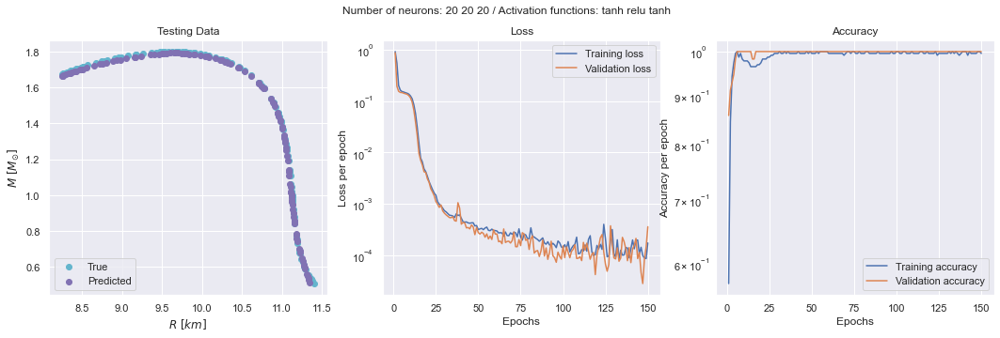

4/4 [==============================] - 0s 1ms/step
The Accuracy of ANN model is: 99.88533802193129


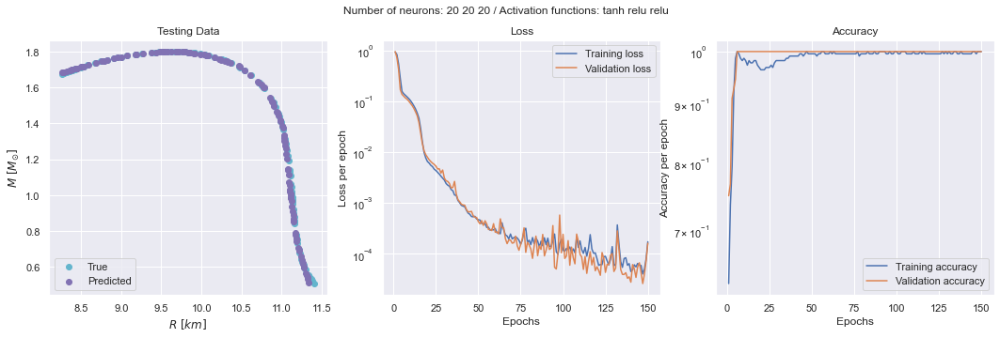

4/4 [==============================] - 0s 1ms/step
The Accuracy of ANN model is: 99.87225897127509


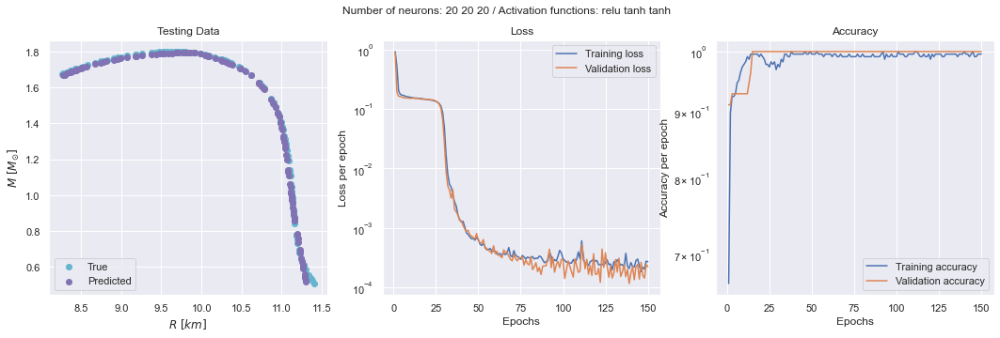

4/4 [==============================] - 0s 1ms/step
The Accuracy of ANN model is: 99.84537056092888


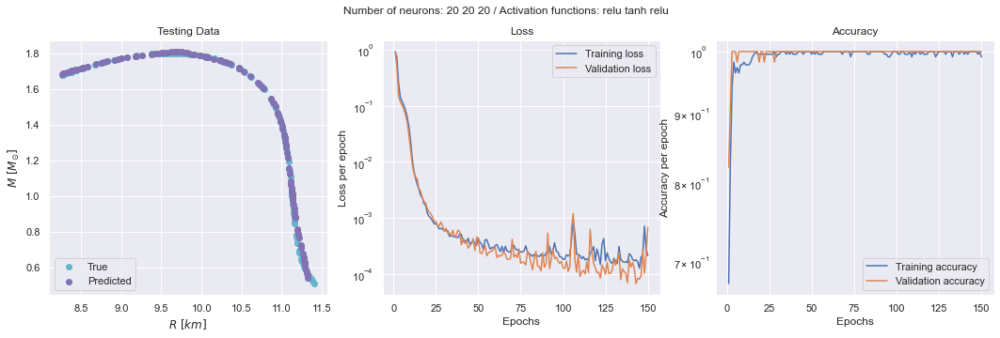

4/4 [==============================] - 0s 1ms/step
The Accuracy of ANN model is: 99.91300283265461


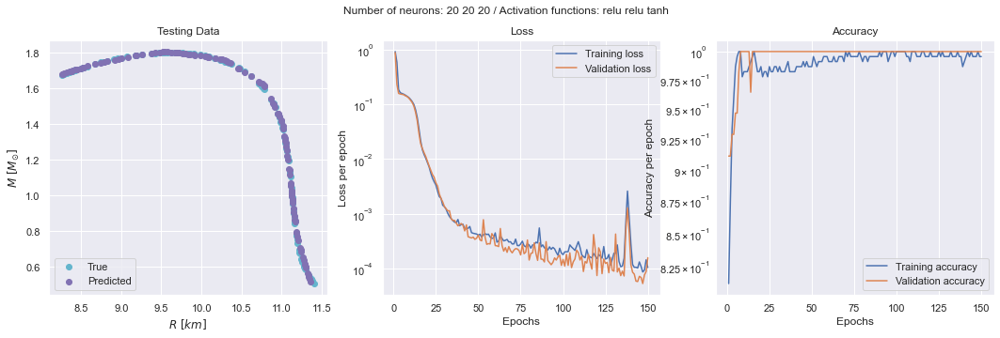

4/4 [==============================] - 0s 667us/step
The Accuracy of ANN model is: 99.9115974875285


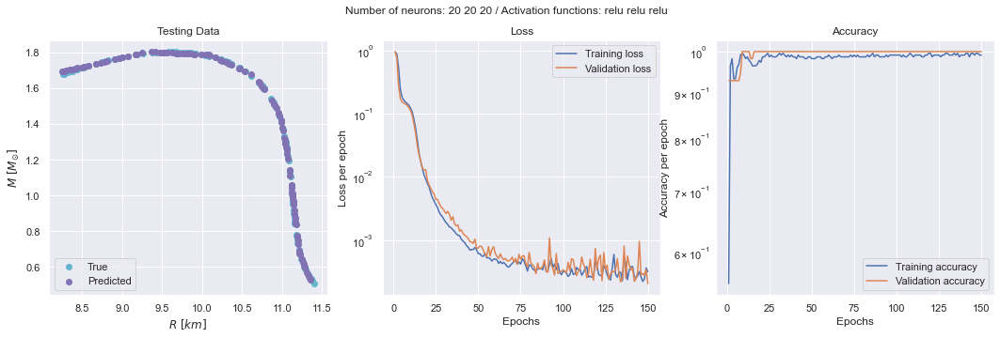

In [ ]:
eps = 150
neuron_list = [15,20]
act_list    = ['tanh','relu']

for i in neuron_list:
    for j in neuron_list:
        for k in neuron_list:
            for ia in act_list:
                for ja in act_list:
                    for ka in act_list:


                        model = Sequential()
                        
                        model.add(Dense(units = i, input_dim=X_train.shape[1], kernel_initializer='normal', activation=ia))

                        model.add(Dense(units = j, kernel_initializer='normal', activation=ja))

                        model.add(Dense(units = k, kernel_initializer='normal', activation=ka))

                        #             model.add(Dense(units=15, kernel_initializer='normal', activation='tanh'))

                        #             model.add(Dense(units=20, kernel_initializer='normal', activation='relu'))

                        model.add(Dense(2, kernel_initializer='normal'))

                        model.compile(loss='mean_squared_error', optimizer='adam', metrics=['accuracy'])

                        trial = model.fit(X_train, y_train ,batch_size = 5, epochs = eps, verbose=0, validation_split = 0.2)

                        Predictions=model.predict(X_test)

                        Predictions=TargetVarScalerFit.inverse_transform(Predictions)

                        y_test_orig=TargetVarScalerFit.inverse_transform(y_test)

                        Test_Data=PredictorScalerFit.inverse_transform(X_test)

                        TestingData=pd.DataFrame(data=Test_Data, columns=Predictors)

                        TestingData['M'] = y_test_orig.T[0]
                        TestingData['R'] = y_test_orig.T[1]

                        TestingData['M_pred'] = Predictions.T[0]
                        TestingData['R_pred'] = Predictions.T[1]

                        Testing_norm   = np.sqrt(TestingData.M.values**2 + TestingData.R.values**2)
                        Predicted_norm = np.sqrt(TestingData.M_pred.values**2 + TestingData.R_pred.values**2)
                        Test_pred_norm = np.sqrt((TestingData.M.values-TestingData.M_pred.values)**2 + (TestingData.R.values-TestingData.R_pred.values)**2)


                        APE=100*(Test_pred_norm/Testing_norm)
                        TestingData['APE']=APE

                        print('The Accuracy of ANN model is:', 100-np.mean(APE))

                        import matplotlib.pyplot as plt
                        x1 = TestingData.R.values
                        y1 = TestingData.M.values

                        x2 = TestingData.R_pred.values
                        y2 = TestingData.M_pred.values

                        fig, ax = plt.subplots(1, 3, figsize=(18,5))
                        ax[0].scatter(x1,y1, color = 'c', label = 'True')
                        ax[0].scatter(x2,y2, color = 'm', label = 'Predicted')
                        ax[0].legend()
                        ax[0].set_xlabel('$ R \ [km] $')
                        ax[0].set_ylabel('$ M \ [M_{\odot}] $')
                        ax[0].set_title("Testing Data")


                        val_loss_list = trial.history['val_loss']
                        loss_list     = trial.history['loss']
                        epos          = np.linspace(1,eps,eps)
                        ax[1].semilogy(epos, loss_list    , label = 'Training loss')
                        ax[1].semilogy(epos, val_loss_list, label = 'Validation loss')
                        ax[1].set_xlabel('Epochs')
                        ax[1].set_ylabel('Loss per epoch')
                        ax[1].legend()
                        ax[1].set_title("Loss")

                        val_acc_list = trial.history['val_accuracy']
                        acc_list     = trial.history['accuracy']
                        epos         = np.linspace(1,eps,eps)
                        ax[2].semilogy(epos, acc_list    , label = 'Training accuracy')
                        ax[2].semilogy(epos, val_acc_list, label = 'Validation accuracy')
                        ax[2].set_xlabel('Epochs')
                        ax[2].set_ylabel('Accuracy per epoch')
                        ax[2].legend()
                        ax[2].set_title("Accuracy")


                        fig.suptitle('Number of neurons: '+str(i)+" "+str(j)+" "+str(k)+' / Activation functions: '+str(ia)+" "+str(ja)+" "+str(ka))
                        
                        plt.show()

## Searching for the best tuning (4 layers)

4/4 [==============================] - 0s 1ms/step
The Accuracy of ANN model is: 99.79925805832521


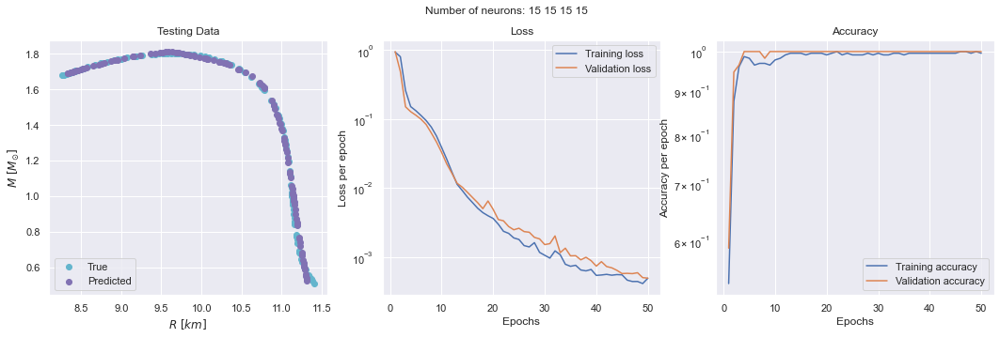

4/4 [==============================] - 0s 1000us/step
The Accuracy of ANN model is: 99.72794802891235


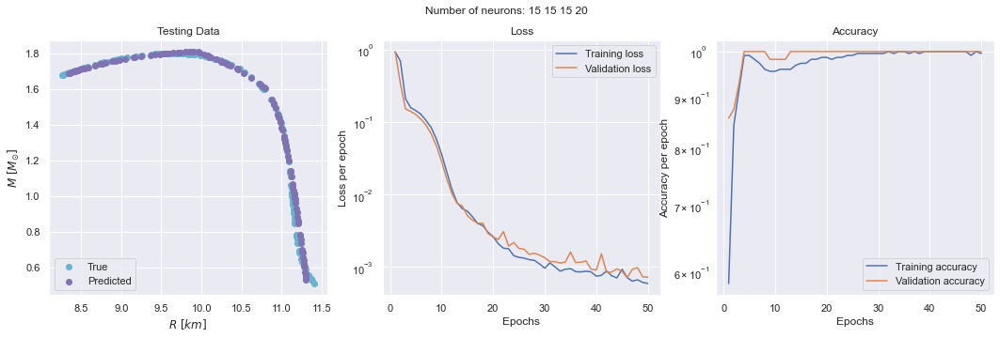

4/4 [==============================] - 0s 667us/step
The Accuracy of ANN model is: 99.74902933628108


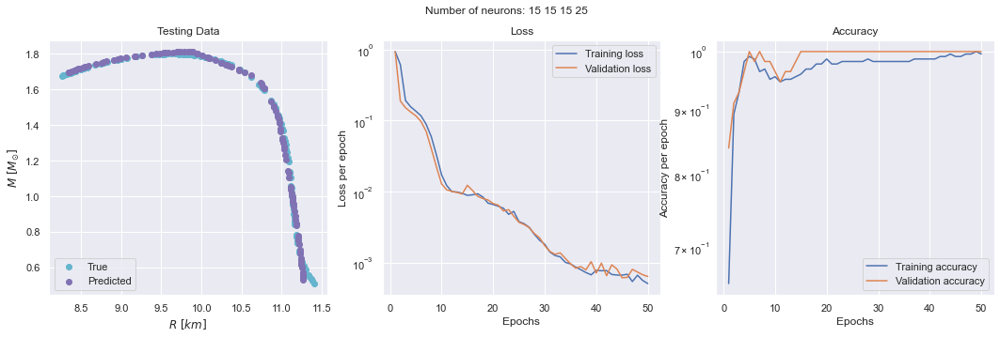

4/4 [==============================] - 0s 667us/step
The Accuracy of ANN model is: 99.80241286430066


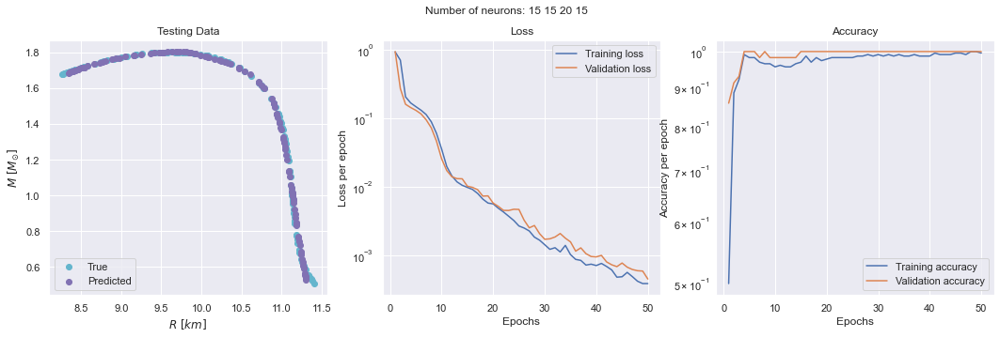

4/4 [==============================] - 0s 1ms/step
The Accuracy of ANN model is: 99.74867402565584


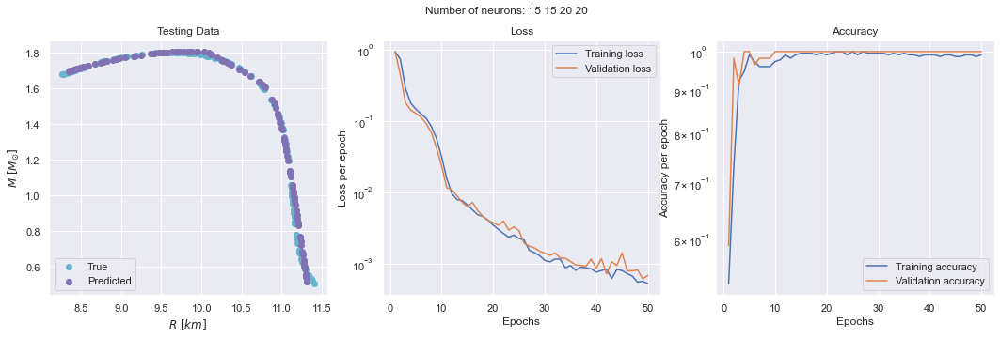

4/4 [==============================] - 0s 1ms/step
The Accuracy of ANN model is: 99.74675529086261


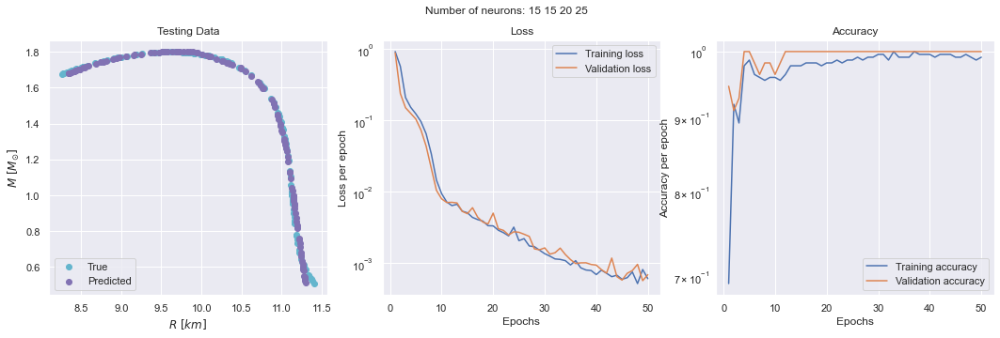

4/4 [==============================] - 0s 667us/step
The Accuracy of ANN model is: 99.73855262786725


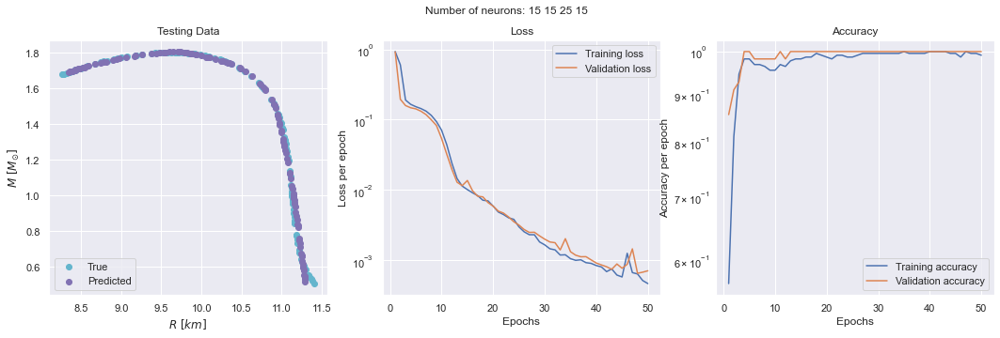

4/4 [==============================] - 0s 1000us/step
The Accuracy of ANN model is: 99.8054734022246


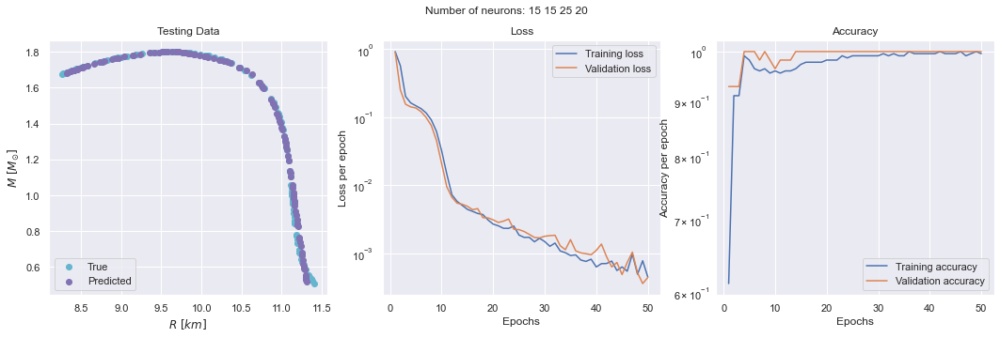

4/4 [==============================] - 0s 1ms/step
The Accuracy of ANN model is: 99.76026484747128


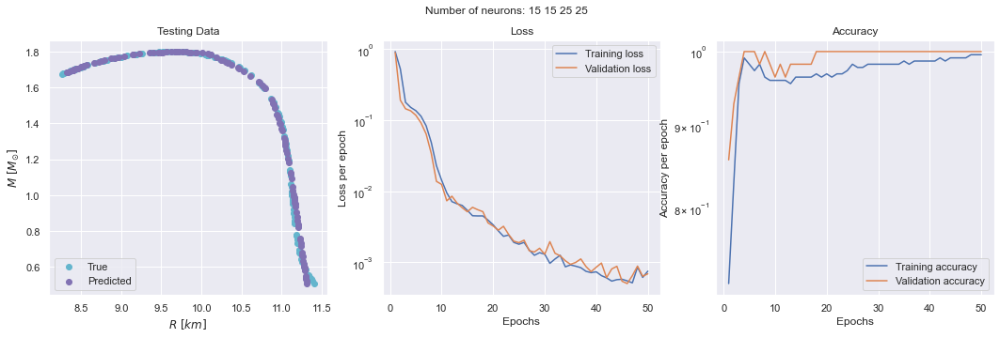

4/4 [==============================] - 0s 667us/step
The Accuracy of ANN model is: 99.73358920197451


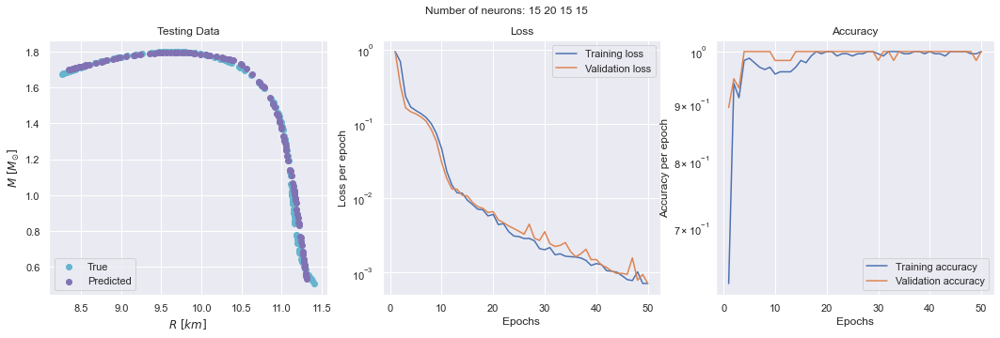

4/4 [==============================] - 0s 1ms/step
The Accuracy of ANN model is: 99.78903314135796


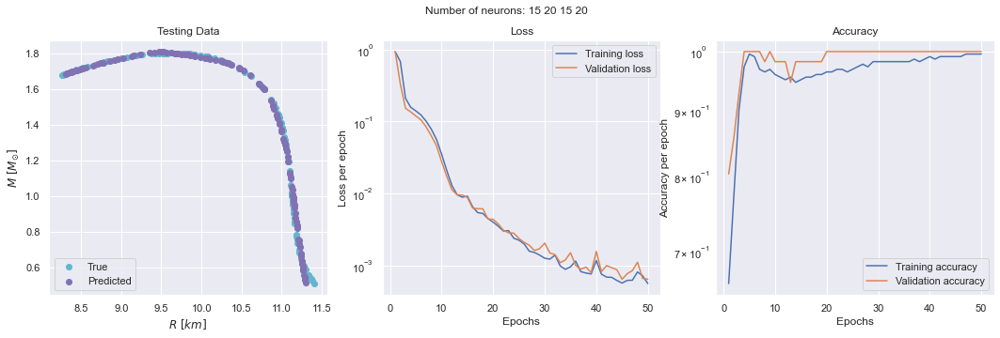

4/4 [==============================] - 0s 667us/step
The Accuracy of ANN model is: 99.77222849441621


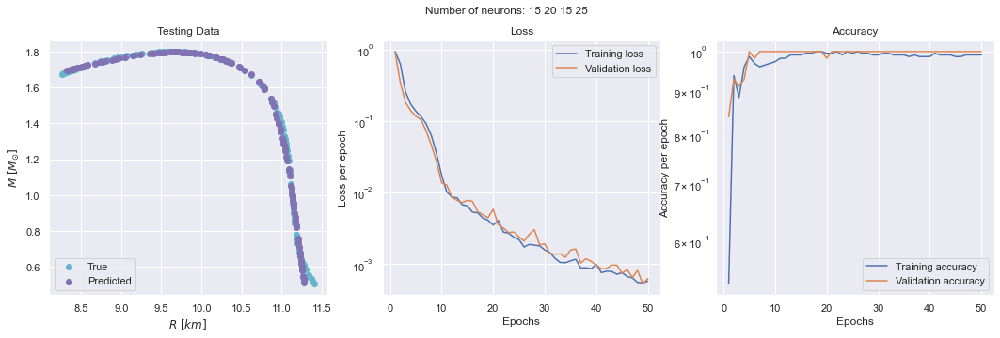

4/4 [==============================] - 0s 1ms/step
The Accuracy of ANN model is: 99.75693815586502


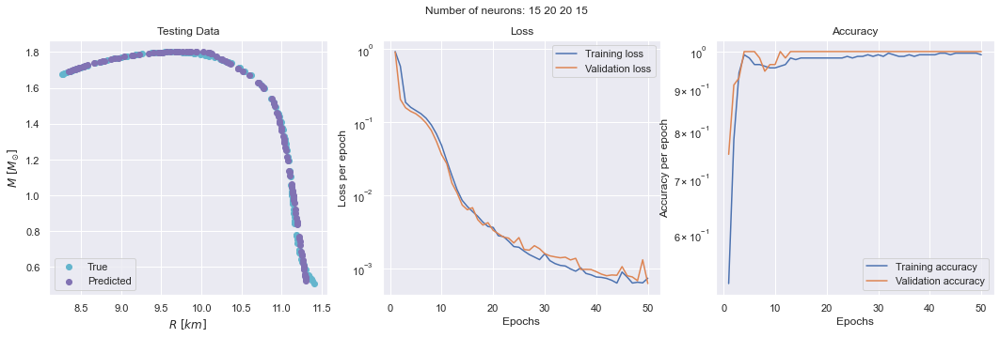

4/4 [==============================] - 0s 1ms/step
The Accuracy of ANN model is: 99.80761473061057


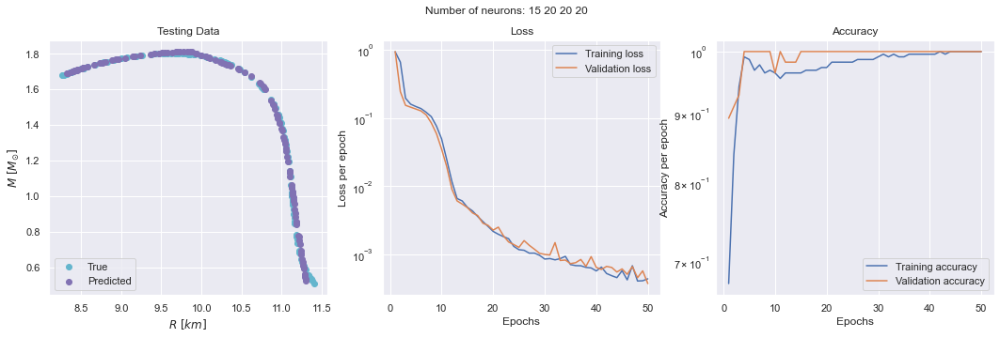

4/4 [==============================] - 0s 667us/step
The Accuracy of ANN model is: 99.83000873824734


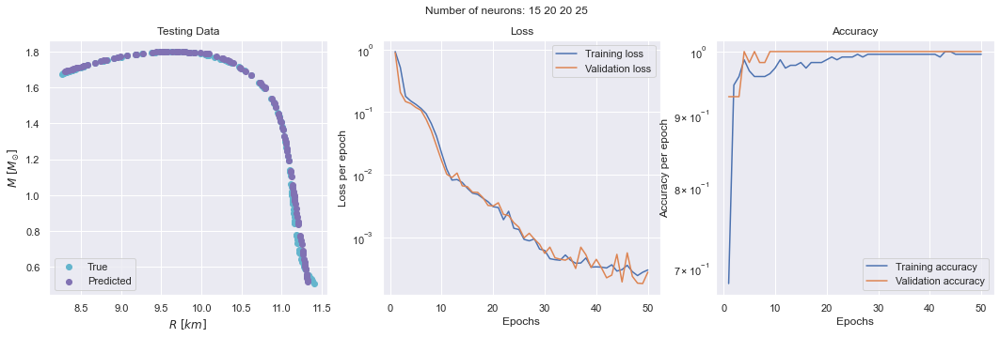

4/4 [==============================] - 0s 1ms/step
The Accuracy of ANN model is: 99.80212113409917


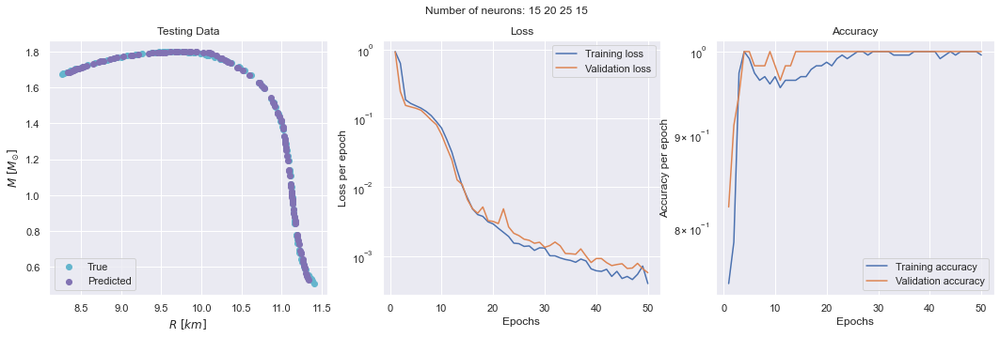

4/4 [==============================] - 0s 1ms/step
The Accuracy of ANN model is: 99.74865607547241


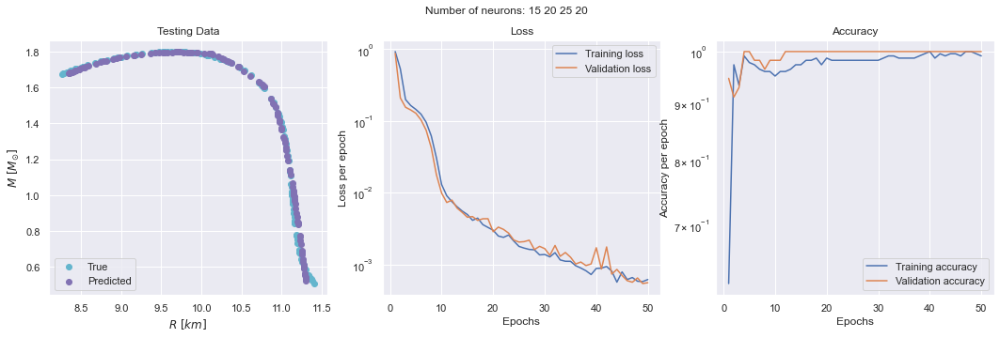

4/4 [==============================] - 0s 1ms/step
The Accuracy of ANN model is: 99.7874074822031


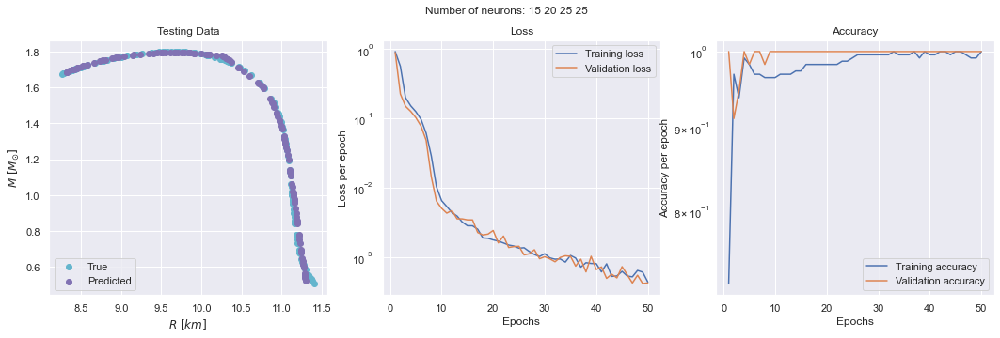

4/4 [==============================] - 0s 667us/step
The Accuracy of ANN model is: 99.73895142893713


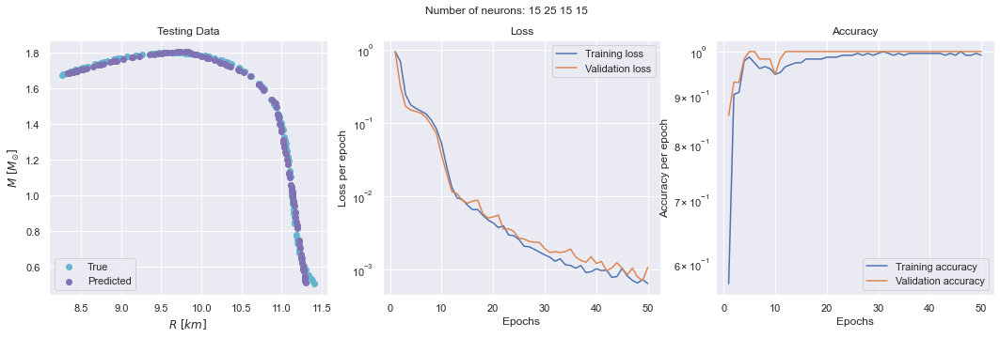

4/4 [==============================] - 0s 1ms/step
The Accuracy of ANN model is: 99.79175344560053


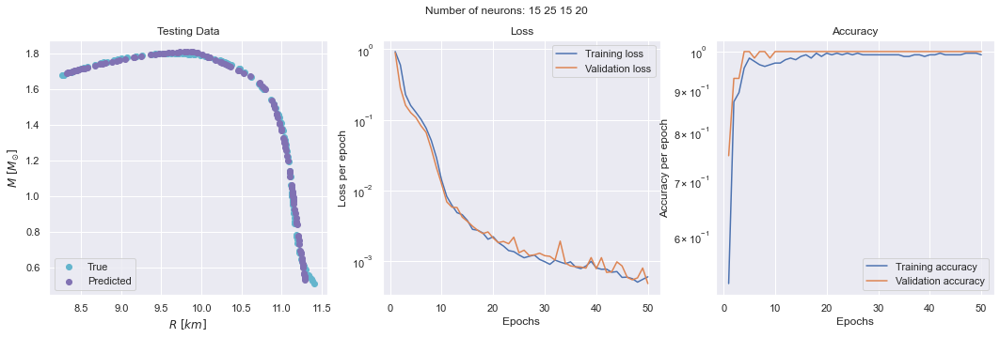

4/4 [==============================] - 0s 1ms/step
The Accuracy of ANN model is: 99.80420676705118


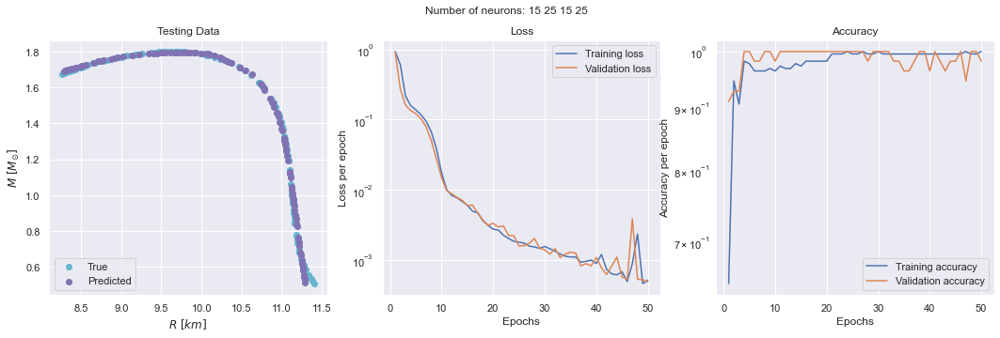

4/4 [==============================] - 0s 1ms/step
The Accuracy of ANN model is: 99.7850233354349


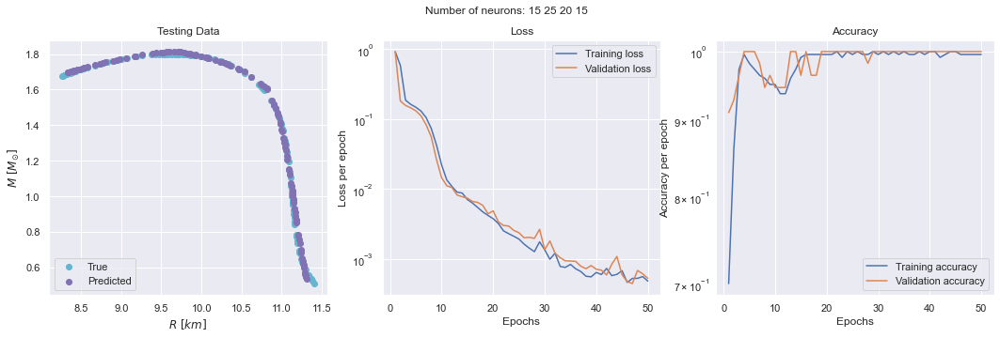

4/4 [==============================] - 0s 667us/step
The Accuracy of ANN model is: 99.80783657044721


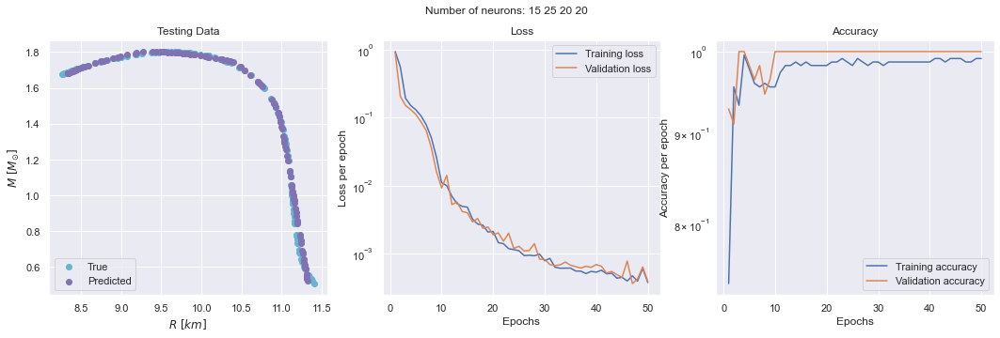

4/4 [==============================] - 0s 667us/step
The Accuracy of ANN model is: 99.7436273678236


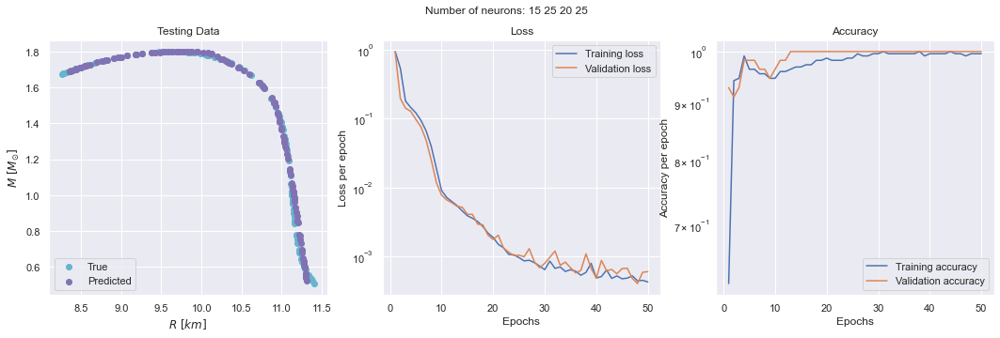

4/4 [==============================] - 0s 1ms/step
The Accuracy of ANN model is: 99.81979674993153


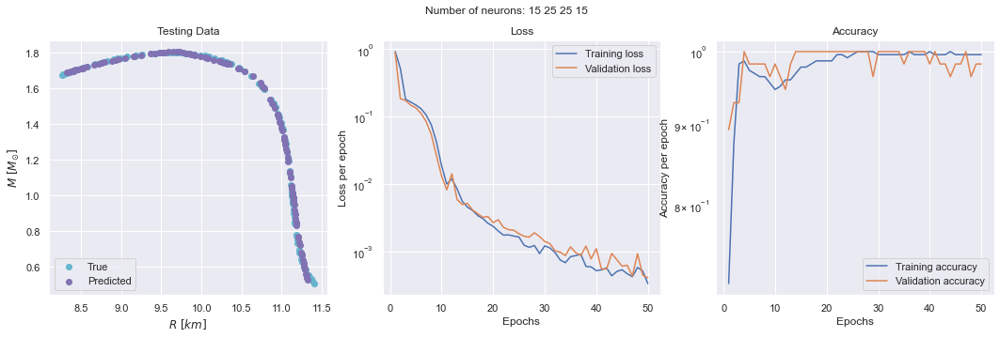

4/4 [==============================] - 0s 1ms/step
The Accuracy of ANN model is: 99.75269759838719


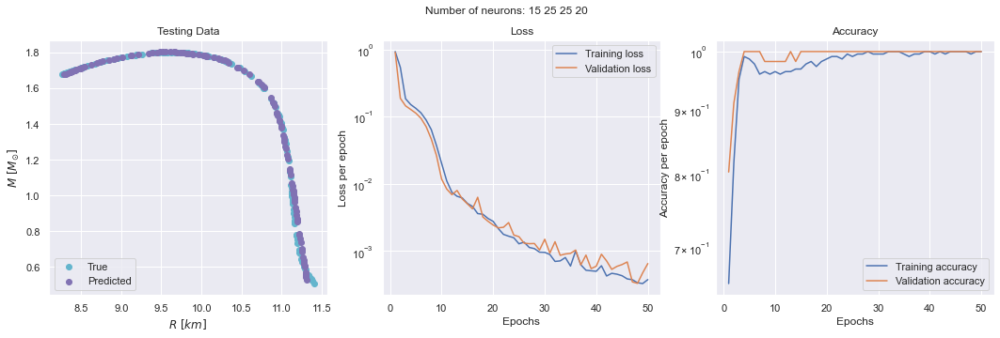

4/4 [==============================] - 0s 667us/step
The Accuracy of ANN model is: 99.80084117813333


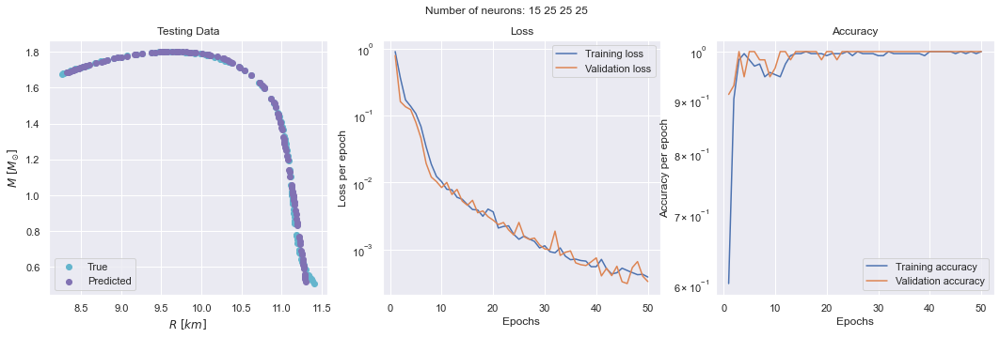

4/4 [==============================] - 0s 667us/step
The Accuracy of ANN model is: 99.68884943180585


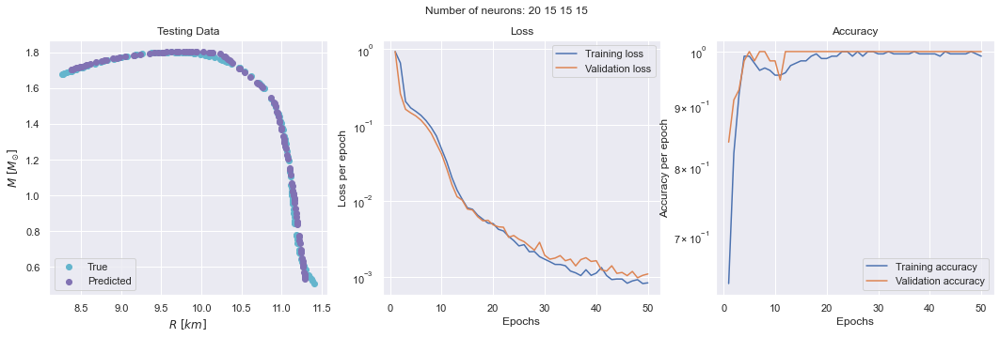

4/4 [==============================] - 0s 1ms/step
The Accuracy of ANN model is: 99.74895038511461


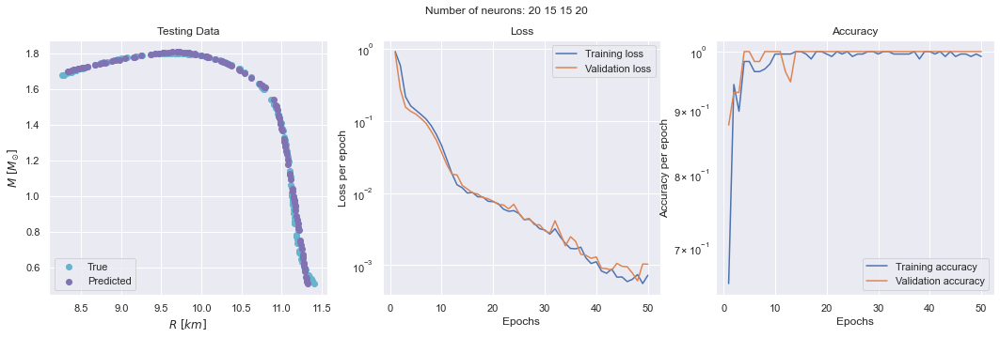

4/4 [==============================] - 0s 667us/step
The Accuracy of ANN model is: 99.80063121493704


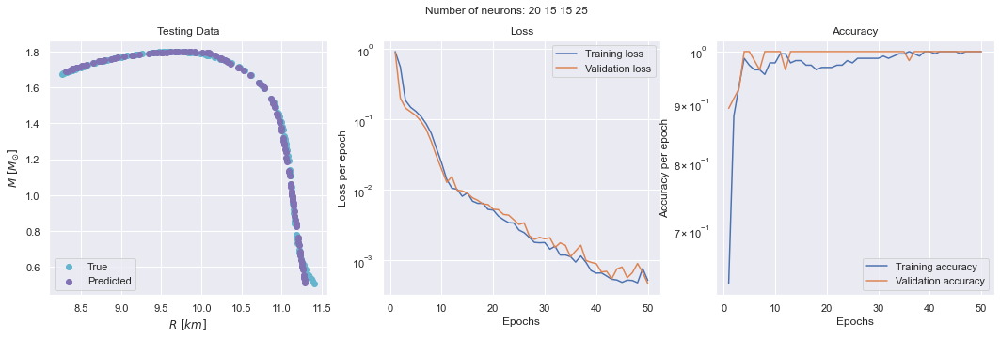

4/4 [==============================] - 0s 667us/step
The Accuracy of ANN model is: 99.78659599943234


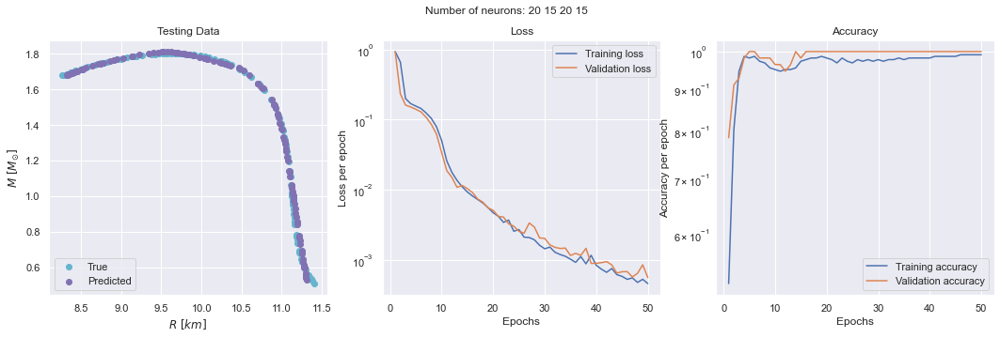

4/4 [==============================] - 0s 1ms/step
The Accuracy of ANN model is: 99.74251941950163


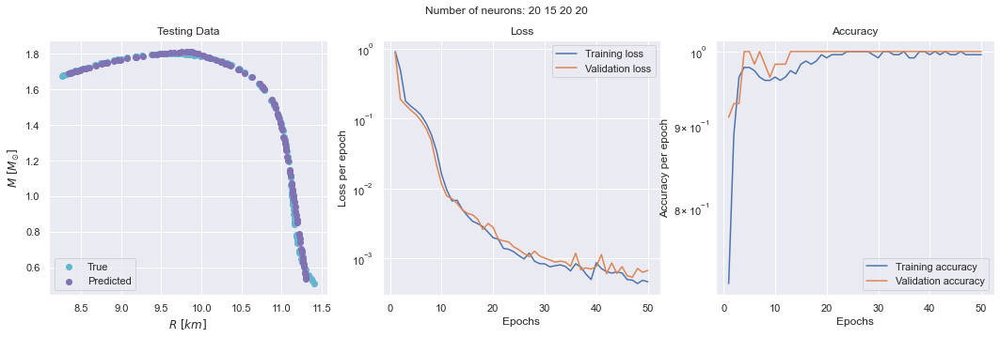

4/4 [==============================] - 0s 1ms/step
The Accuracy of ANN model is: 99.81295141624663


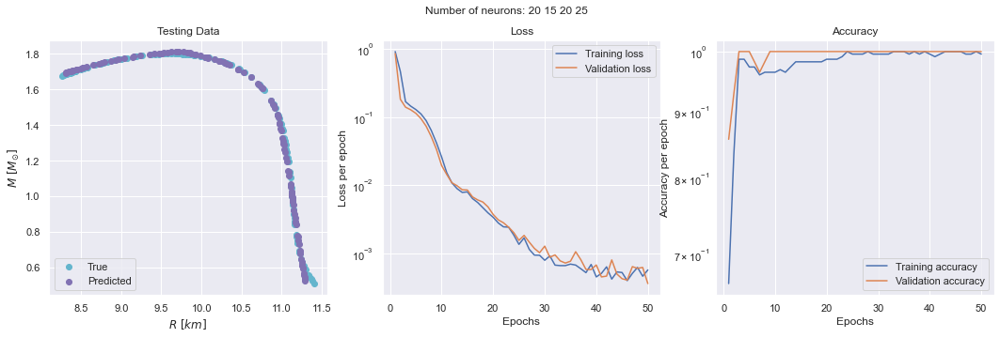

4/4 [==============================] - 0s 667us/step
The Accuracy of ANN model is: 99.86055414997679


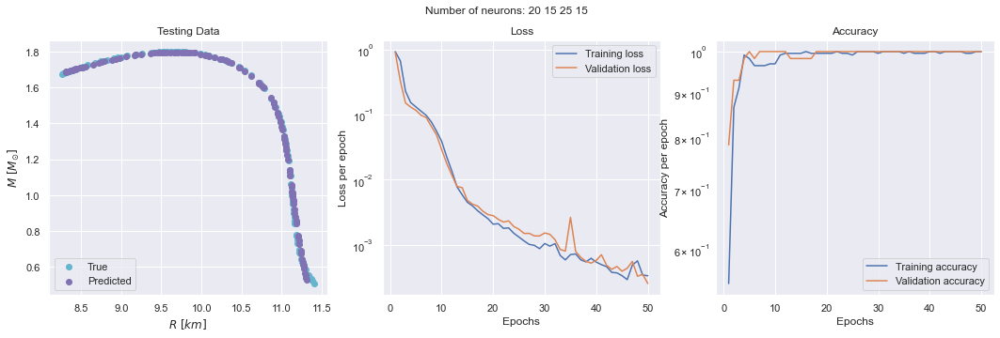

4/4 [==============================] - 0s 1ms/step
The Accuracy of ANN model is: 99.77197201815497


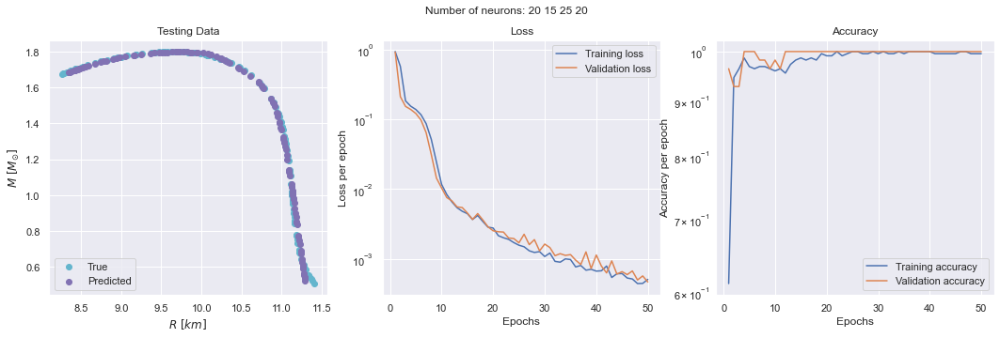

4/4 [==============================] - 0s 1ms/step
The Accuracy of ANN model is: 99.83142245600652


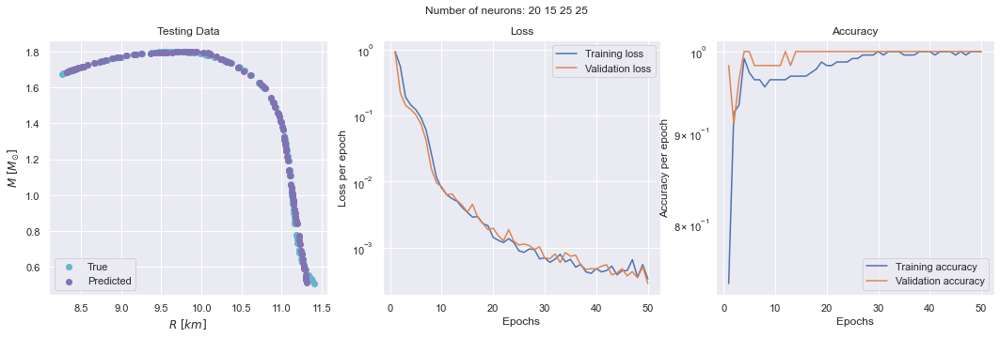

4/4 [==============================] - 0s 1ms/step
The Accuracy of ANN model is: 99.84492359106308


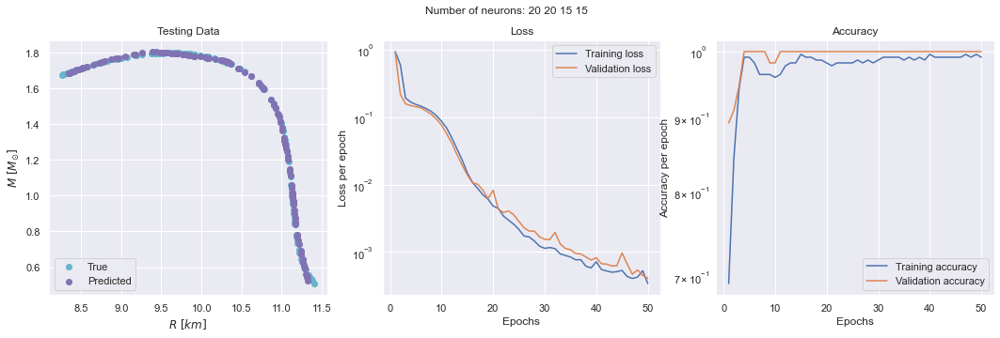

4/4 [==============================] - 0s 667us/step
The Accuracy of ANN model is: 99.7331197021568


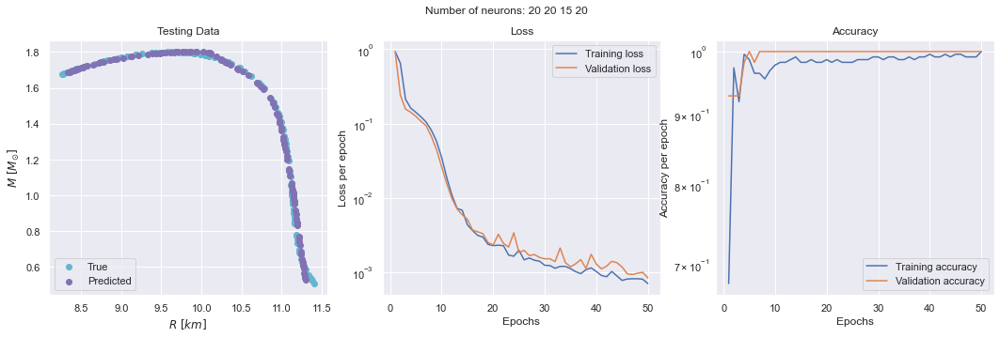

4/4 [==============================] - 0s 1ms/step
The Accuracy of ANN model is: 99.75656817250446


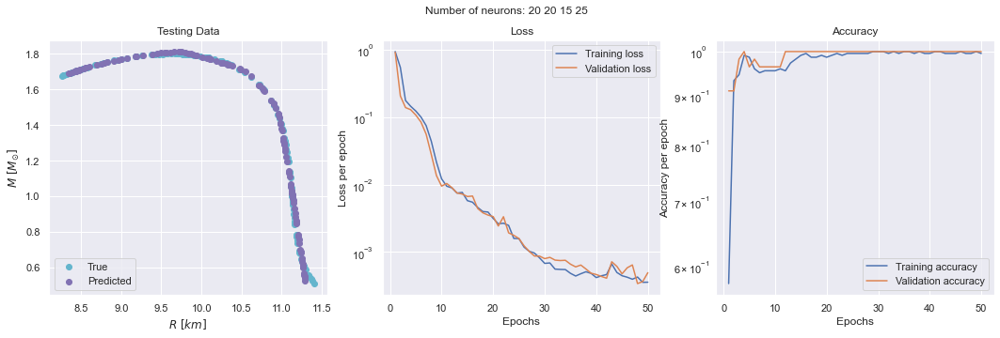

4/4 [==============================] - 0s 1ms/step
The Accuracy of ANN model is: 99.841995202717


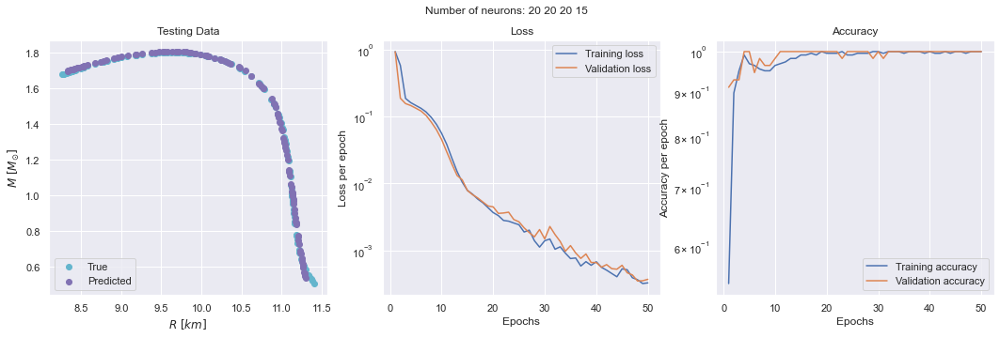

4/4 [==============================] - 0s 667us/step
The Accuracy of ANN model is: 99.74232803465272


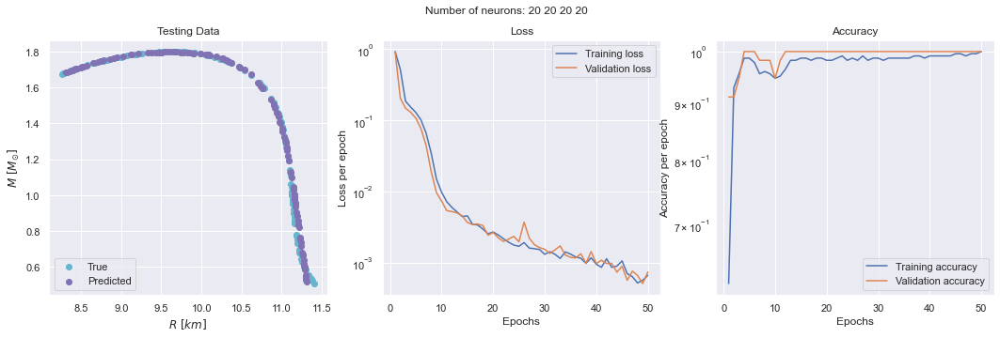

4/4 [==============================] - 0s 1ms/step
The Accuracy of ANN model is: 99.75453443635547


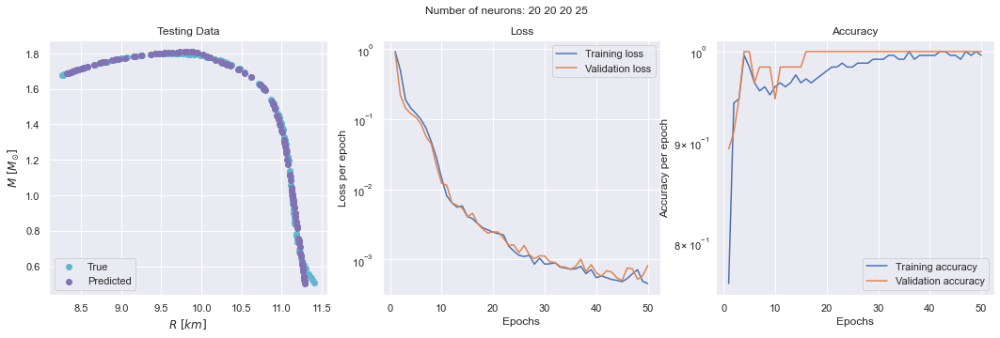

4/4 [==============================] - 0s 1ms/step
The Accuracy of ANN model is: 99.80691980093631


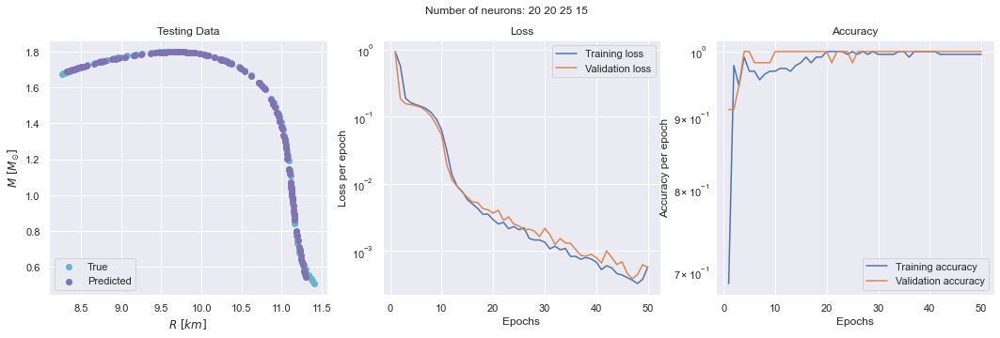

4/4 [==============================] - 0s 1ms/step
The Accuracy of ANN model is: 99.81706873930311


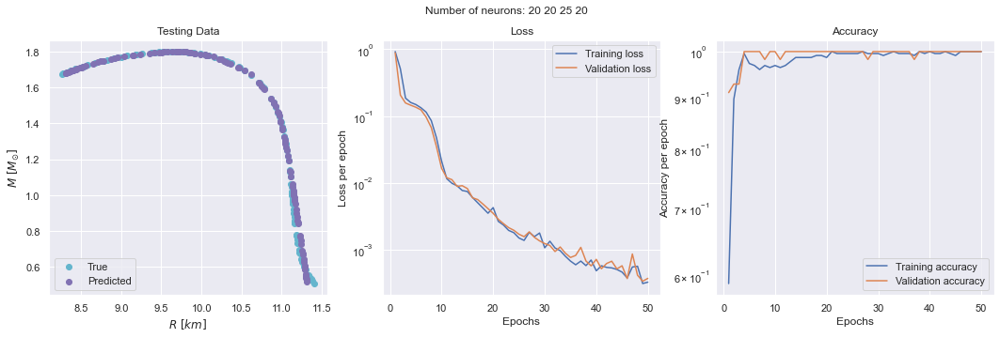

4/4 [==============================] - 0s 1ms/step
The Accuracy of ANN model is: 99.69351304485177


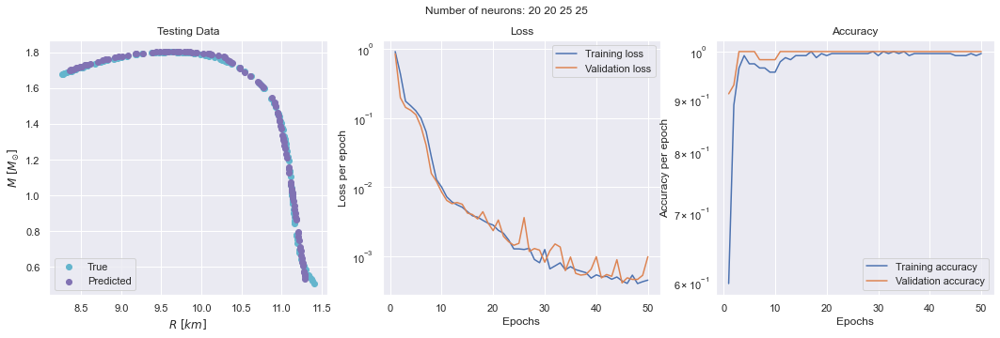

4/4 [==============================] - 0s 1ms/step
The Accuracy of ANN model is: 99.66337844591872


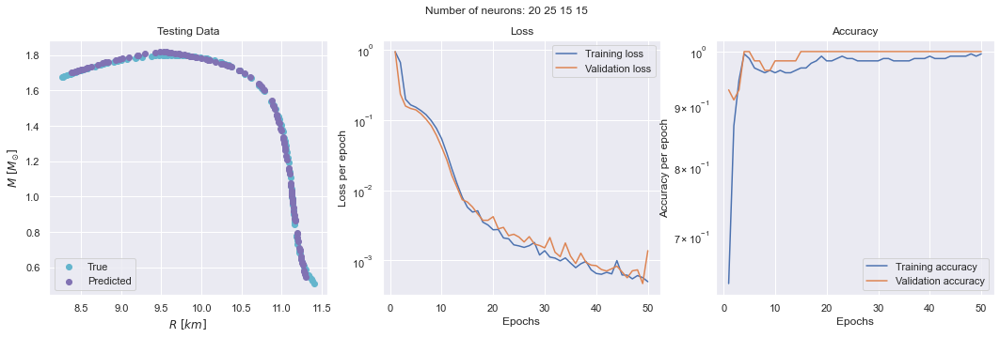

4/4 [==============================] - 0s 667us/step
The Accuracy of ANN model is: 99.77510342354752


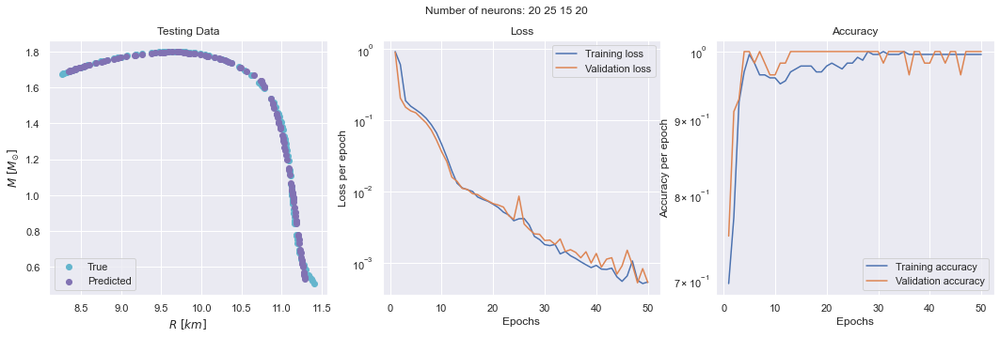

4/4 [==============================] - 0s 667us/step
The Accuracy of ANN model is: 99.75959478536886


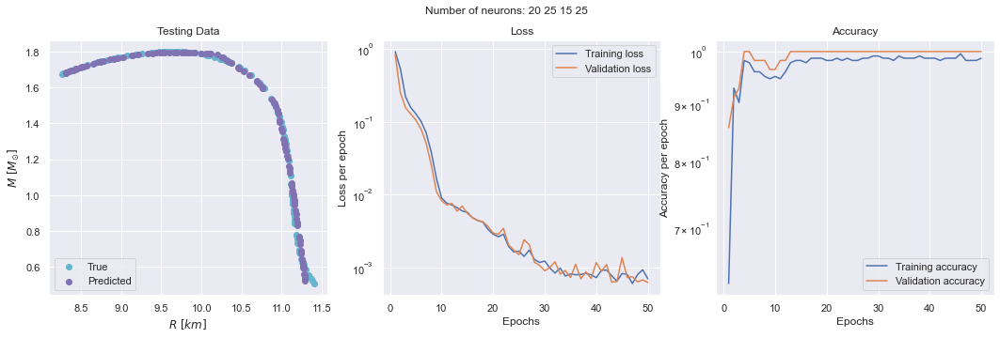

4/4 [==============================] - 0s 667us/step
The Accuracy of ANN model is: 99.733227951861


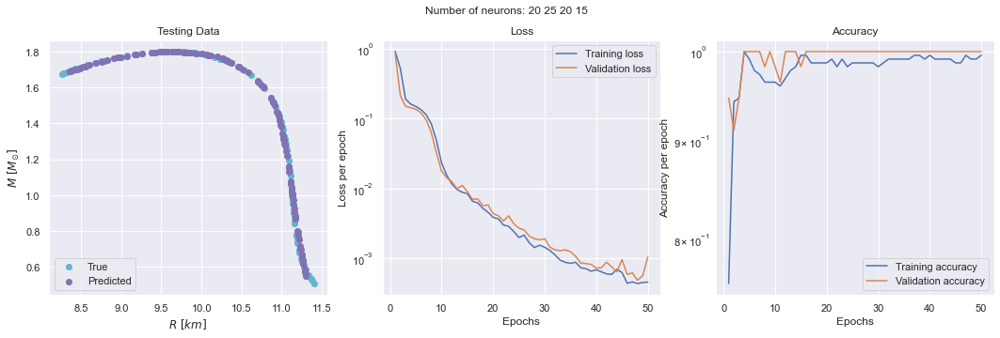

4/4 [==============================] - 0s 1ms/step
The Accuracy of ANN model is: 99.77371946157996


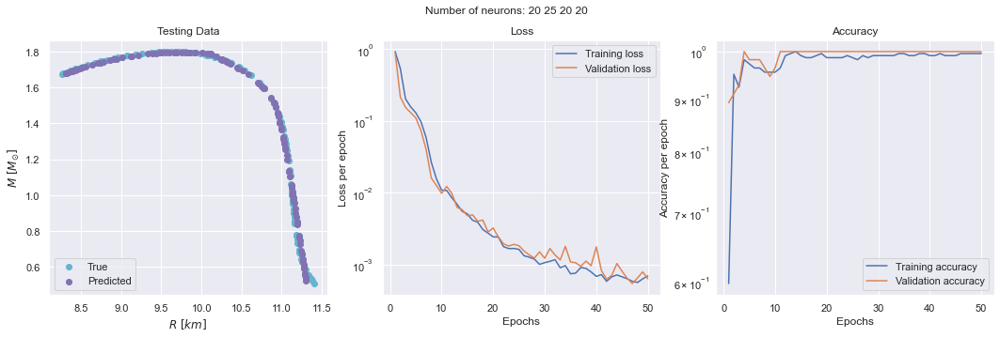

4/4 [==============================] - 0s 1ms/step
The Accuracy of ANN model is: 99.80288291182408


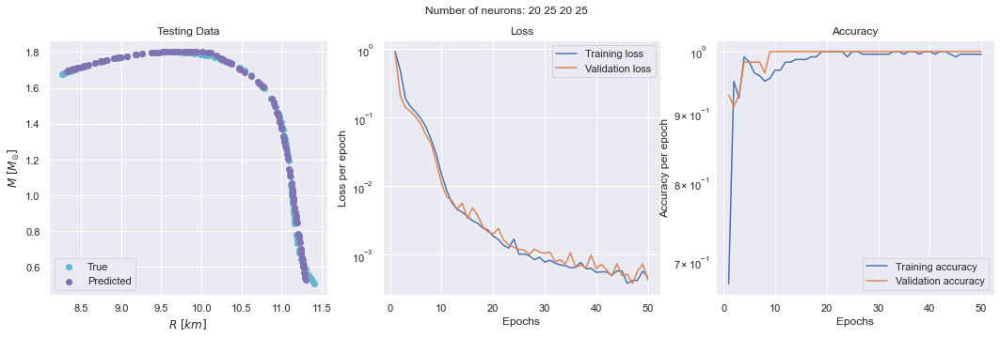

4/4 [==============================] - 0s 666us/step
The Accuracy of ANN model is: 99.88233532338388


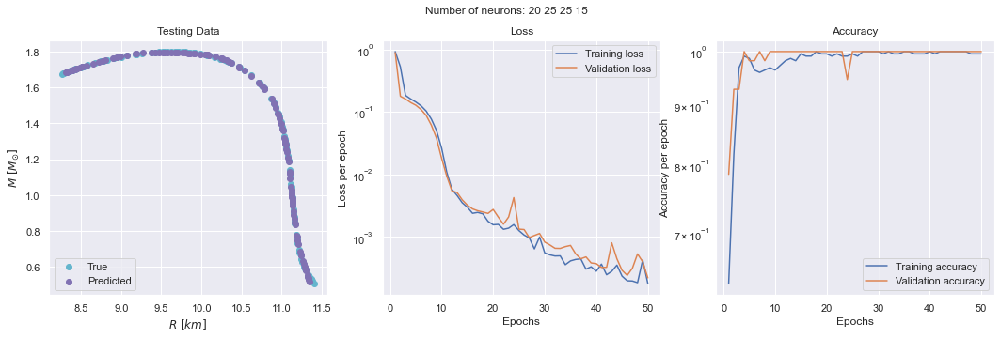

4/4 [==============================] - 0s 667us/step
The Accuracy of ANN model is: 99.83196944180338


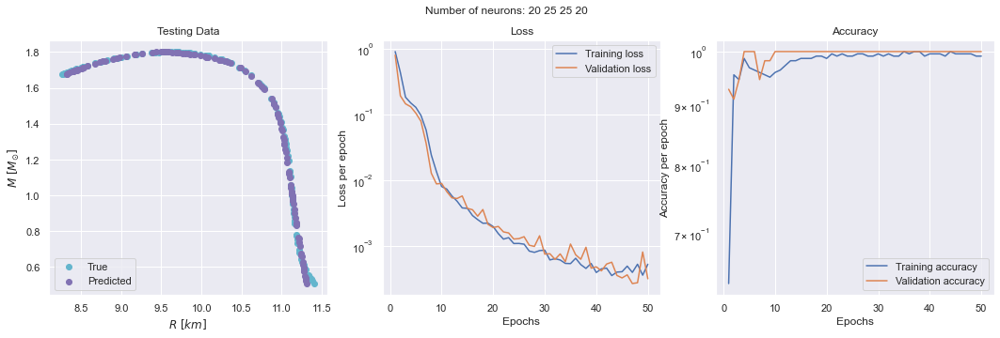

4/4 [==============================] - 0s 667us/step
The Accuracy of ANN model is: 99.84673746984504


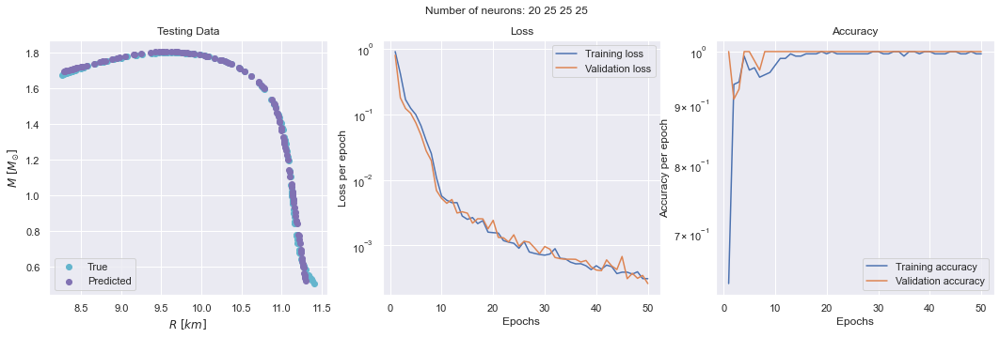

4/4 [==============================] - 0s 1ms/step
The Accuracy of ANN model is: 99.8109993481942


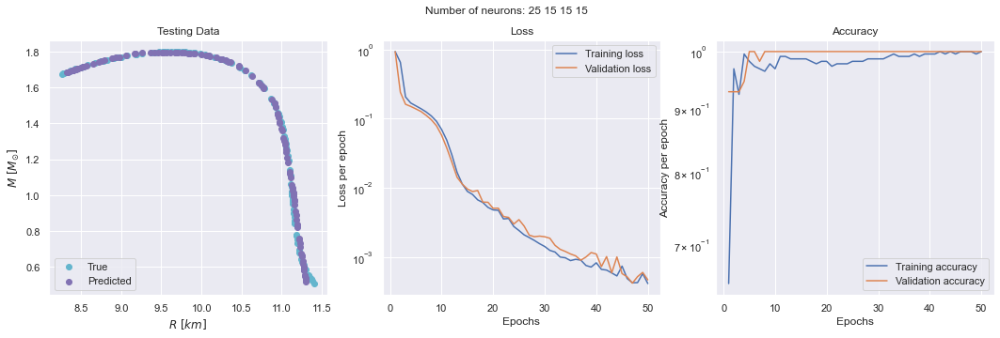

4/4 [==============================] - 0s 667us/step
The Accuracy of ANN model is: 99.76402722866257


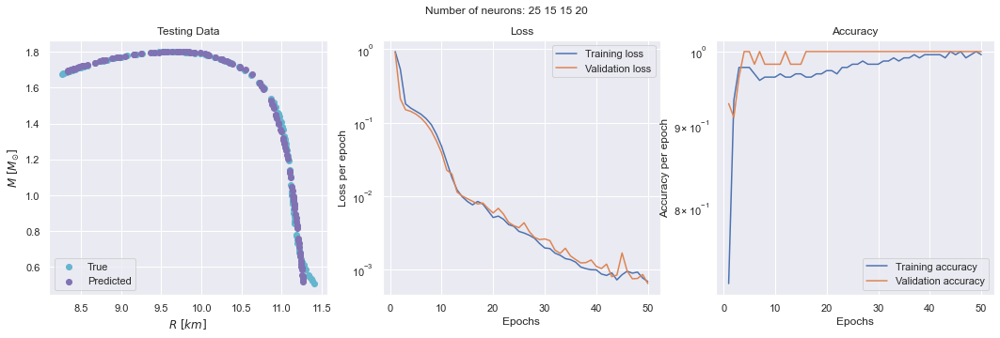

4/4 [==============================] - 0s 1ms/step
The Accuracy of ANN model is: 99.7390991448164


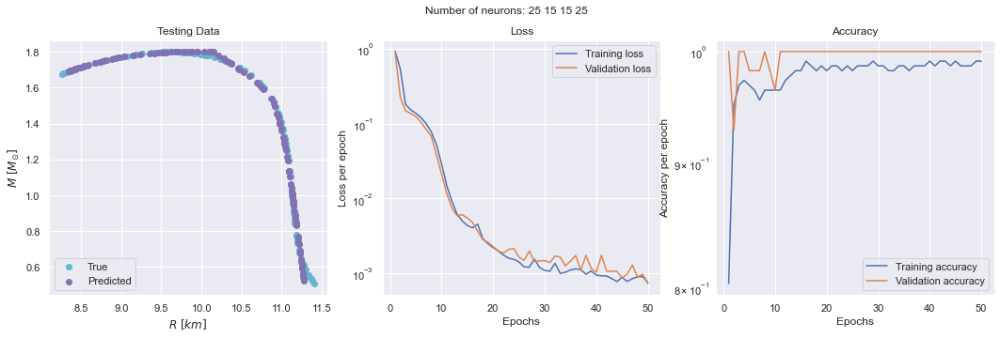

4/4 [==============================] - 0s 1ms/step
The Accuracy of ANN model is: 99.76798404638525


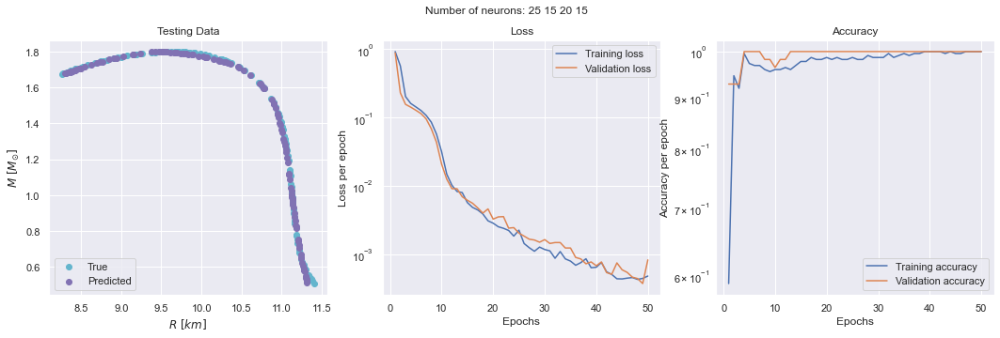

4/4 [==============================] - 0s 1ms/step
The Accuracy of ANN model is: 99.80523072871972


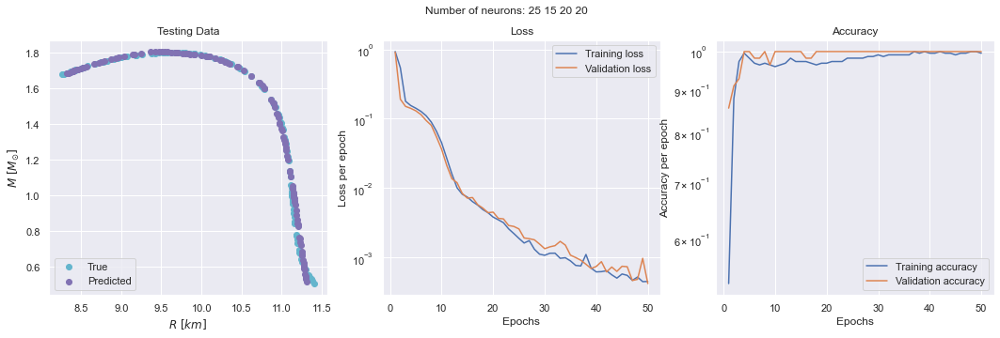

4/4 [==============================] - 0s 1ms/step
The Accuracy of ANN model is: 99.7280118230244


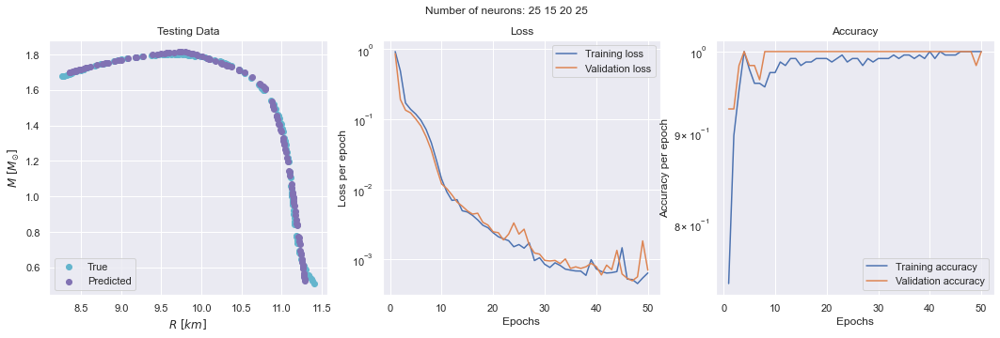

4/4 [==============================] - 0s 1000us/step
The Accuracy of ANN model is: 99.80671445177371


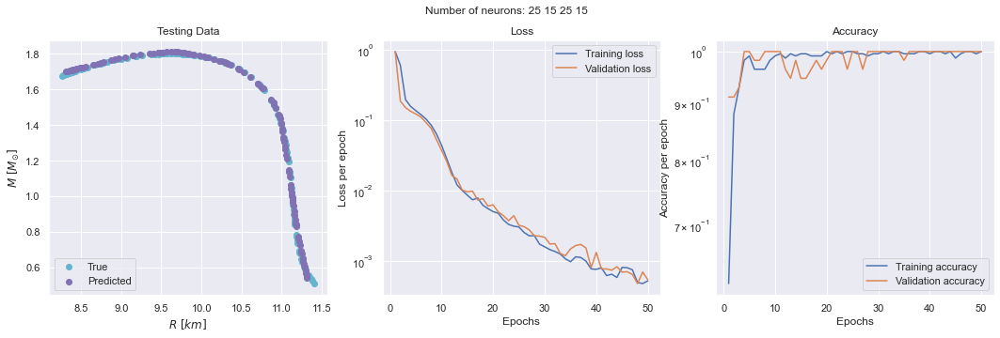

4/4 [==============================] - 0s 1ms/step
The Accuracy of ANN model is: 99.83047171722966


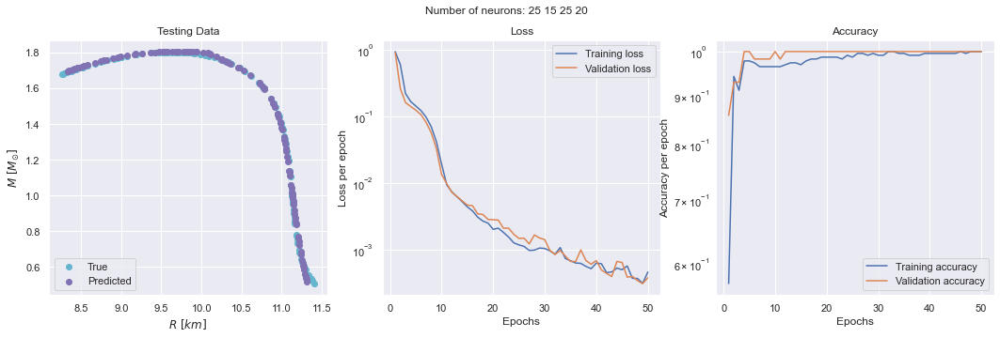

4/4 [==============================] - 0s 1ms/step
The Accuracy of ANN model is: 99.84450773277116


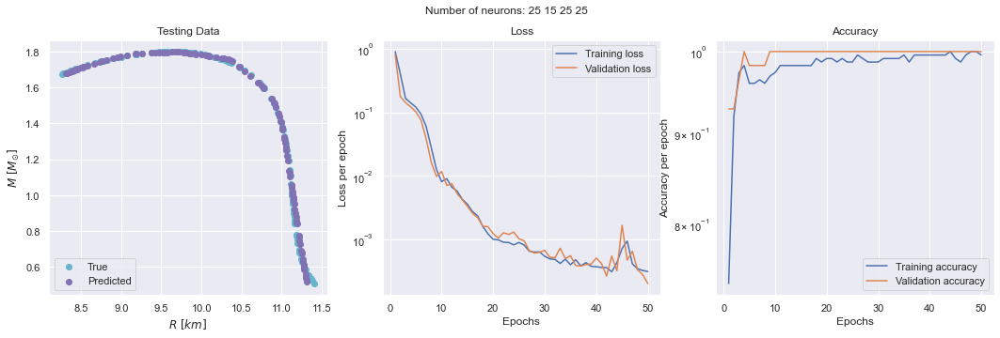

4/4 [==============================] - 0s 667us/step
The Accuracy of ANN model is: 99.77663523545532


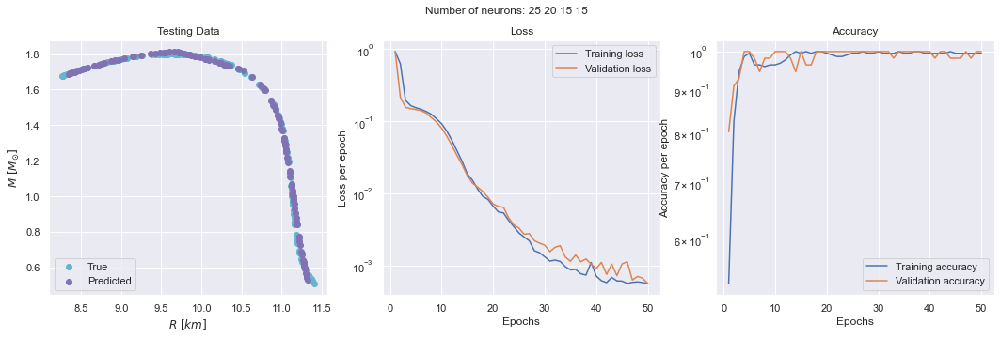

4/4 [==============================] - 0s 1ms/step
The Accuracy of ANN model is: 99.79845248671481


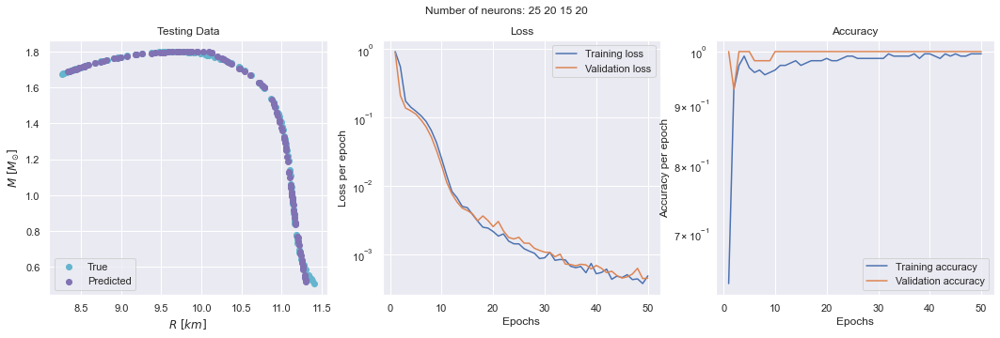

4/4 [==============================] - 0s 1ms/step
The Accuracy of ANN model is: 99.77555318583723


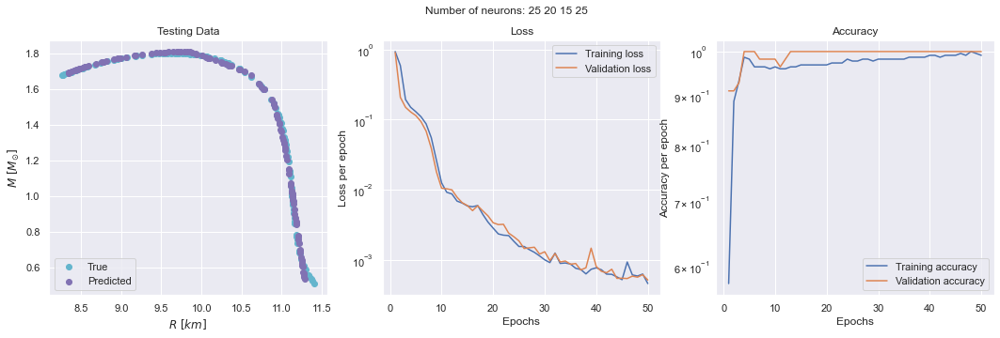

4/4 [==============================] - 0s 1ms/step
The Accuracy of ANN model is: 99.81165354793355


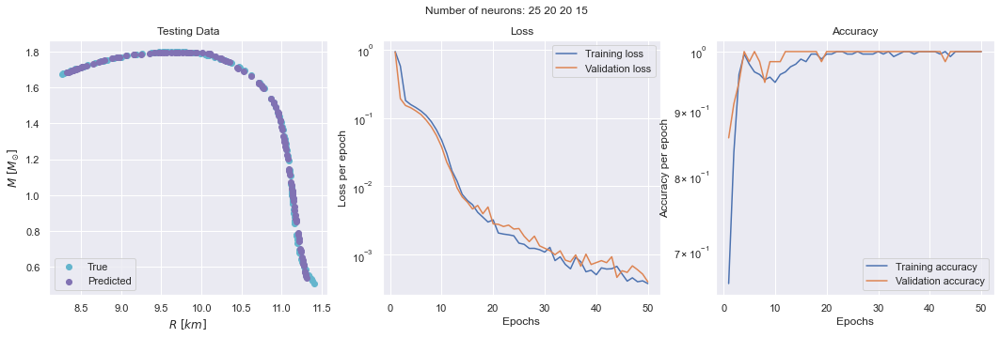

4/4 [==============================] - 0s 1ms/step
The Accuracy of ANN model is: 99.80771350948537


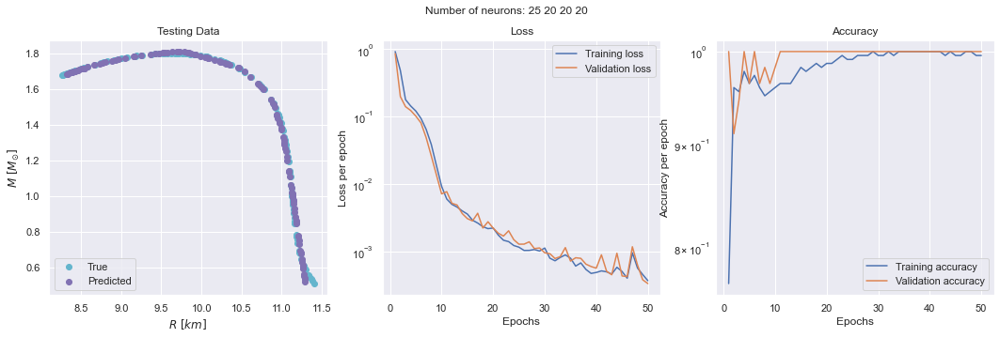

4/4 [==============================] - 0s 667us/step
The Accuracy of ANN model is: 99.83667097077817


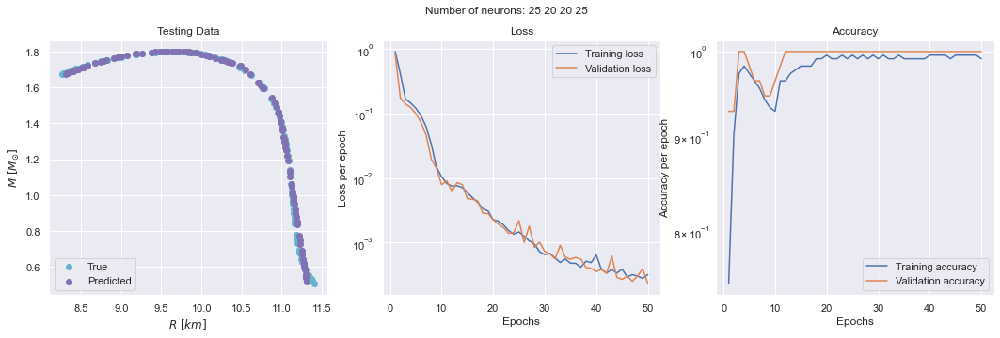

4/4 [==============================] - 0s 1ms/step
The Accuracy of ANN model is: 99.78428919922597


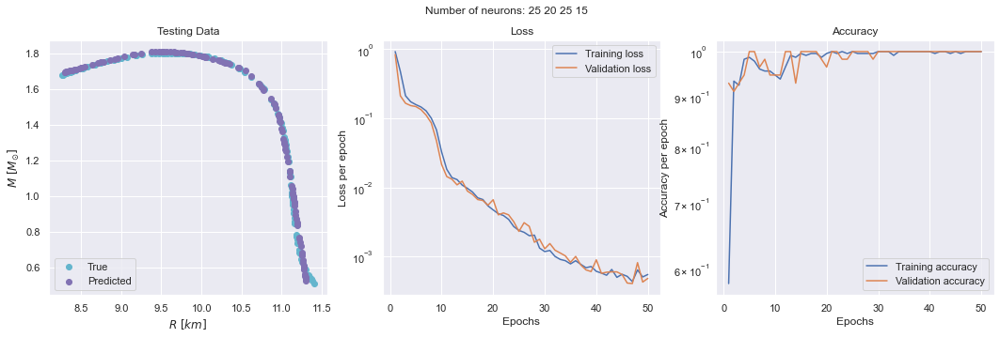

4/4 [==============================] - 0s 667us/step
The Accuracy of ANN model is: 99.85367742752557


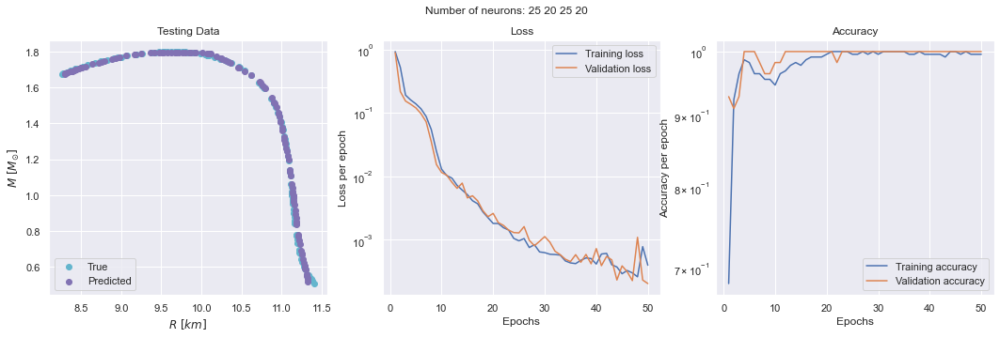

4/4 [==============================] - 0s 1000us/step
The Accuracy of ANN model is: 99.83296096001634


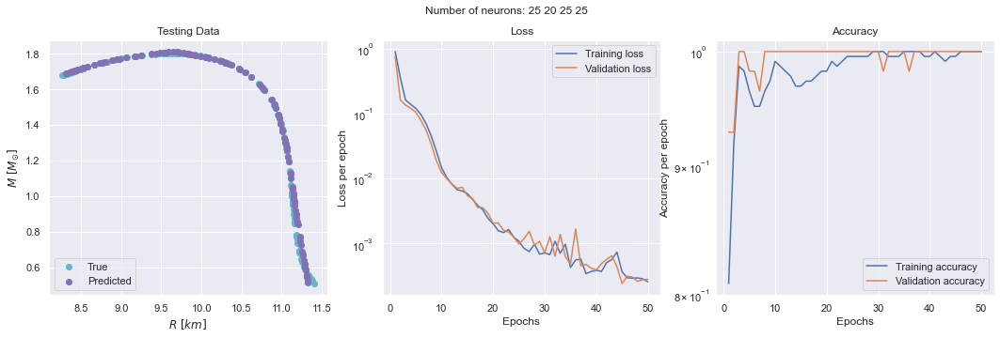

4/4 [==============================] - 0s 1ms/step
The Accuracy of ANN model is: 99.75362914151629


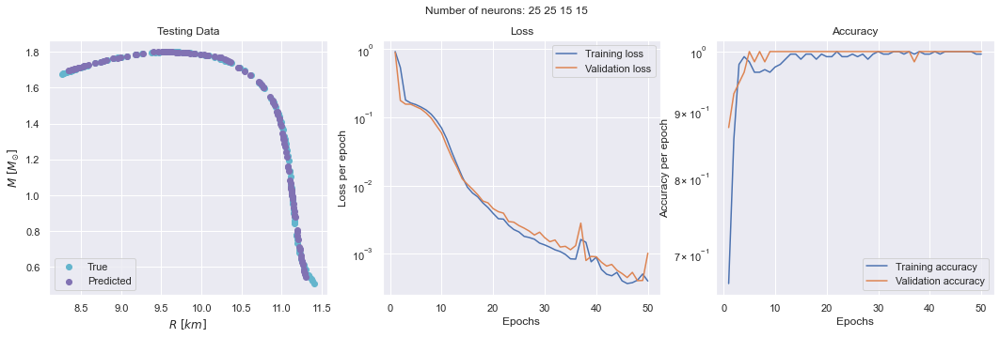

4/4 [==============================] - 0s 667us/step
The Accuracy of ANN model is: 99.81081907017126


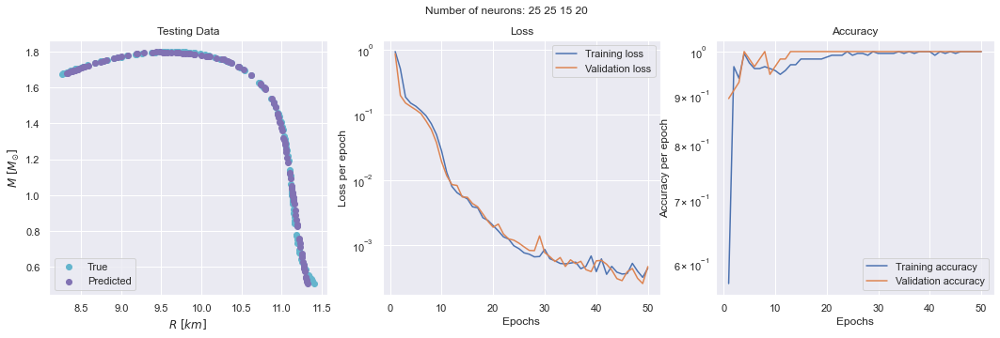

4/4 [==============================] - 0s 667us/step
The Accuracy of ANN model is: 99.6549205030511


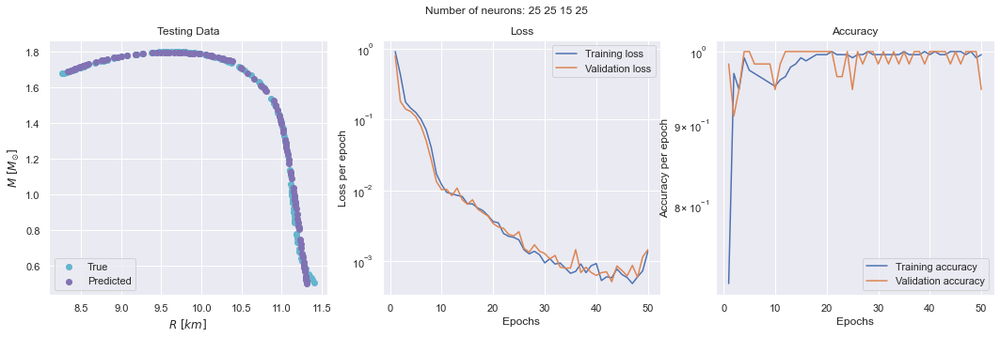

4/4 [==============================] - 0s 1ms/step
The Accuracy of ANN model is: 99.85205557485887


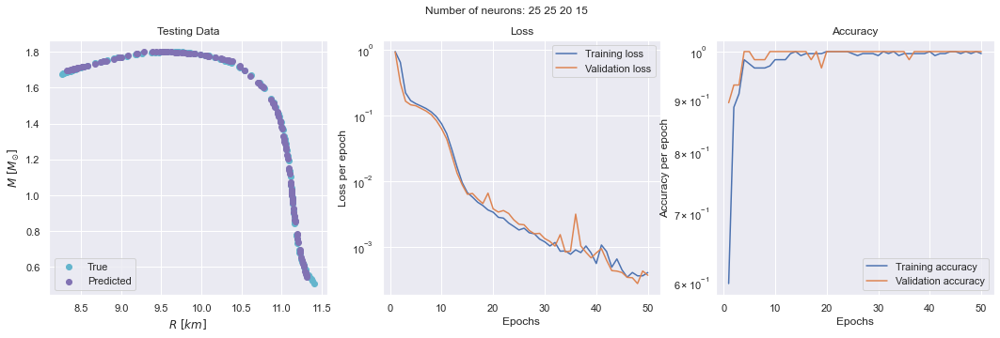

4/4 [==============================] - 0s 1ms/step
The Accuracy of ANN model is: 99.80819865366743


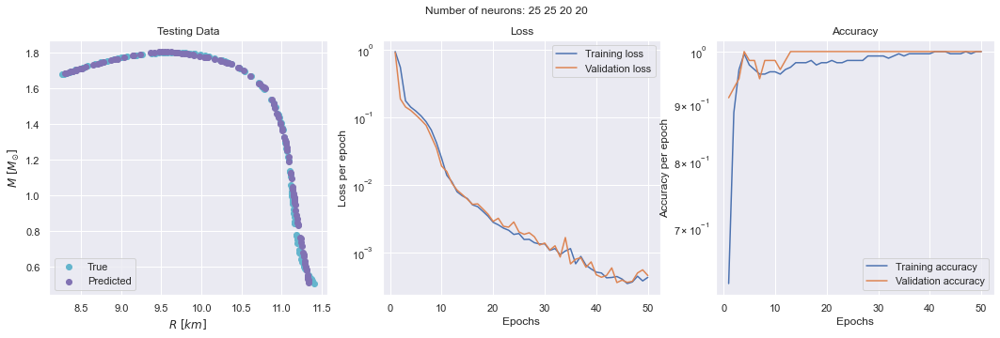

4/4 [==============================] - 0s 1ms/step
The Accuracy of ANN model is: 99.8499664784852


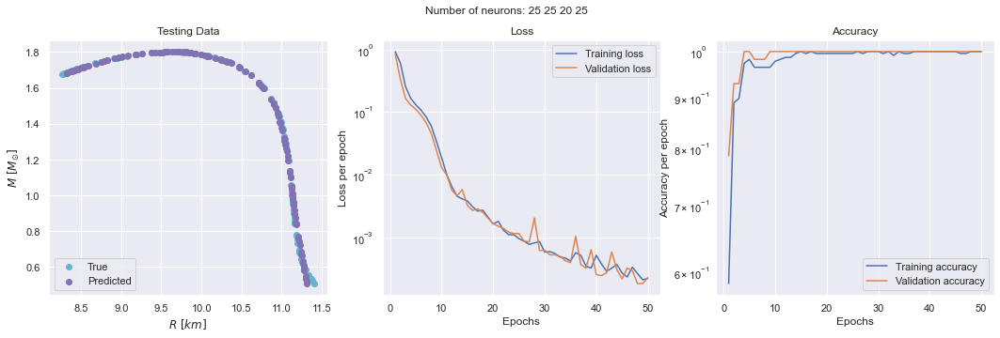

4/4 [==============================] - 0s 1ms/step
The Accuracy of ANN model is: 99.8429060543947


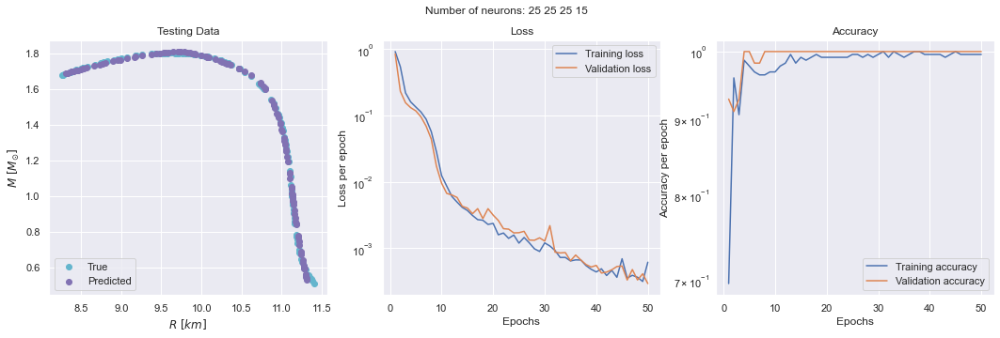

4/4 [==============================] - 0s 1ms/step
The Accuracy of ANN model is: 99.82979908588564


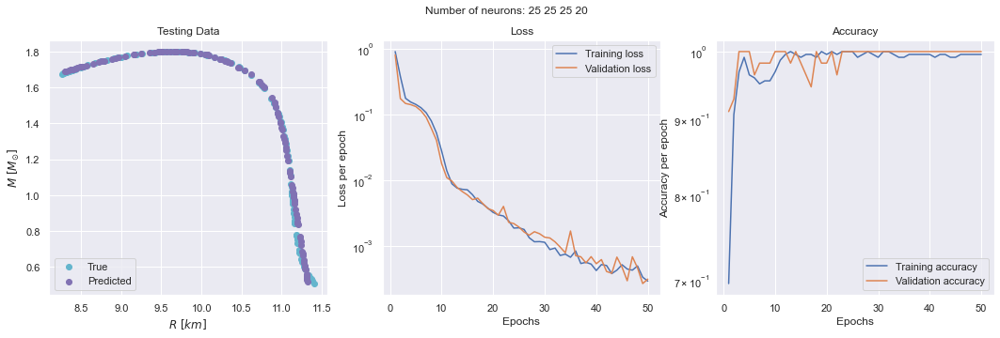

4/4 [==============================] - 0s 1ms/step
The Accuracy of ANN model is: 99.8373540227747


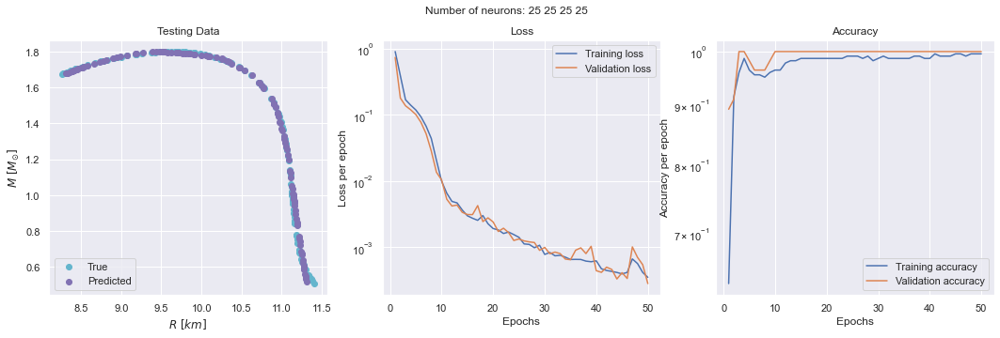

In [ ]:
eps         = 50
neuron_list = [15,20,25]
ape_list    = []
accur_list  = []
neu_list    = []
dist_list   = []

for i in neuron_list:
    for j in neuron_list:
        for k in neuron_list:
            for l in neuron_list:
                
                model = Sequential()
                
                model.add(Dense(units = i, input_dim=X_train.shape[1], kernel_initializer='normal', activation='tanh'))

                model.add(Dense(units = j, kernel_initializer='normal', activation='tanh'))

                model.add(Dense(units = k, kernel_initializer='normal', activation='relu'))

                model.add(Dense(units = l, kernel_initializer='normal', activation='tanh'))

#                 model.add(Dense(units=20, kernel_initializer='normal', activation='relu'))

                model.add(Dense(2, kernel_initializer='normal'))


                
                model.compile(loss='mean_squared_error', optimizer='adam', metrics=['accuracy'])

                trial = model.fit(X_train, y_train ,batch_size = 5, epochs = eps, verbose=0, validation_split = 0.2)

                Predictions=model.predict(X_test)

                Predictions=TargetVarScalerFit.inverse_transform(Predictions)

                y_test_orig=TargetVarScalerFit.inverse_transform(y_test)

                Test_Data=PredictorScalerFit.inverse_transform(X_test)

                TestingData=pd.DataFrame(data=Test_Data, columns=Predictors)

                TestingData['M'] = y_test_orig.T[0]
                TestingData['R'] = y_test_orig.T[1]

                TestingData['M_pred'] = Predictions.T[0]
                TestingData['R_pred'] = Predictions.T[1]

                Testing_norm   = np.sqrt(TestingData.M.values**2 + TestingData.R.values**2)
                Predicted_norm = np.sqrt(TestingData.M_pred.values**2 + TestingData.R_pred.values**2)
                Test_pred_norm = np.sqrt((TestingData.M.values-TestingData.M_pred.values)**2 + (TestingData.R.values-TestingData.R_pred.values)**2)


                APE=100*(Test_pred_norm/Testing_norm)
                TestingData['APE']=APE

                print('The Accuracy of ANN model is:', 100-np.mean(APE))

                import matplotlib.pyplot as plt
                x1 = TestingData.R.values
                y1 = TestingData.M.values

                x2 = TestingData.R_pred.values
                y2 = TestingData.M_pred.values

                fig, ax = plt.subplots(1, 3, figsize=(18,5))
                ax[0].scatter(x1,y1, color = 'c', label = 'True')
                ax[0].scatter(x2,y2, color = 'm', label = 'Predicted')
                ax[0].legend()
                ax[0].set_xlabel('$ R \ [km] $')
                ax[0].set_ylabel('$ M \ [M_{\odot}] $')
                ax[0].set_title("Testing Data")


                val_loss_list = trial.history['val_loss']
                loss_list     = trial.history['loss']
                epos          = np.linspace(1,eps,eps)
                ax[1].semilogy(epos, loss_list    , label = 'Training loss')
                ax[1].semilogy(epos, val_loss_list, label = 'Validation loss')
                ax[1].set_xlabel('Epochs')
                ax[1].set_ylabel('Loss per epoch')
                ax[1].legend()
                ax[1].set_title("Loss")

                val_acc_list = trial.history['val_accuracy']
                acc_list     = trial.history['accuracy']
                epos         = np.linspace(1,eps,eps)
                ax[2].semilogy(epos, acc_list    , label = 'Training accuracy')
                ax[2].semilogy(epos, val_acc_list, label = 'Validation accuracy')
                ax[2].set_xlabel('Epochs')
                ax[2].set_ylabel('Accuracy per epoch')
                ax[2].legend()
                ax[2].set_title("Accuracy")

                distance = np.array(acc_list)-np.array(val_acc_list)
                distance = np.mean(distance[-10:])
                
                neu_list.append(str(i)+" "+str(j)+" "+str(k)+" "+str(l))
                ape_list.append(100-np.mean(APE))
                dist_list.append(distance)
                accur_list.append(np.mean(acc_list))
                
                fig.suptitle('Number of neurons: '+str(i)+" "+str(j)+" "+str(k)+" "+str(l))
                plt.show()

In [ ]:
df = pd.DataFrame({})
df['neurons']    = neu_list
df['ape']        = ape_list
df['mean_acc']   = accur_list
df['final_dist'] = dist_list
# df.to_pickle(r'C:\Users\admin\Desktop\Γιάννης\Πτυχιακή\files\layers_4_to_choose.pkl')

C:\Users\admin\AppData\Local\Temp\ipykernel_1072\400994383.py:14: MatplotlibDeprecationWarning: Support for passing numbers through unit converters is deprecated since 3.5 and support will be removed two minor releases later; use Axis.convert_units instead.
  ax[0].scatter(x[y1 > 99.9], y1[y1 > 99.9], color = 'r')
C:\Users\admin\AppData\Local\Temp\ipykernel_1072\400994383.py:18: MatplotlibDeprecationWarning: Support for passing numbers through unit converters is deprecated since 3.5 and support will be removed two minor releases later; use Axis.convert_units instead.
  ax[1].scatter(x[y2 > 0.99], y2[y2 > 0.99], color = 'r')
C:\Users\admin\AppData\Local\Temp\ipykernel_1072\400994383.py:22: MatplotlibDeprecationWarning: Support for passing numbers through unit converters is deprecated since 3.5 and support will be removed two minor releases later; use Axis.convert_units instead.
  ax[2].scatter(x[y1 > 99.9], y3[y1 > 99.9], color = 'r', label = 'APE filter')
C:\Users\admin\AppData\Local\T

APE filter: []
Accuracy filter: []


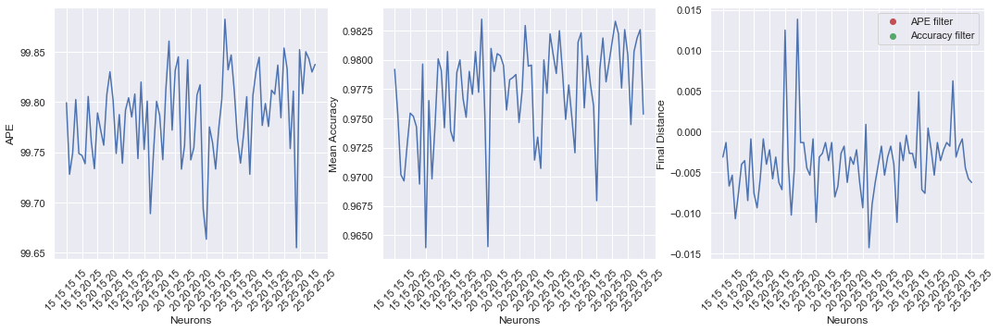

In [ ]:
# df = pd.read_pickle(r'C:\Users\admin\Desktop\Γιάννης\Πτυχιακή\files\layers_4_to_choose.pkl')


x  = df.neurons.values
y1 = df.ape.values
y2 = df.mean_acc.values
y3 = df.final_dist.values

import matplotlib.pyplot as plt

fig, ax = plt.subplots(1, 3, figsize=(18,5))
ax[0].plot(x,y1)
ax[0].set_ylabel('APE')
ax[0].scatter(x[y1 > 99.9], y1[y1 > 99.9], color = 'r')

ax[1].plot(x,y2)
ax[1].set_ylabel('Mean Accuracy')
ax[1].scatter(x[y2 > 0.99], y2[y2 > 0.99], color = 'r')

ax[2].plot(x,y3)
ax[2].set_ylabel('Final Distance')
ax[2].scatter(x[y1 > 99.9], y3[y1 > 99.9], color = 'r', label = 'APE filter')
ax[2].scatter(x[y2 > 0.99], y3[y2 > 0.99], color = 'g', label = 'Accuracy filter')
ax[2].legend()


ax[0].set_xlabel('Neurons')
ax[1].set_xlabel('Neurons')
ax[2].set_xlabel('Neurons')
ax[0].xaxis.set_major_locator(plt.MaxNLocator(20))
ax[0].tick_params(axis='x', labelrotation=45)
ax[1].xaxis.set_major_locator(plt.MaxNLocator(20))
ax[1].tick_params(axis='x', labelrotation=45)
ax[2].xaxis.set_major_locator(plt.MaxNLocator(20))
ax[2].tick_params(axis='x', labelrotation=45)

print('APE filter:', x[y1 > 99.9])
print('Accuracy filter:', x[y2 > 0.99])

## Searching for the best Activation Functions 25-25-20-25

4/4 [==============================] - 0s 1ms/step
The Accuracy of ANN model is: 99.64930086616138


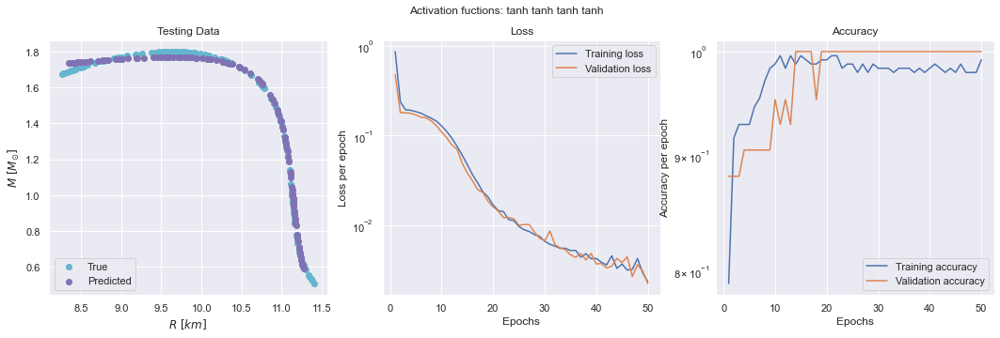

4/4 [==============================] - 0s 1ms/step
The Accuracy of ANN model is: 99.8451337228437


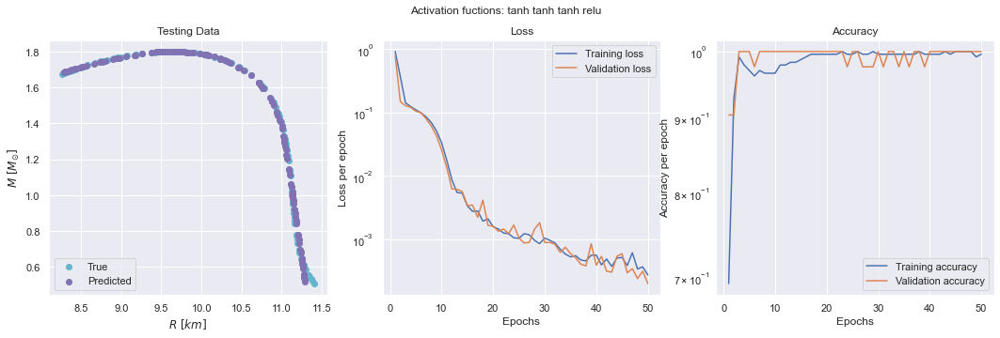

4/4 [==============================] - 0s 1ms/step
The Accuracy of ANN model is: 99.81370942806949


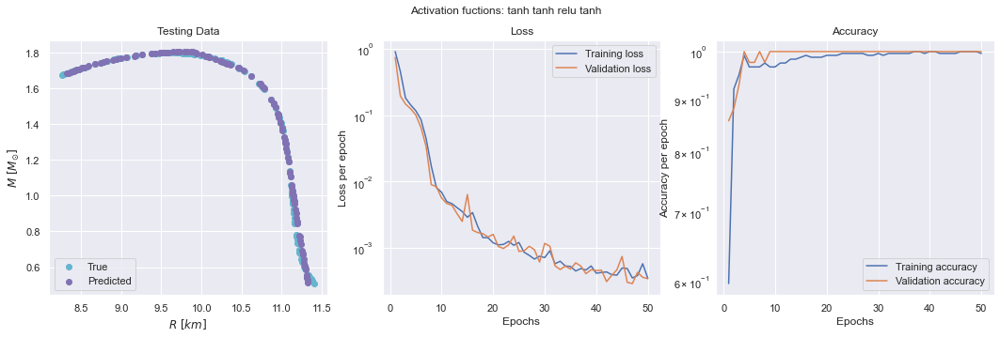

4/4 [==============================] - 0s 667us/step
The Accuracy of ANN model is: 99.9052218664774


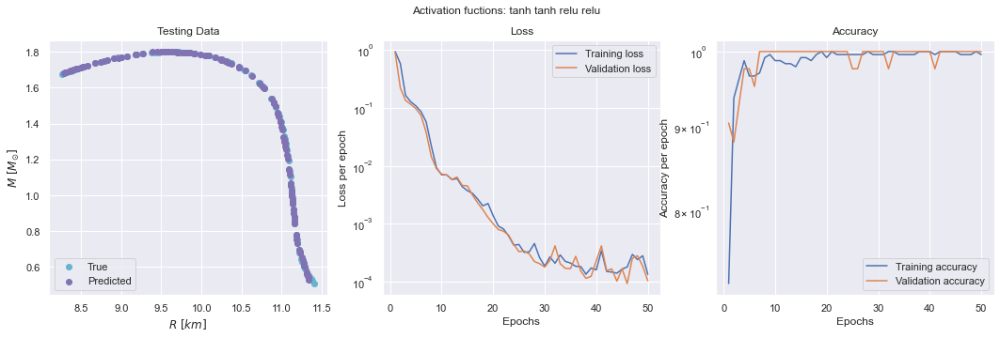

4/4 [==============================] - 0s 1ms/step
The Accuracy of ANN model is: 99.78053681905239


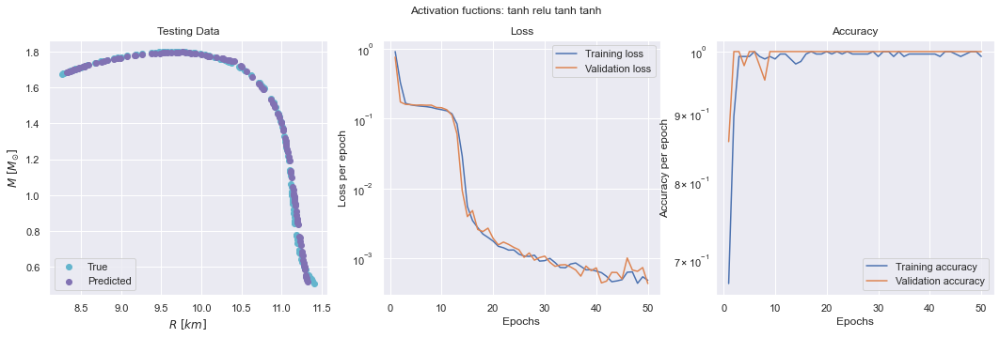

4/4 [==============================] - 0s 1ms/step
The Accuracy of ANN model is: 99.88198494534257


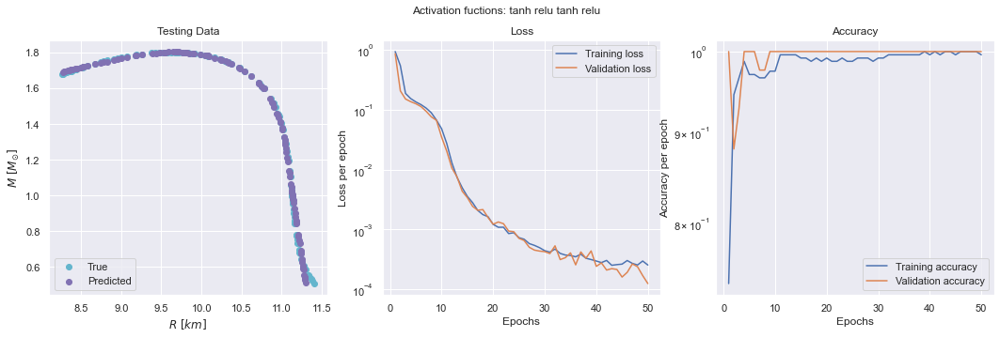

4/4 [==============================] - 0s 1ms/step
The Accuracy of ANN model is: 99.76719583031331


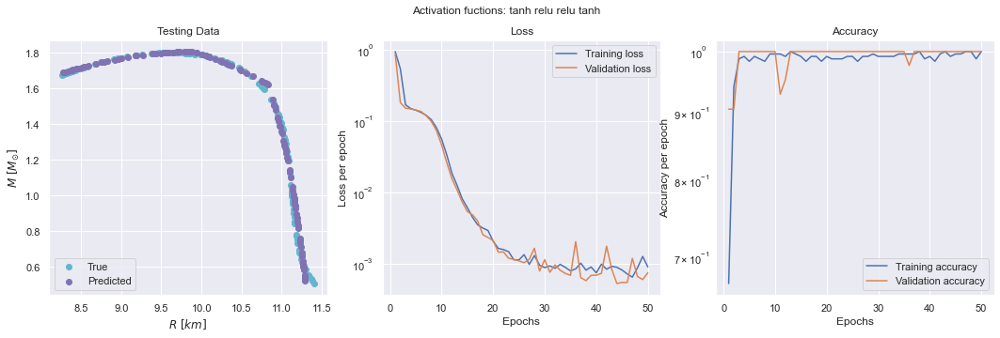

4/4 [==============================] - 0s 1ms/step
The Accuracy of ANN model is: 99.78575002489502


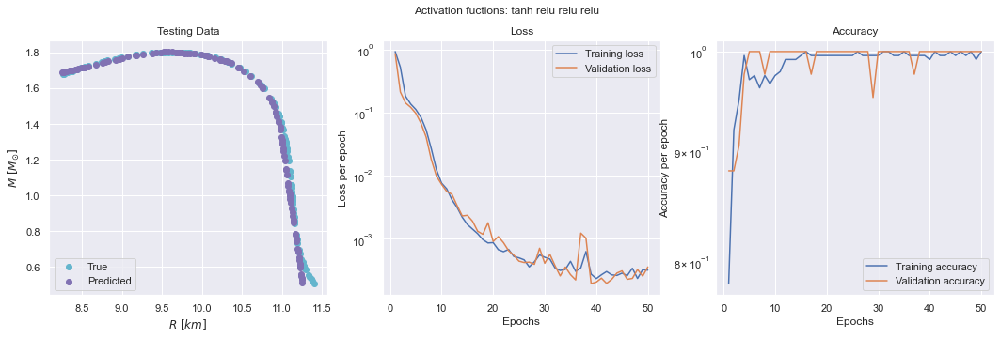

4/4 [==============================] - 0s 667us/step
The Accuracy of ANN model is: 99.6675598189538


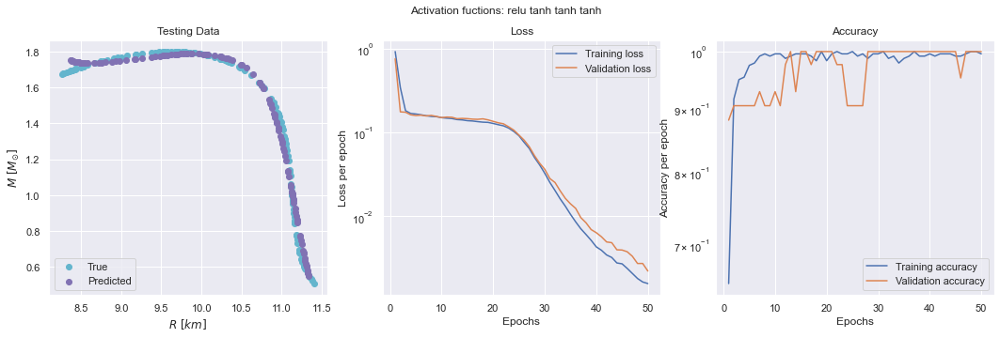

4/4 [==============================] - 0s 1ms/step
The Accuracy of ANN model is: 99.85826151736026


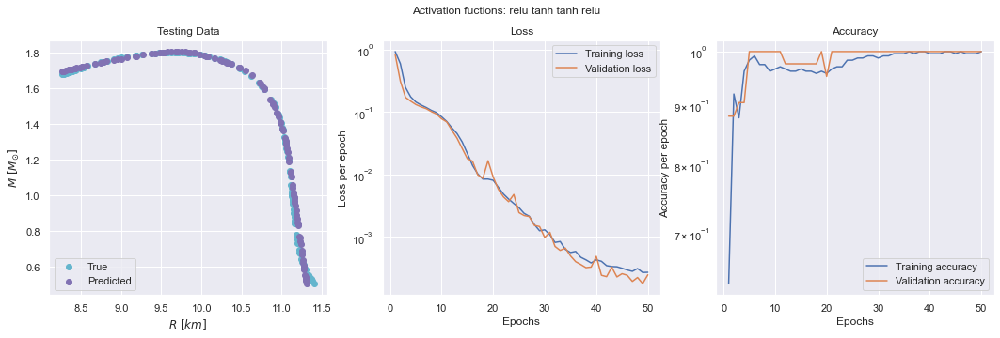

4/4 [==============================] - 0s 1ms/step
The Accuracy of ANN model is: 99.89035876616109


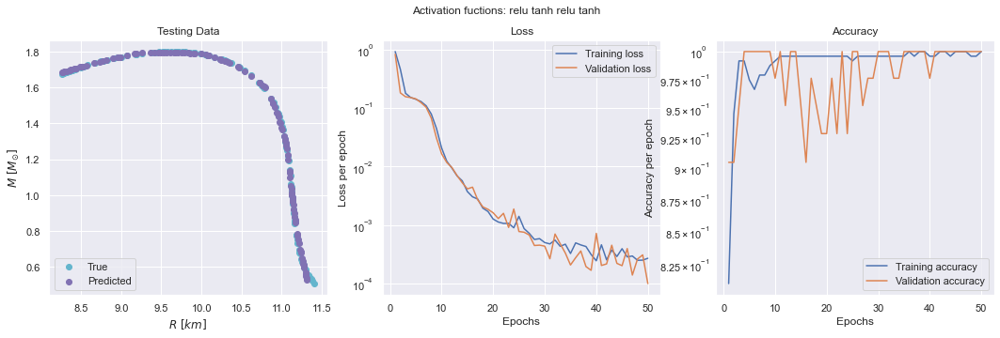

4/4 [==============================] - 0s 667us/step
The Accuracy of ANN model is: 99.82464242825095


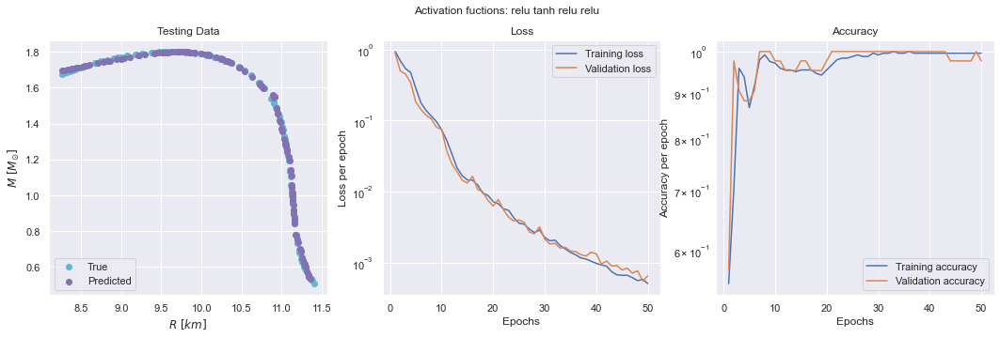

4/4 [==============================] - 0s 1ms/step
The Accuracy of ANN model is: 99.90161020735685


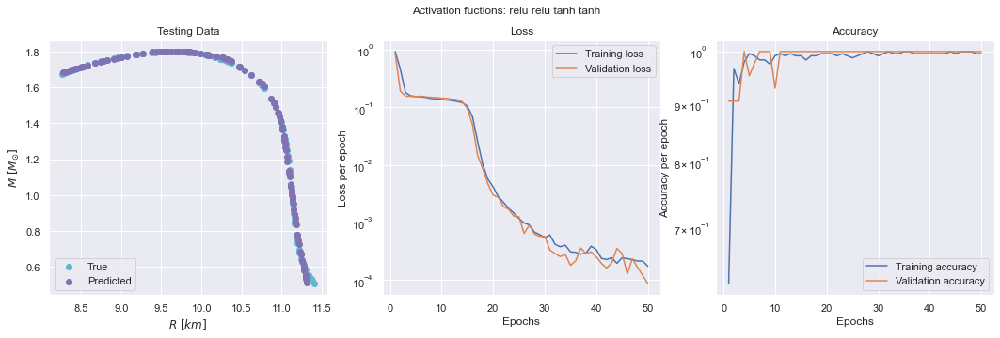

4/4 [==============================] - 0s 667us/step
The Accuracy of ANN model is: 99.868979002429


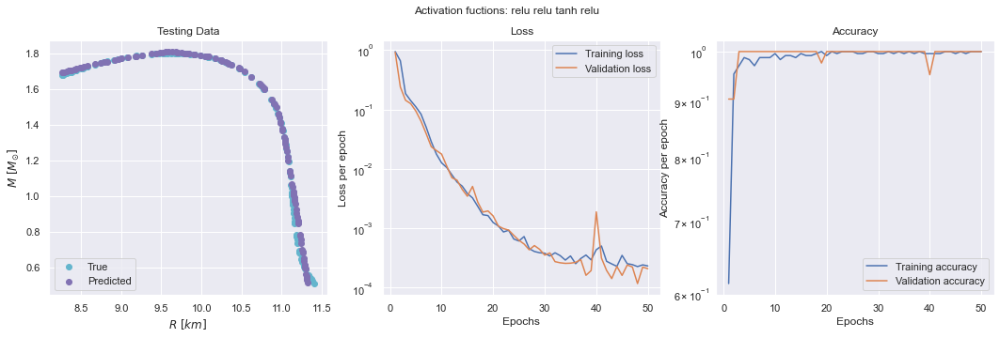

4/4 [==============================] - 0s 1ms/step
The Accuracy of ANN model is: 99.80097509023084


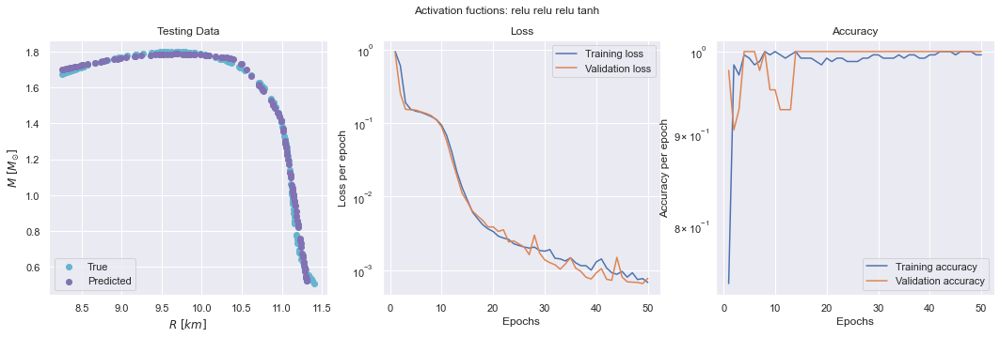

4/4 [==============================] - 0s 667us/step
The Accuracy of ANN model is: 99.75024627870552


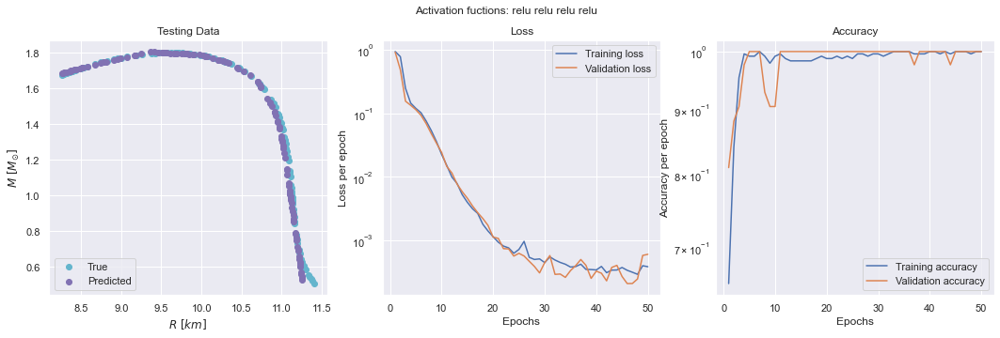

In [ ]:
eps         = 50
activ_list  = ['tanh','relu']
ape_list    = []
accur_list  = []
neu_list    = []
dist_list   = []

for i in activ_list:
    for j in activ_list:
        for k in activ_list:
            for l in activ_list:
                
                model = Sequential()
                
                model.add(Dense(units = 25, input_dim=X_train.shape[1], kernel_initializer='normal', activation=i))

                model.add(Dense(units = 25, kernel_initializer='normal', activation=j))

                model.add(Dense(units = 20, kernel_initializer='normal', activation=k))

                model.add(Dense(units = 25, kernel_initializer='normal', activation=l))

                model.add(Dense(2, kernel_initializer='normal'))

                model.compile(loss='mean_squared_error', optimizer='adam', metrics=['accuracy'])

                trial = model.fit(X_train, y_train ,batch_size = 5, epochs = eps, verbose=0, validation_split = 0.15)

                Predictions=model.predict(X_test)

                Predictions=TargetVarScalerFit.inverse_transform(Predictions)

                y_test_orig=TargetVarScalerFit.inverse_transform(y_test)

                Test_Data=PredictorScalerFit.inverse_transform(X_test)

                TestingData=pd.DataFrame(data=Test_Data, columns=Predictors)

                TestingData['M'] = y_test_orig.T[0]
                TestingData['R'] = y_test_orig.T[1]

                TestingData['M_pred'] = Predictions.T[0]
                TestingData['R_pred'] = Predictions.T[1]

                Testing_norm   = np.sqrt(TestingData.M.values**2 + TestingData.R.values**2)
                Predicted_norm = np.sqrt(TestingData.M_pred.values**2 + TestingData.R_pred.values**2)
                Test_pred_norm = np.sqrt((TestingData.M.values-TestingData.M_pred.values)**2 + (TestingData.R.values-TestingData.R_pred.values)**2)


                APE=100*(Test_pred_norm/Testing_norm)
                TestingData['APE']=APE

                print('The Accuracy of ANN model is:', 100-np.mean(APE))

                import matplotlib.pyplot as plt
                x1 = TestingData.R.values
                y1 = TestingData.M.values

                x2 = TestingData.R_pred.values
                y2 = TestingData.M_pred.values

                fig, ax = plt.subplots(1, 3, figsize=(18,5))
                ax[0].scatter(x1,y1, color = 'c', label = 'True')
                ax[0].scatter(x2,y2, color = 'm', label = 'Predicted')
                ax[0].legend()
                ax[0].set_xlabel('$ R \ [km] $')
                ax[0].set_ylabel('$ M \ [M_{\odot}] $')
                ax[0].set_title("Testing Data")


                val_loss_list = trial.history['val_loss']
                loss_list     = trial.history['loss']
                epos          = np.linspace(1,eps,eps)
                ax[1].semilogy(epos, loss_list    , label = 'Training loss')
                ax[1].semilogy(epos, val_loss_list, label = 'Validation loss')
                ax[1].set_xlabel('Epochs')
                ax[1].set_ylabel('Loss per epoch')
                ax[1].legend()
                ax[1].set_title("Loss")

                val_acc_list = trial.history['val_accuracy']
                acc_list     = trial.history['accuracy']
                epos         = np.linspace(1,eps,eps)
                ax[2].semilogy(epos, acc_list    , label = 'Training accuracy')
                ax[2].semilogy(epos, val_acc_list, label = 'Validation accuracy')
                ax[2].set_xlabel('Epochs')
                ax[2].set_ylabel('Accuracy per epoch')
                ax[2].legend()
                ax[2].set_title("Accuracy")

                distance = np.array(acc_list)-np.array(val_acc_list)
                distance = np.mean(distance[-10:])
                
                neu_list.append(str(i)+" "+str(j)+" "+str(k)+" "+str(l))
                ape_list.append(100-np.mean(APE))
                dist_list.append(distance)
                accur_list.append(np.mean(acc_list))
                
                fig.suptitle('Activation fuctions: '+str(i)+" "+str(j)+" "+str(k)+" "+str(l))
                plt.show()

In [ ]:
df = pd.DataFrame({})
df['act_func']    = neu_list
df['ape']        = ape_list
df['mean_acc']   = accur_list
df['final_dist'] = dist_list
# df.to_pickle(r'C:\Users\admin\Desktop\Γιάννης\Πτυχιακή\files\act_func_to_choose.pkl')

APE filter: ['tanh tanh relu relu' 'relu relu tanh tanh']
Accuracy filter: []


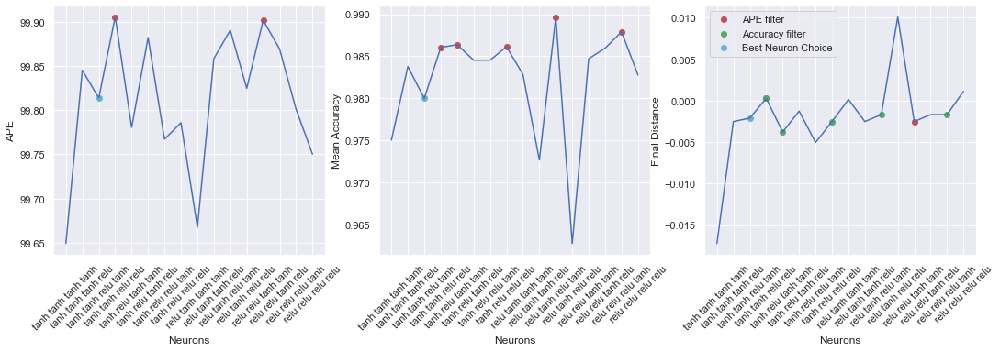

In [ ]:
# df = pd.read_pickle(r'C:\Users\admin\Desktop\Γιάννης\Πτυχιακή\files\act_func_to_choose.pkl')


x  = df.act_func.values
y1 = df.ape.values
y2 = df.mean_acc.values
y3 = df.final_dist.values

import matplotlib.pyplot as plt

fig, ax = plt.subplots(1, 3, figsize=(18,5))
ax[0].plot(x,y1)
ax[0].set_ylabel('APE')
ax[0].scatter(x[y1 > 99.9], y1[y1 > 99.9], color = 'r')
ax[0].scatter(x[x == 'tanh tanh relu tanh'], y1[x == 'tanh tanh relu tanh'], color = 'c', label = 'Best Neuron Choice')


ax[1].plot(x,y2)
ax[1].set_ylabel('Mean Accuracy')
ax[1].scatter(x[y2 > 0.986], y2[y2 > 0.986], color = 'r')
ax[1].scatter(x[x == 'tanh tanh relu tanh'], y2[x == 'tanh tanh relu tanh'], color = 'c', label = 'Best Neuron Choice')

ax[2].plot(x,y3)
ax[2].set_ylabel('Final Distance')
ax[2].scatter(x[y1 > 99.9], y3[y1 > 99.9]  , color = 'r', label = 'APE filter')
ax[2].scatter(x[y2 > 0.986], y3[y2 > 0.986], color = 'g', label = 'Accuracy filter')
ax[2].scatter(x[x == 'tanh tanh relu tanh'], y3[x == 'tanh tanh relu tanh'], color = 'c', label = 'Best Neuron Choice')
ax[2].legend()


ax[0].set_xlabel('Neurons')
ax[1].set_xlabel('Neurons')
ax[2].set_xlabel('Neurons')
ax[0].xaxis.set_major_locator(plt.MaxNLocator(20))
ax[0].tick_params(axis='x', labelrotation=45)
ax[1].xaxis.set_major_locator(plt.MaxNLocator(20))
ax[1].tick_params(axis='x', labelrotation=45)
ax[2].xaxis.set_major_locator(plt.MaxNLocator(20))
ax[2].tick_params(axis='x', labelrotation=45)

print('APE filter:', x[y1 > 99.9])
print('Accuracy filter:', x[y2 > 0.99])

## 5 layers - best model so far

4/4 [==============================] - 0s 667us/step
The Accuracy of ANN model is: 99.56107850041026


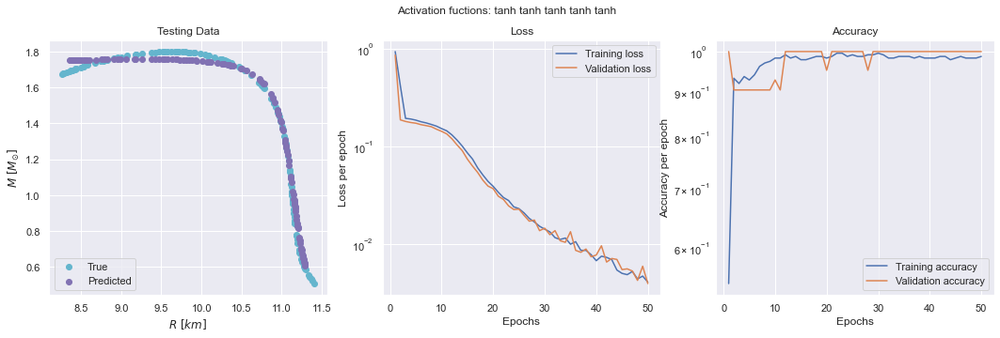

4/4 [==============================] - 0s 667us/step
The Accuracy of ANN model is: 99.66098453458082


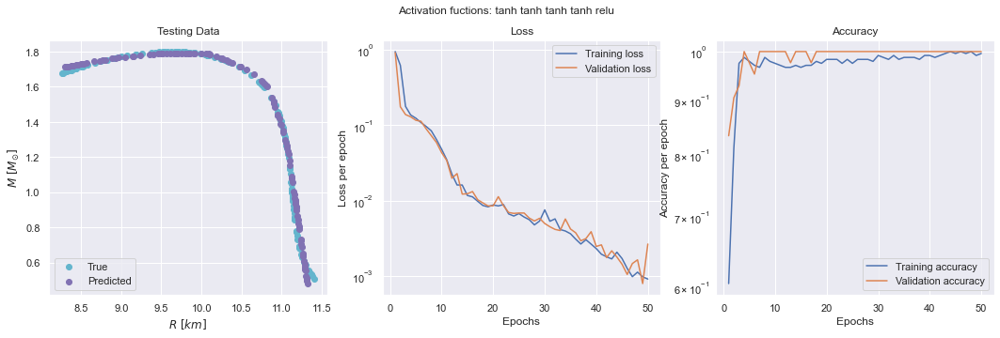

4/4 [==============================] - 0s 667us/step
The Accuracy of ANN model is: 99.79940299537624


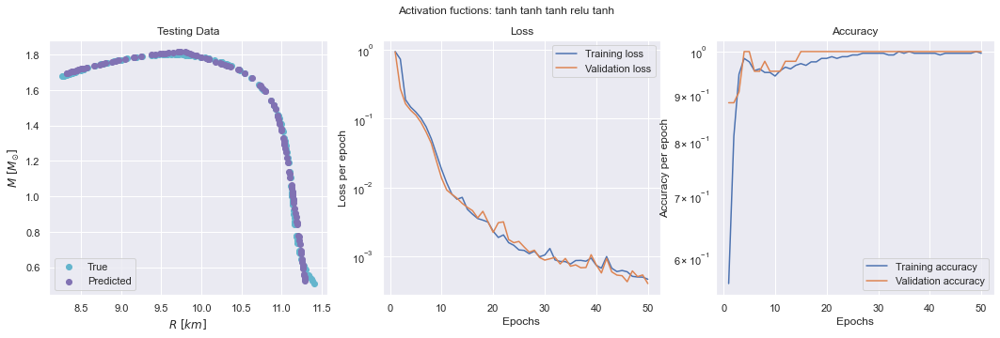

4/4 [==============================] - 0s 1ms/step
The Accuracy of ANN model is: 99.76289311173095


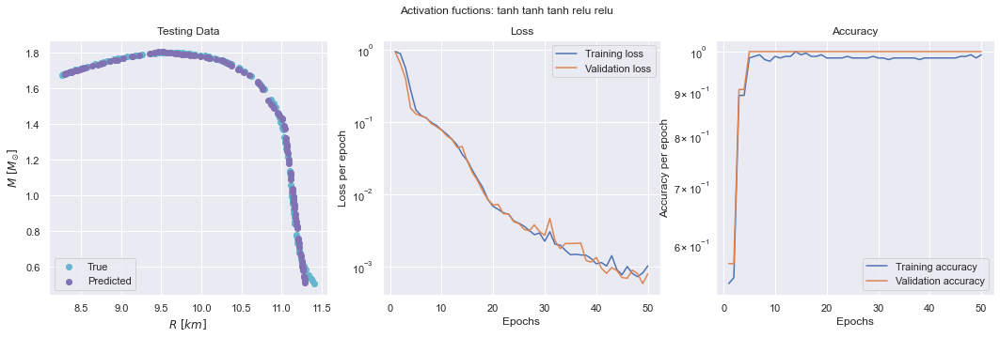

4/4 [==============================] - 0s 1000us/step
The Accuracy of ANN model is: 99.83081923552128


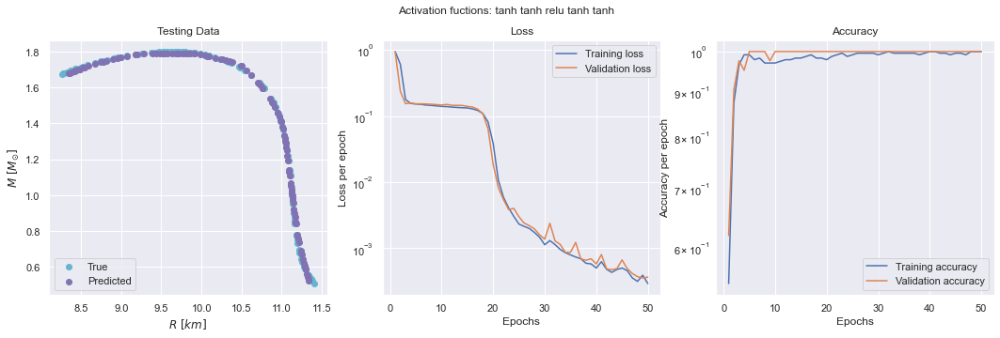

4/4 [==============================] - 0s 667us/step
The Accuracy of ANN model is: 99.80681653059483


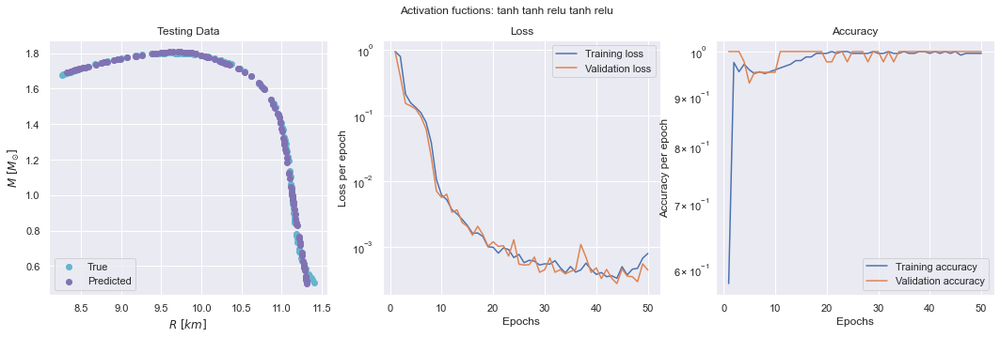

4/4 [==============================] - 0s 1ms/step
The Accuracy of ANN model is: 99.82289093900722


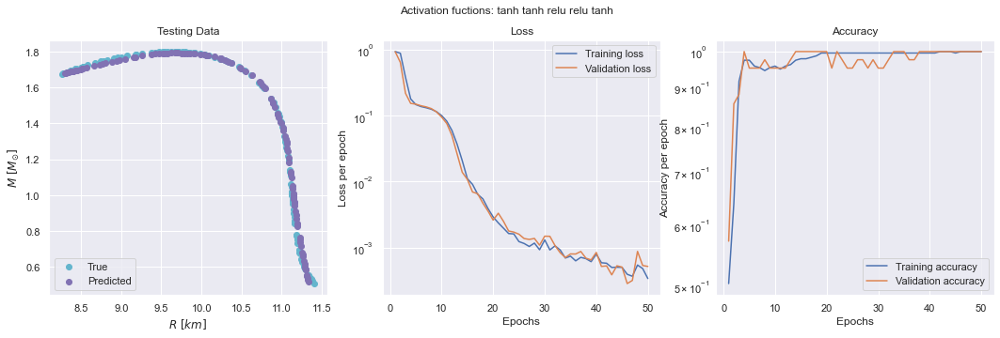

4/4 [==============================] - 0s 1ms/step
The Accuracy of ANN model is: 99.79556191696463


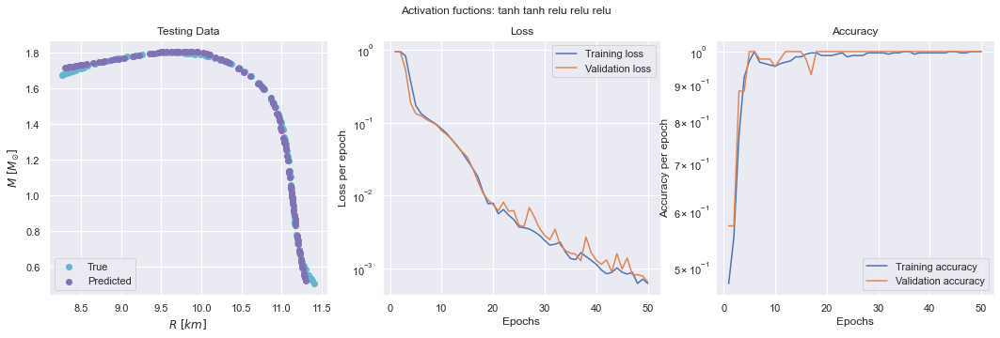

4/4 [==============================] - 0s 1ms/step
The Accuracy of ANN model is: 99.76114701020668


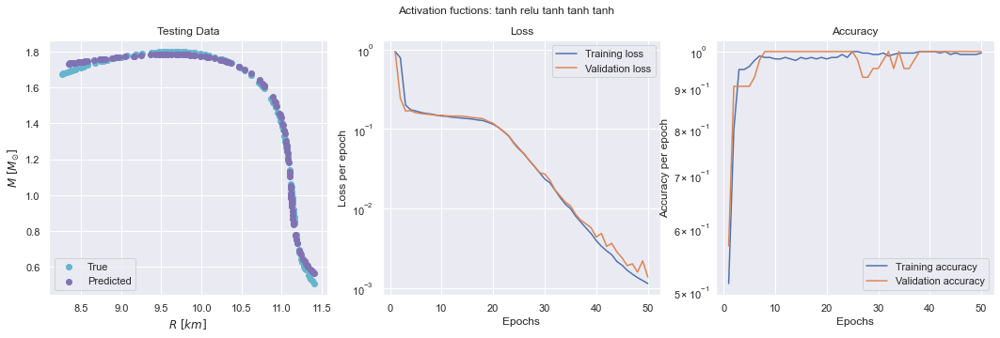

4/4 [==============================] - 0s 1ms/step
The Accuracy of ANN model is: 99.75938150696307


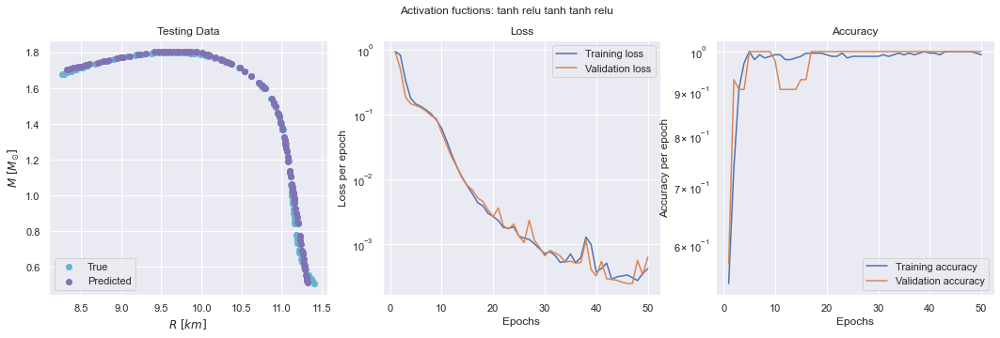

4/4 [==============================] - 0s 1ms/step
The Accuracy of ANN model is: 99.84832744041069


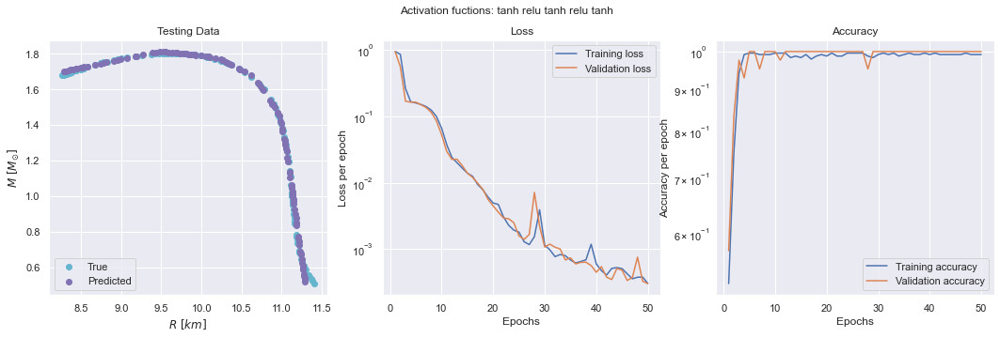

4/4 [==============================] - 0s 1ms/step
The Accuracy of ANN model is: 99.85909266073253


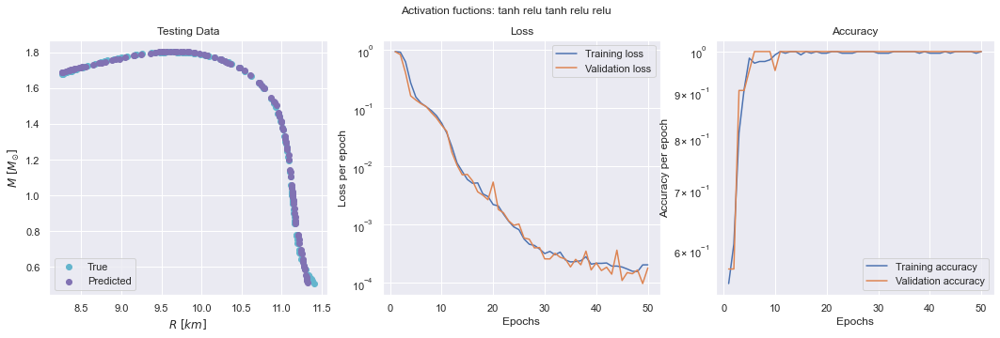

4/4 [==============================] - 0s 1ms/step
The Accuracy of ANN model is: 99.77475301391391


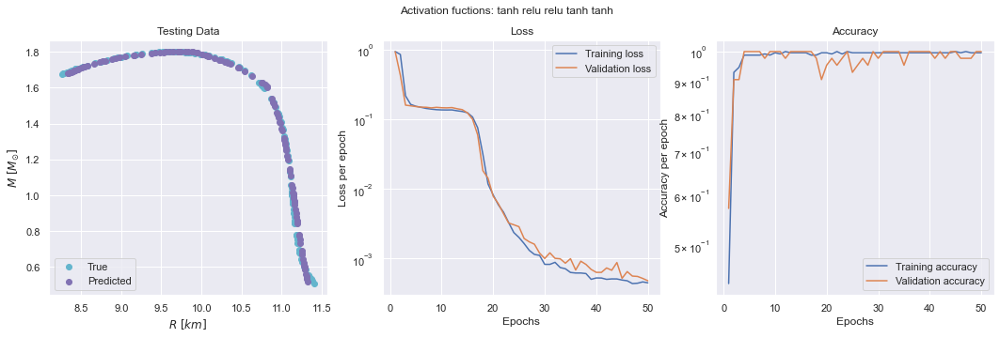

4/4 [==============================] - 0s 1ms/step
The Accuracy of ANN model is: 99.83160635791194


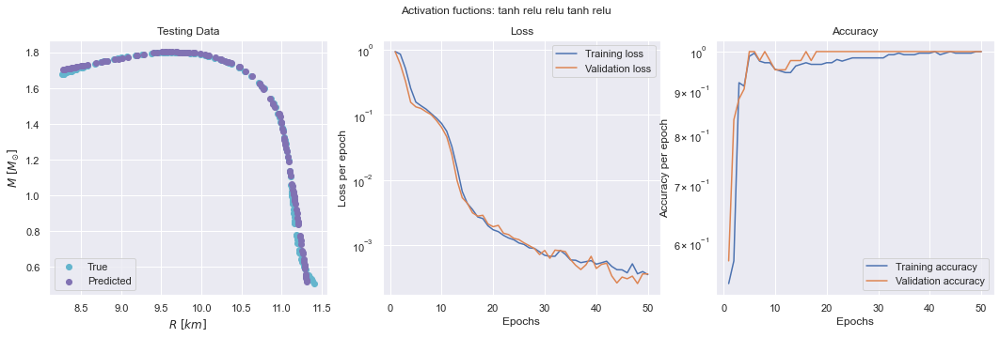

4/4 [==============================] - 0s 667us/step
The Accuracy of ANN model is: 99.84977270221677


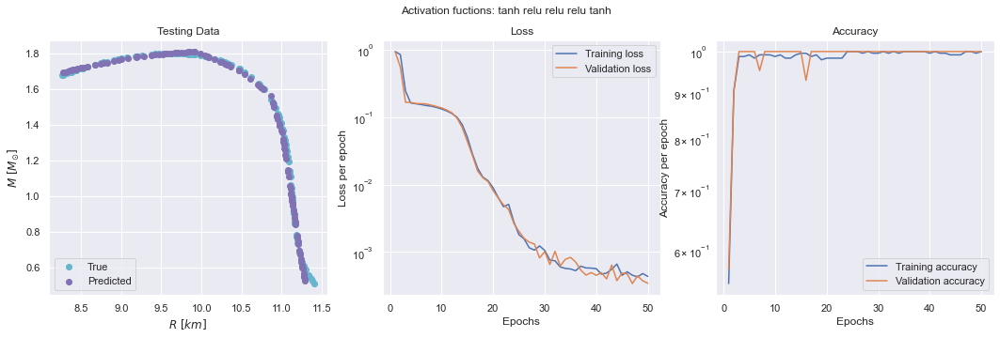

4/4 [==============================] - 0s 1ms/step
The Accuracy of ANN model is: 99.73178194473552


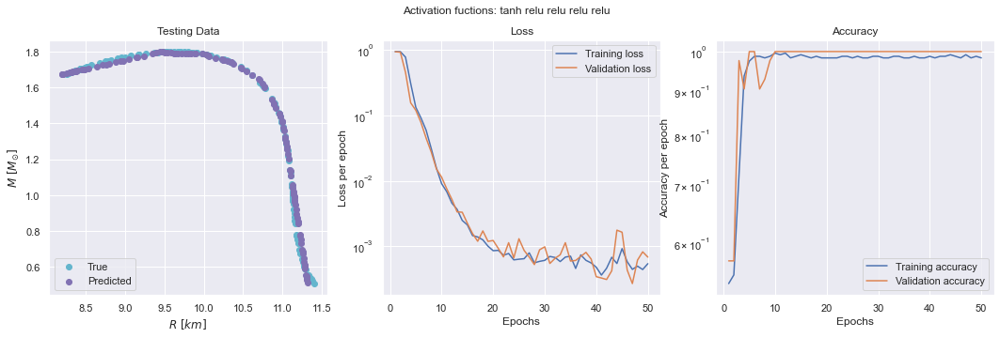

4/4 [==============================] - 0s 1ms/step
The Accuracy of ANN model is: 99.67101821881926


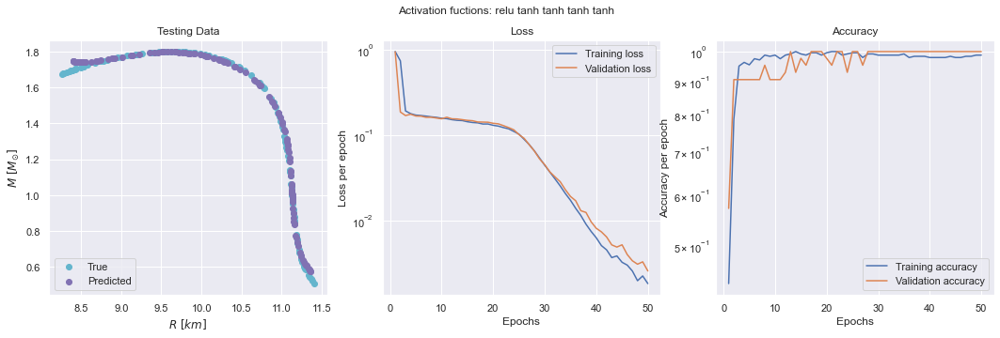

4/4 [==============================] - 0s 1ms/step
The Accuracy of ANN model is: 99.84182766853053


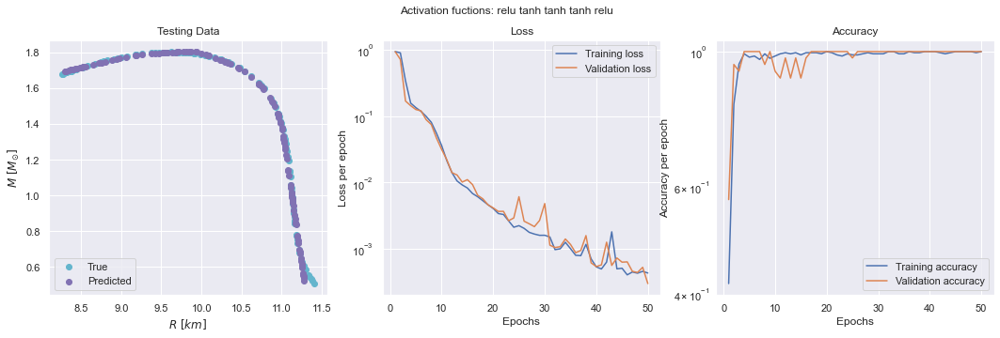

4/4 [==============================] - 0s 1ms/step
The Accuracy of ANN model is: 99.84637280213842


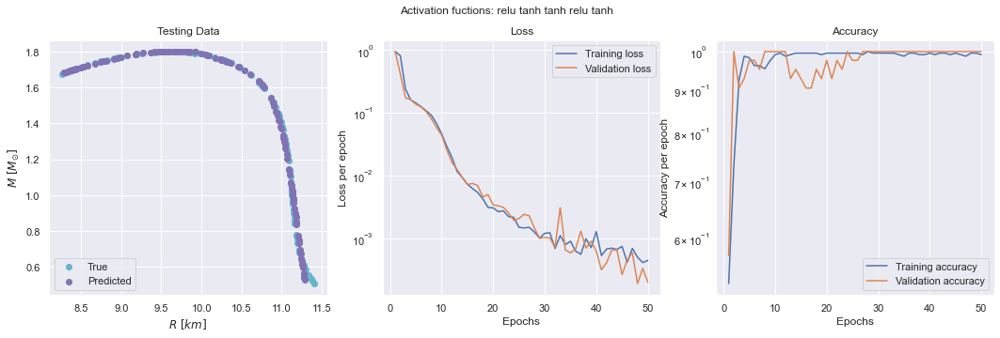

4/4 [==============================] - 0s 1ms/step
The Accuracy of ANN model is: 99.75840526951798


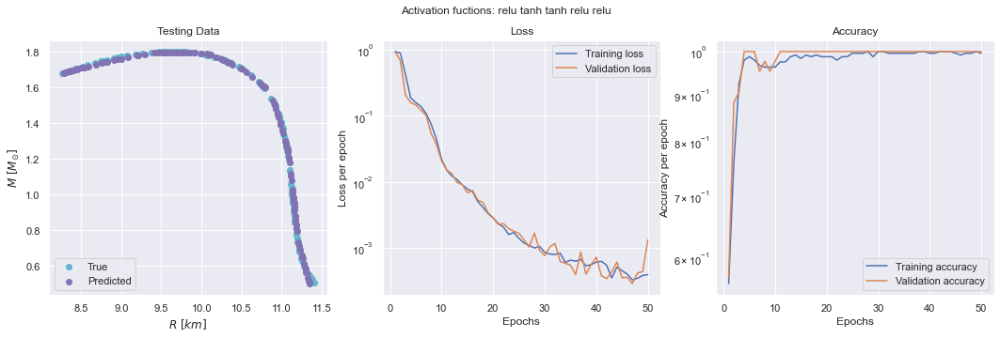

4/4 [==============================] - 0s 1ms/step
The Accuracy of ANN model is: 99.80036041150707


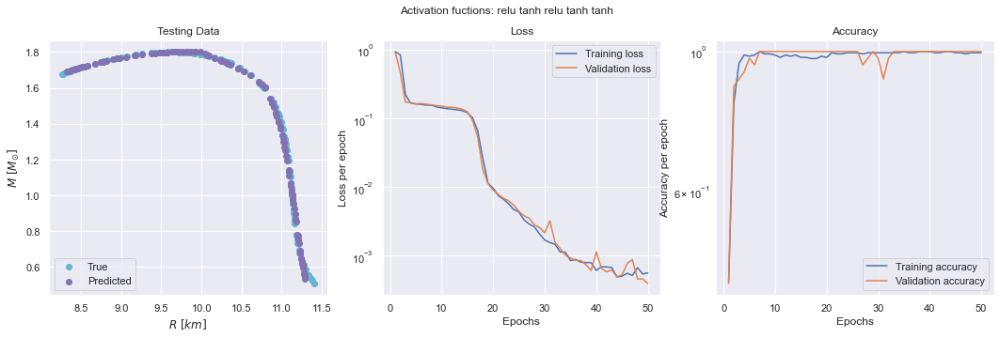

4/4 [==============================] - 0s 1ms/step
The Accuracy of ANN model is: 99.87342406254821


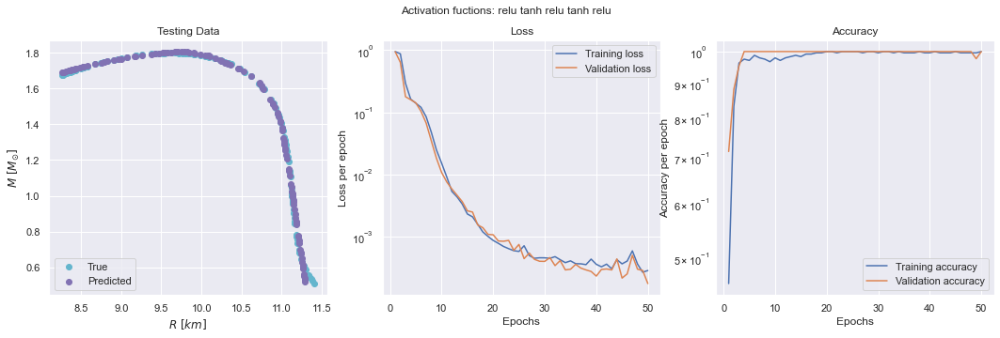

4/4 [==============================] - 0s 1ms/step
The Accuracy of ANN model is: 99.69453454833389


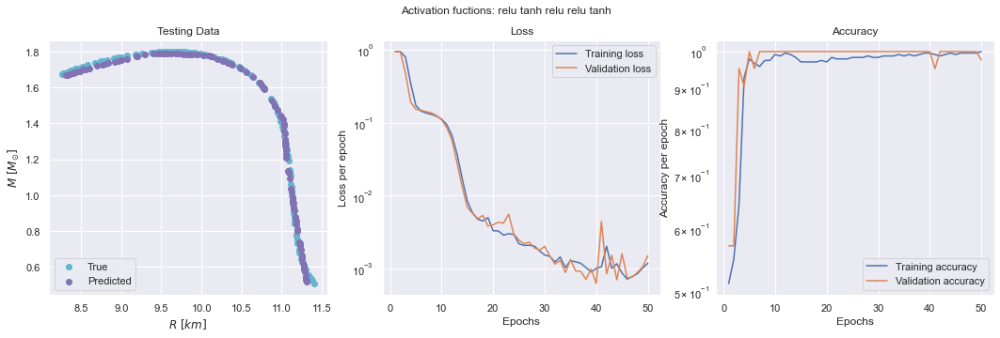

4/4 [==============================] - 0s 1ms/step
The Accuracy of ANN model is: 99.6201253824165


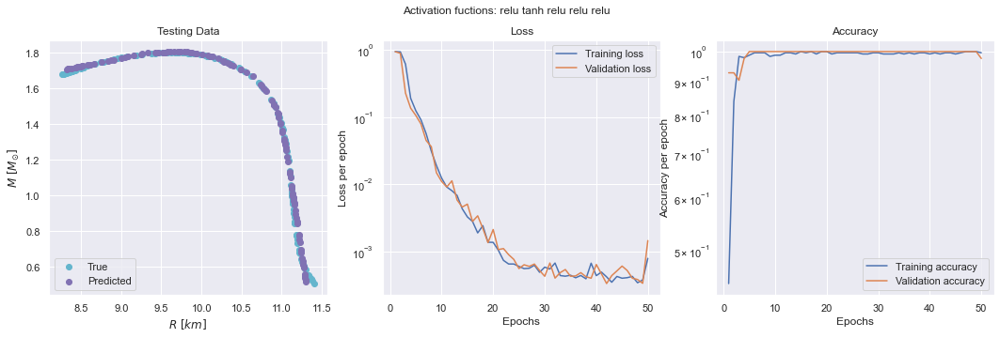

4/4 [==============================] - 0s 1ms/step
The Accuracy of ANN model is: 99.65509733231968


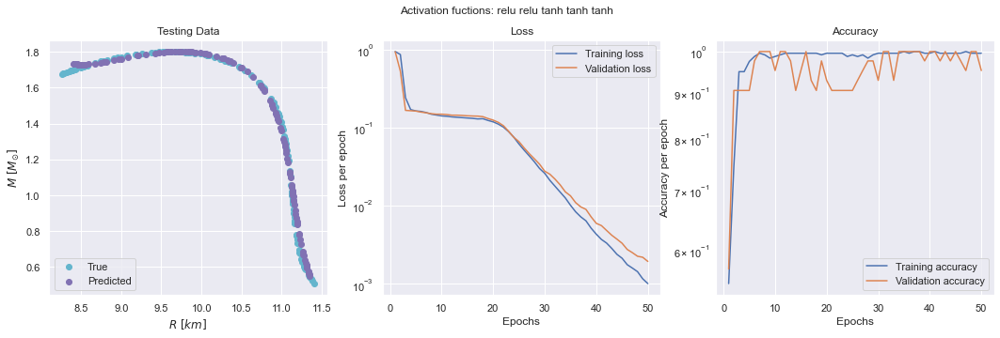

4/4 [==============================] - 0s 1ms/step
The Accuracy of ANN model is: 99.78040580133549


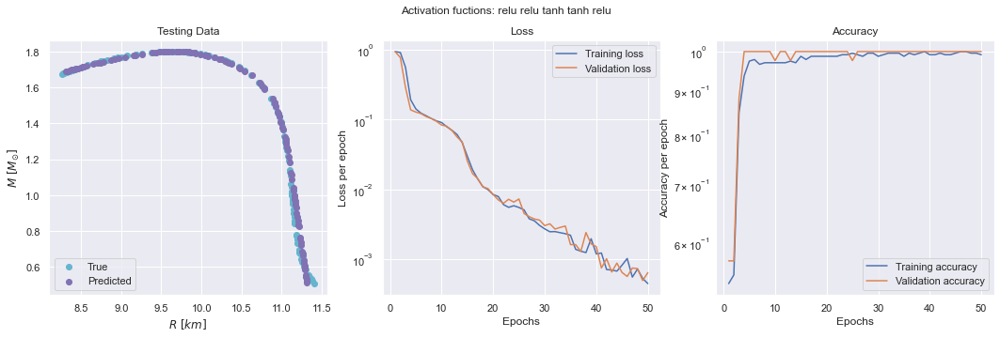

4/4 [==============================] - 0s 1ms/step
The Accuracy of ANN model is: 99.77937021022132


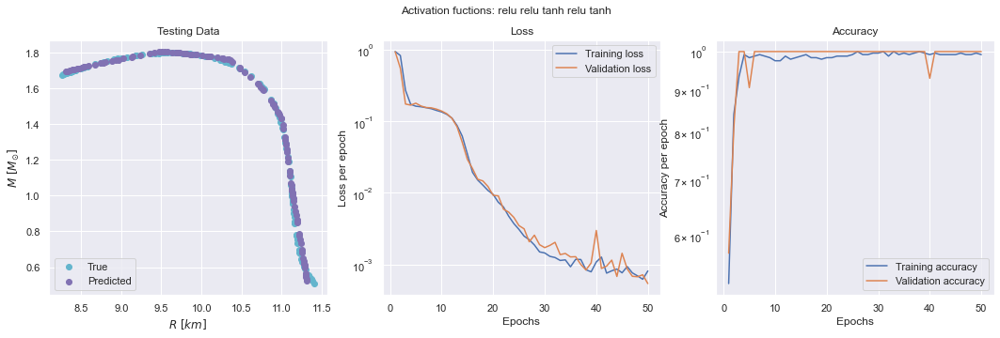

4/4 [==============================] - 0s 667us/step
The Accuracy of ANN model is: 99.82112928559357


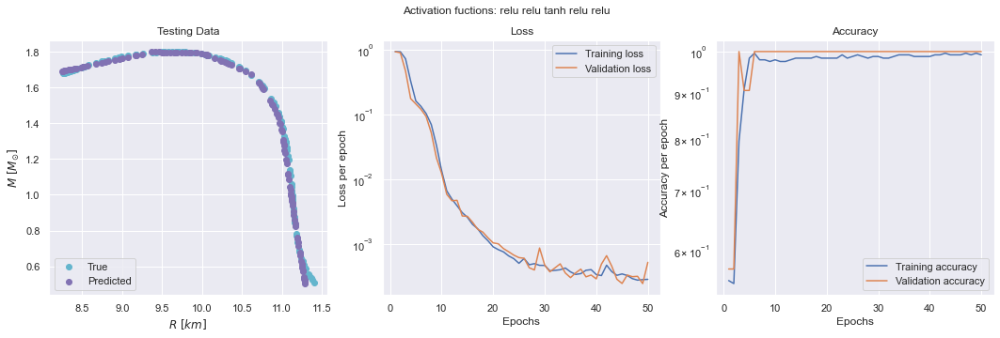

4/4 [==============================] - 0s 1ms/step
The Accuracy of ANN model is: 99.72005096219793


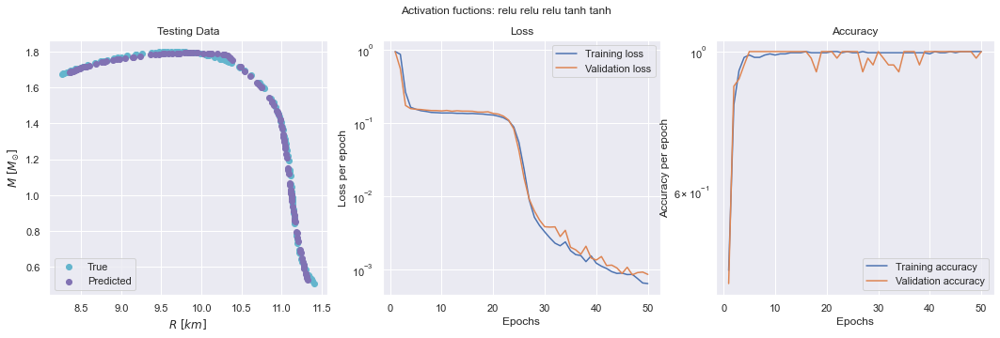

4/4 [==============================] - 0s 667us/step
The Accuracy of ANN model is: 99.84303719754573


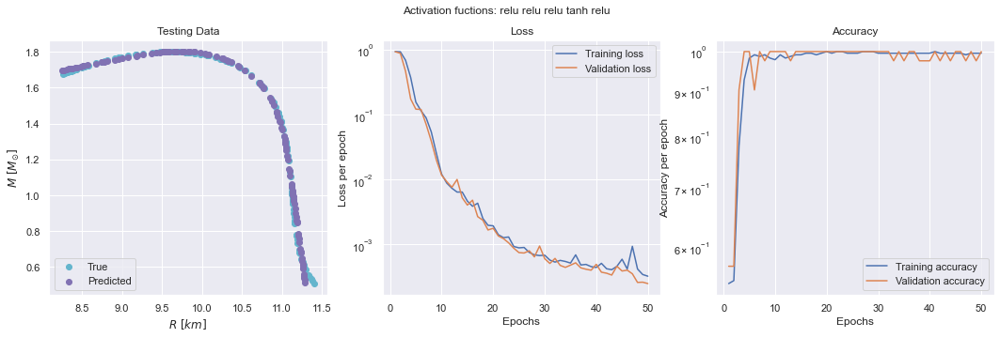

4/4 [==============================] - 0s 667us/step
The Accuracy of ANN model is: 99.6064980278476


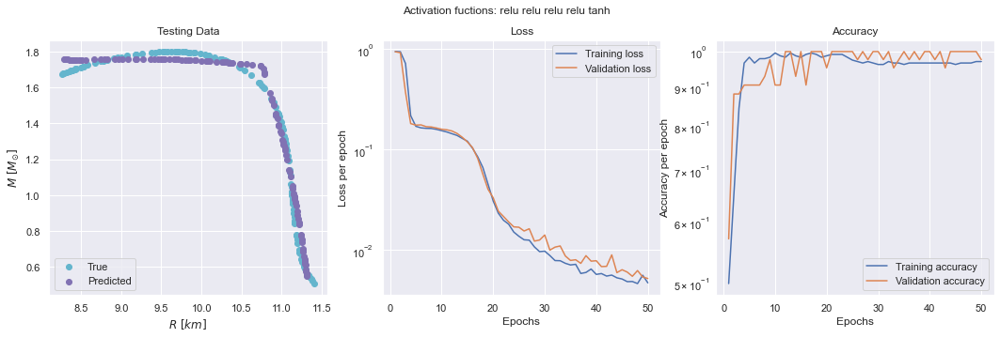

4/4 [==============================] - 0s 1000us/step
The Accuracy of ANN model is: 90.1130863156025


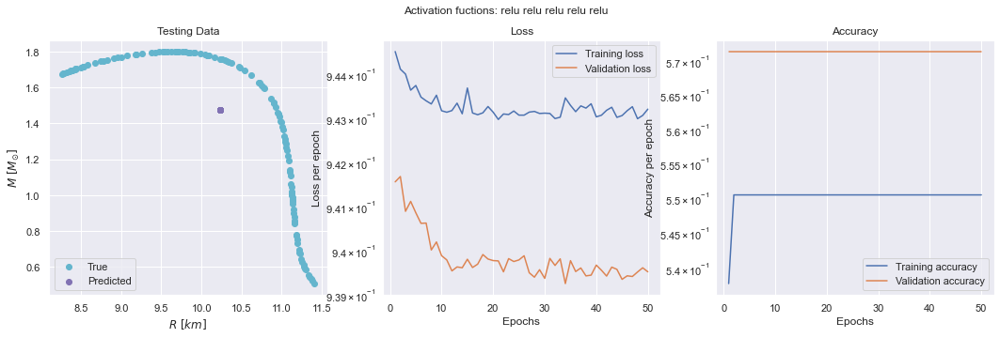

In [ ]:
eps         = 50
activ_list  = ['tanh','relu']
ape_list    = []
accur_list  = []
neu_list    = []
dist_list   = []

for i in activ_list:
    for j in activ_list:
        for k in activ_list:
            for l in activ_list:
                for m in activ_list:
                
                    model = Sequential()

                    model.add(Dense(units=5, input_dim=1, kernel_initializer='normal', activation=i))

                    model.add(Dense(units=20, kernel_initializer='normal', activation=j))

                    model.add(Dense(units=25, kernel_initializer='normal', activation=k))

                    model.add(Dense(units=15, kernel_initializer='normal', activation=l))

                    model.add(Dense(units=20, kernel_initializer='normal', activation=m))


                    model.add(Dense(2, kernel_initializer='normal'))

                    model.compile(loss='mean_squared_error', optimizer='adam', metrics=['accuracy'])

                    trial = model.fit(X_train, y_train ,batch_size = 5, epochs = eps, verbose=0, validation_split = 0.15)

                    Predictions=model.predict(X_test)

                    Predictions=TargetVarScalerFit.inverse_transform(Predictions)

                    y_test_orig=TargetVarScalerFit.inverse_transform(y_test)

                    Test_Data=PredictorScalerFit.inverse_transform(X_test)

                    TestingData=pd.DataFrame(data=Test_Data, columns=Predictors)

                    TestingData['M'] = y_test_orig.T[0]
                    TestingData['R'] = y_test_orig.T[1]

                    TestingData['M_pred'] = Predictions.T[0]
                    TestingData['R_pred'] = Predictions.T[1]

                    Testing_norm   = np.sqrt(TestingData.M.values**2 + TestingData.R.values**2)
                    Predicted_norm = np.sqrt(TestingData.M_pred.values**2 + TestingData.R_pred.values**2)
                    Test_pred_norm = np.sqrt((TestingData.M.values-TestingData.M_pred.values)**2 + (TestingData.R.values-TestingData.R_pred.values)**2)


                    APE=100*(Test_pred_norm/Testing_norm)
                    TestingData['APE']=APE

                    print('The Accuracy of ANN model is:', 100-np.mean(APE))

                    import matplotlib.pyplot as plt
                    x1 = TestingData.R.values
                    y1 = TestingData.M.values

                    x2 = TestingData.R_pred.values
                    y2 = TestingData.M_pred.values

                    fig, ax = plt.subplots(1, 3, figsize=(18,5))
                    ax[0].scatter(x1,y1, color = 'c', label = 'True')
                    ax[0].scatter(x2,y2, color = 'm', label = 'Predicted')
                    ax[0].legend()
                    ax[0].set_xlabel('$ R \ [km] $')
                    ax[0].set_ylabel('$ M \ [M_{\odot}] $')
                    ax[0].set_title("Testing Data")


                    val_loss_list = trial.history['val_loss']
                    loss_list     = trial.history['loss']
                    epos          = np.linspace(1,eps,eps)
                    ax[1].semilogy(epos, loss_list    , label = 'Training loss')
                    ax[1].semilogy(epos, val_loss_list, label = 'Validation loss')
                    ax[1].set_xlabel('Epochs')
                    ax[1].set_ylabel('Loss per epoch')
                    ax[1].legend()
                    ax[1].set_title("Loss")

                    val_acc_list = trial.history['val_accuracy']
                    acc_list     = trial.history['accuracy']
                    epos         = np.linspace(1,eps,eps)
                    ax[2].semilogy(epos, acc_list    , label = 'Training accuracy')
                    ax[2].semilogy(epos, val_acc_list, label = 'Validation accuracy')
                    ax[2].set_xlabel('Epochs')
                    ax[2].set_ylabel('Accuracy per epoch')
                    ax[2].legend()
                    ax[2].set_title("Accuracy")

                    distance = np.array(acc_list)-np.array(val_acc_list)
                    distance = np.mean(distance[-10:])

                    neu_list.append(str(i)+" "+str(j)+" "+str(k)+" "+str(l)+" "+str(m))
                    ape_list.append(100-np.mean(APE))
                    dist_list.append(distance)
                    accur_list.append(np.mean(acc_list))

                    fig.suptitle('Activation fuctions: '+str(i)+" "+str(j)+" "+str(k)+" "+str(l)+" "+str(m))
                    plt.show()



2/2 [==============================] - 0s 1ms/step
The Accuracy of ANN model is: 99.76733591993333


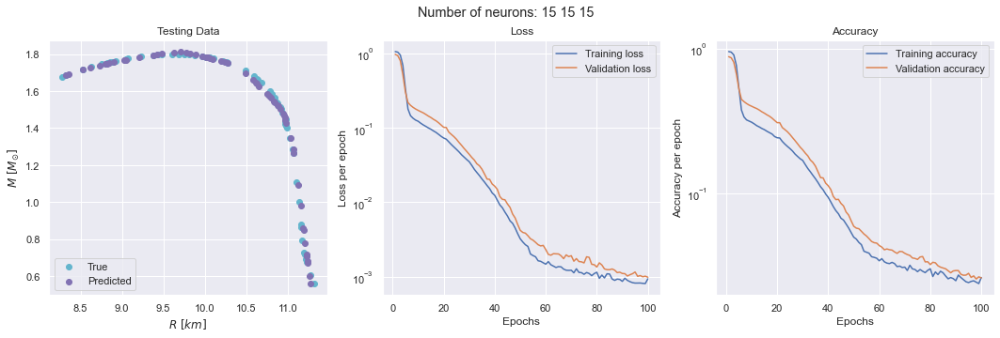

In [ ]:
eps = 100
neuron_list = [15]


for i in neuron_list:
    for j in neuron_list:
        for k in neuron_list:

            model = Sequential()
            
            model.add(Dense(units = i, input_dim=X_train.shape[1], kernel_initializer='normal', activation='tanh'))

            model.add(Dense(units = j, kernel_initializer='normal', activation='tanh'))

            model.add(Dense(units = k, kernel_initializer='normal', activation='relu'))

            #             model.add(Dense(units=15, kernel_initializer='normal', activation='tanh'))

            #             model.add(Dense(units=20, kernel_initializer='normal', activation='relu'))

            model.add(Dense(2, kernel_initializer='normal'))

            model.compile(loss='mean_squared_error', optimizer='adam', metrics=[rmse])


            trial = model.fit(X_train, y_train ,batch_size = 5, epochs = eps, verbose=0, validation_split = 0.15)

            Predictions=model.predict(X_test)

            Predictions=TargetVarScalerFit.inverse_transform(Predictions)

            y_test_orig=TargetVarScalerFit.inverse_transform(y_test)

            Test_Data=PredictorScalerFit.inverse_transform(X_test)

            TestingData=pd.DataFrame(data=Test_Data, columns=Predictors)

            TestingData['M'] = y_test_orig.T[0]
            TestingData['R'] = y_test_orig.T[1]

            TestingData['M_pred'] = Predictions.T[0]
            TestingData['R_pred'] = Predictions.T[1]

            Testing_norm   = np.sqrt(TestingData.M.values**2 + TestingData.R.values**2)
            Predicted_norm = np.sqrt(TestingData.M_pred.values**2 + TestingData.R_pred.values**2)
            Test_pred_norm = np.sqrt((TestingData.M.values-TestingData.M_pred.values)**2 + (TestingData.R.values-TestingData.R_pred.values)**2)


            APE=100*(Test_pred_norm/Testing_norm)
            TestingData['APE']=APE

            print('The Accuracy of ANN model is:', 100-np.mean(APE))

            import matplotlib.pyplot as plt
            x1 = TestingData.R.values
            y1 = TestingData.M.values

            x2 = TestingData.R_pred.values
            y2 = TestingData.M_pred.values

            fig, ax = plt.subplots(1, 3, figsize=(18,5))
            ax[0].scatter(x1,y1, color = 'c', label = 'True')
            ax[0].scatter(x2,y2, color = 'm', label = 'Predicted')
            ax[0].legend()
            ax[0].set_xlabel('$ R \ [km] $')
            ax[0].set_ylabel('$ M \ [M_{\odot}] $')
            ax[0].set_title("Testing Data")


            val_loss_list = trial.history['val_loss']
            loss_list     = trial.history['loss']
            epos          = np.linspace(1,eps,eps)
            ax[1].semilogy(epos, loss_list    , label = 'Training loss')
            ax[1].semilogy(epos, val_loss_list, label = 'Validation loss')
            ax[1].set_xlabel('Epochs')
            ax[1].set_ylabel('Loss per epoch')
            ax[1].legend()
            ax[1].set_title("Loss")
            
            val_acc_list = trial.history['val_rmse']
            acc_list     = trial.history['rmse']
            epos         = np.linspace(1,eps,eps)
            ax[2].semilogy(epos, acc_list    , label = 'Training accuracy')
            ax[2].semilogy(epos, val_acc_list, label = 'Validation accuracy')
            ax[2].set_xlabel('Epochs')
            ax[2].set_ylabel('Accuracy per epoch')
            ax[2].legend()
            ax[2].set_title("Accuracy")
            
            
            fig.suptitle('Number of neurons: '+str(i)+" "+str(j)+" "+str(k))
            plt.show()

## Best Activation functions choice for 4 layers

4/4 [==============================] - 0s 667us/step
The Accuracy of ANN model is: 99.89907053229783


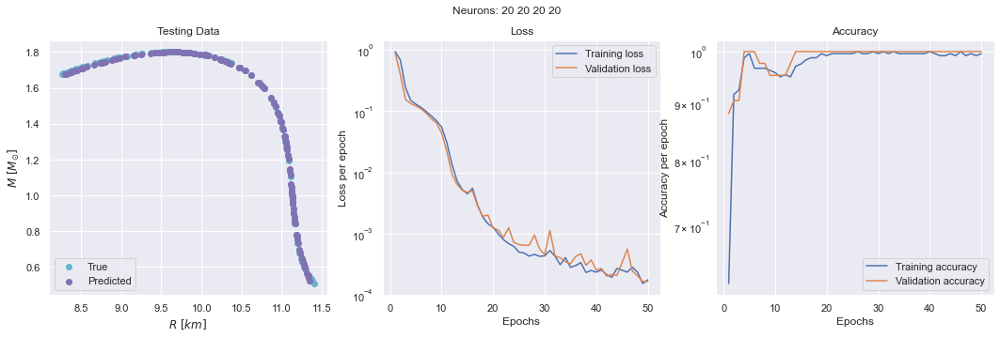

4/4 [==============================] - 0s 667us/step
The Accuracy of ANN model is: 99.88276364285785


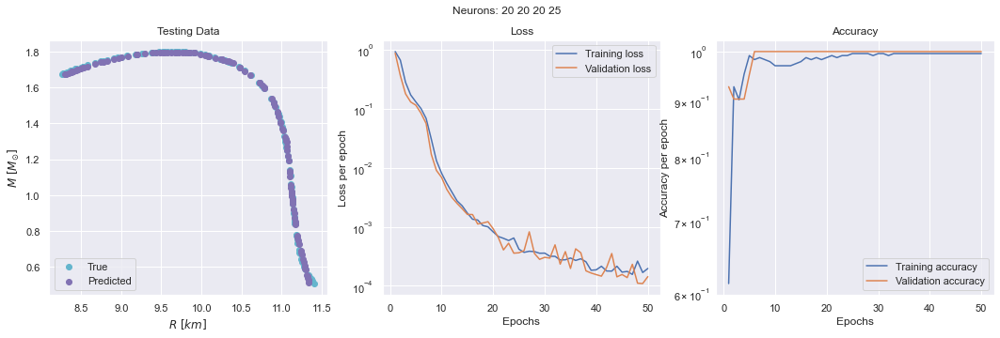

4/4 [==============================] - 0s 667us/step
The Accuracy of ANN model is: 99.81365542431425


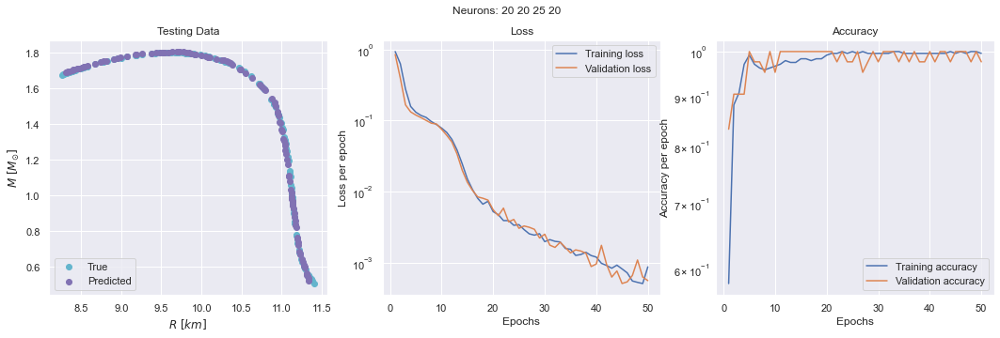

4/4 [==============================] - 0s 1ms/step
The Accuracy of ANN model is: 99.89990799816063


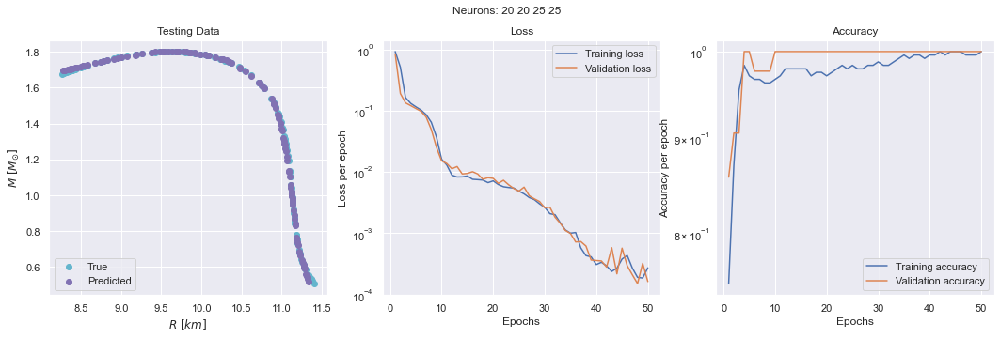

4/4 [==============================] - 0s 667us/step
The Accuracy of ANN model is: 99.84520937151136


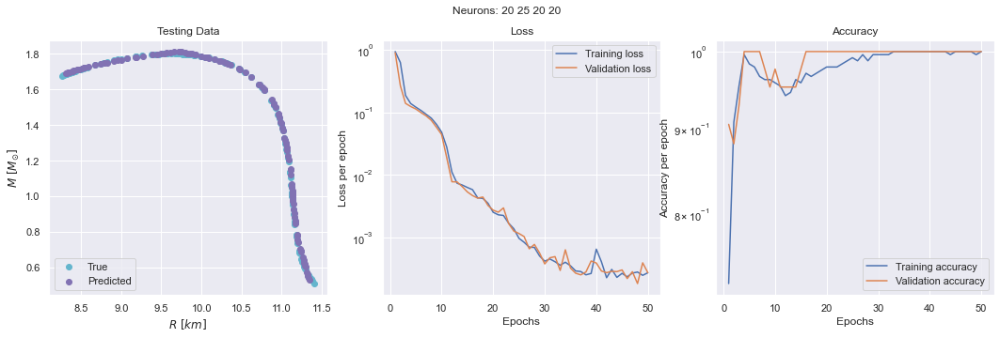

4/4 [==============================] - 0s 1ms/step
The Accuracy of ANN model is: 99.87003697707131


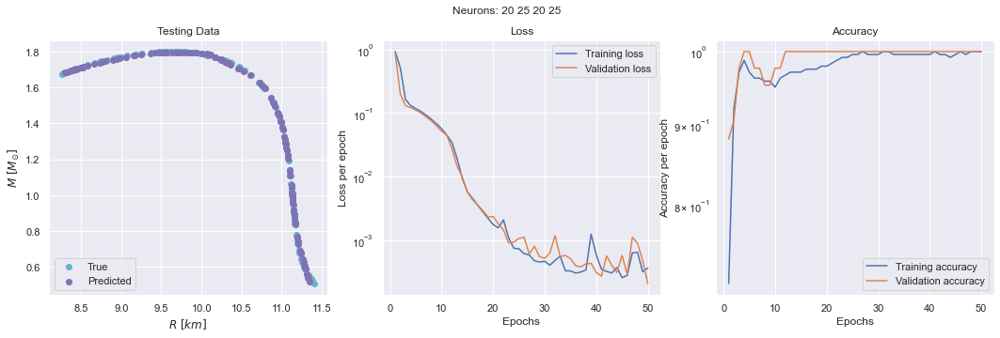

4/4 [==============================] - 0s 1ms/step
The Accuracy of ANN model is: 99.9118286603447


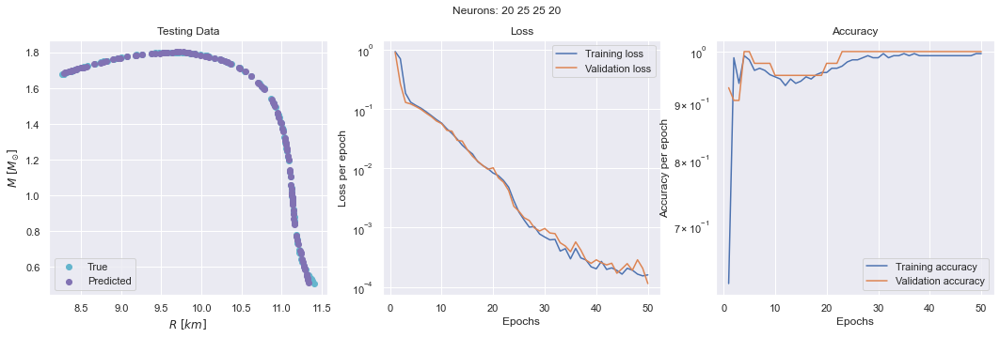

4/4 [==============================] - 0s 1ms/step
The Accuracy of ANN model is: 99.90326960038722


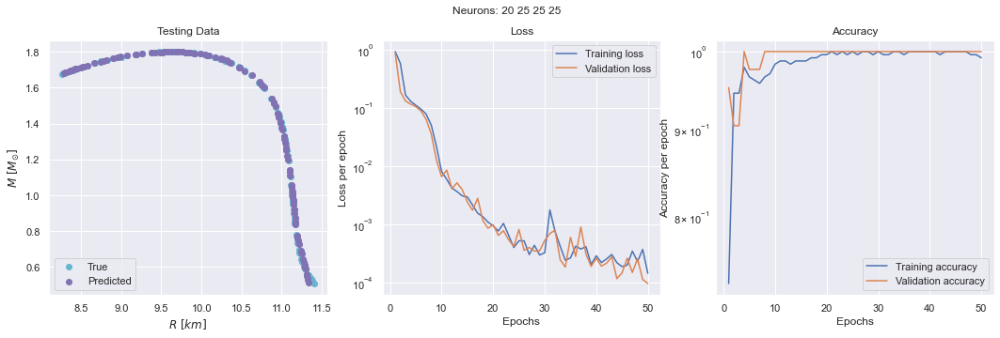

4/4 [==============================] - 0s 1ms/step
The Accuracy of ANN model is: 99.90572592781274


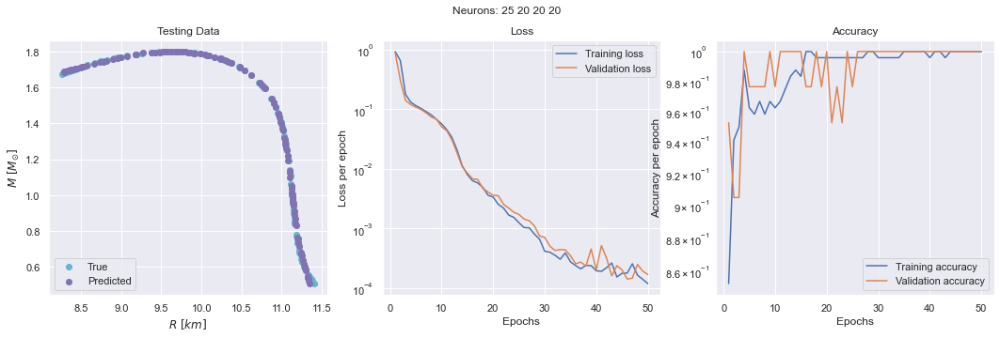

4/4 [==============================] - 0s 1ms/step
The Accuracy of ANN model is: 99.85899024060043


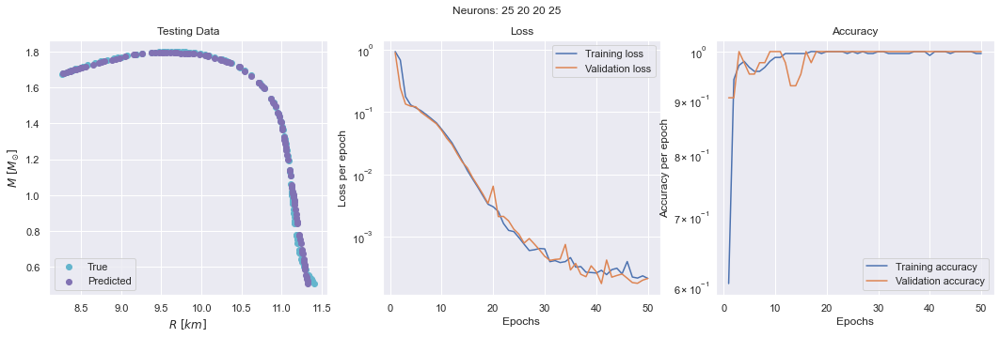

4/4 [==============================] - 0s 1ms/step
The Accuracy of ANN model is: 99.85734662047925


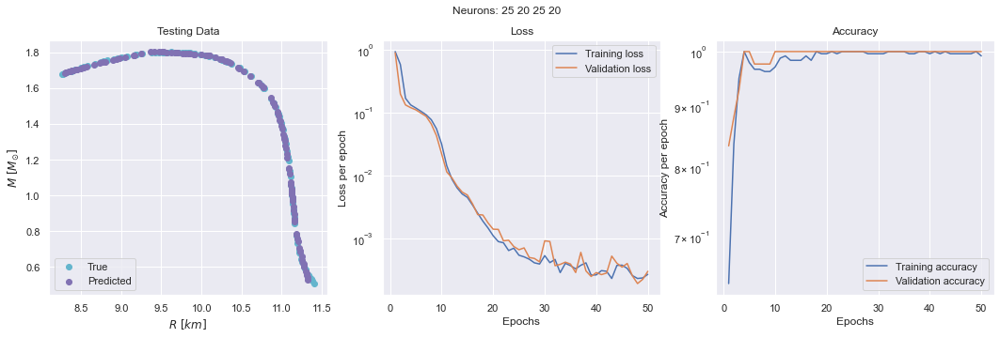

4/4 [==============================] - 0s 667us/step
The Accuracy of ANN model is: 99.85584037256234


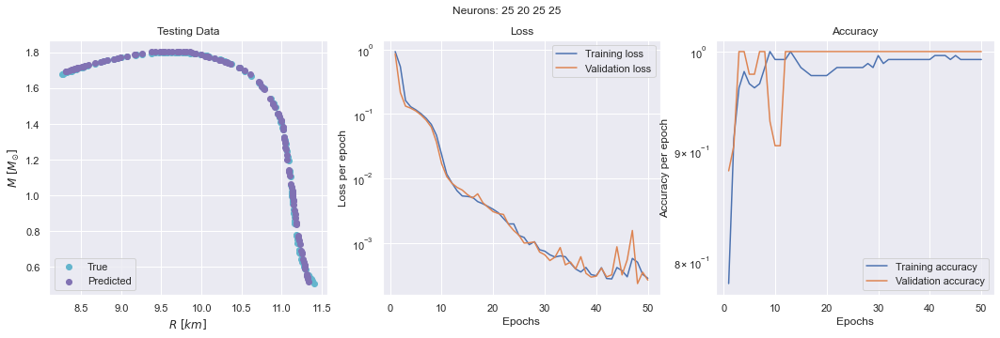

4/4 [==============================] - 0s 1ms/step
The Accuracy of ANN model is: 99.88617037366188


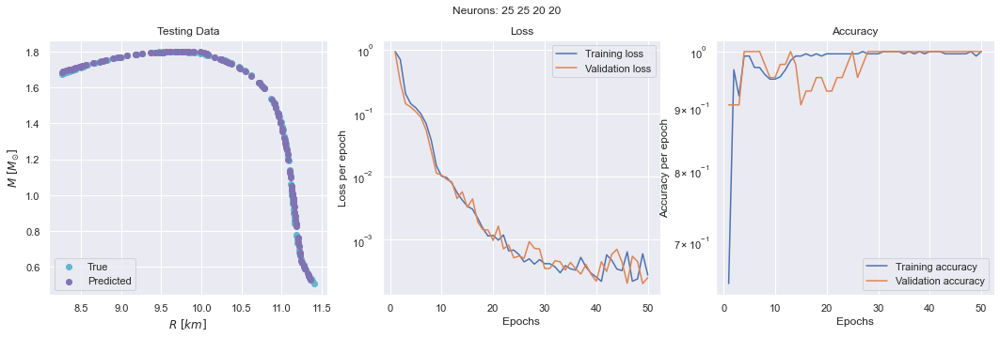

4/4 [==============================] - 0s 667us/step
The Accuracy of ANN model is: 99.86492859466037


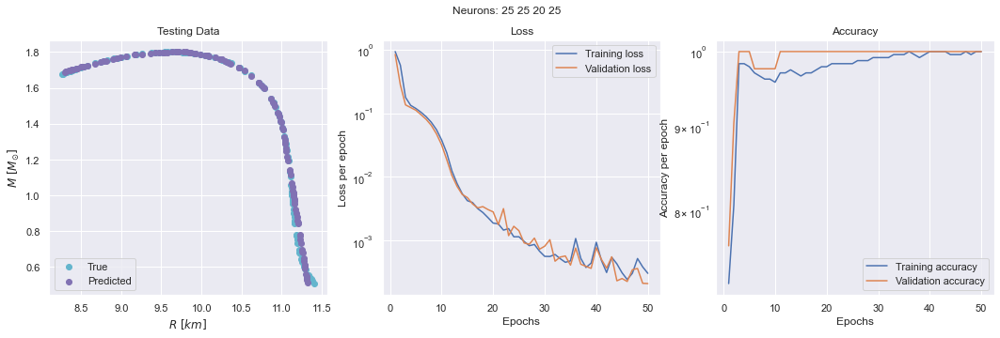

4/4 [==============================] - 0s 667us/step
The Accuracy of ANN model is: 99.91696709377514


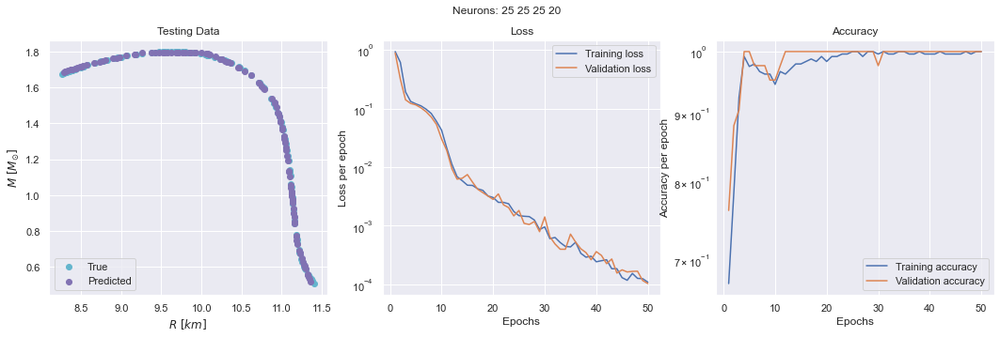

4/4 [==============================] - 0s 1ms/step
The Accuracy of ANN model is: 99.84714558553371


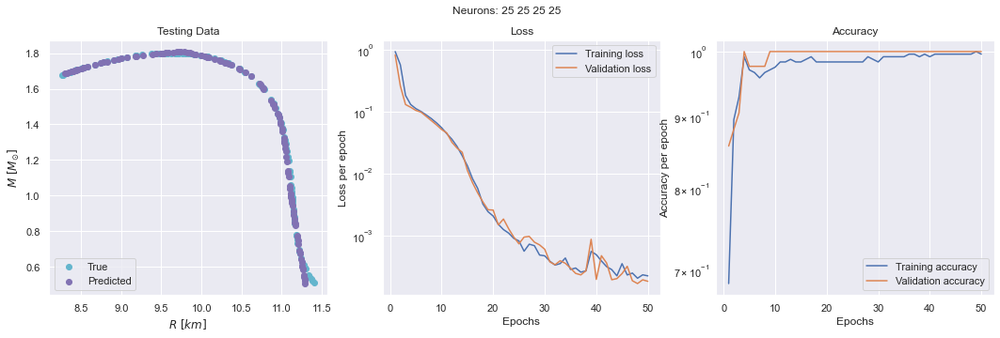

In [ ]:
eps         = 50
nu_list     = [20,25]
ape_list    = []
accur_list  = []
neu_list    = []
dist_list   = []

for i in nu_list:
    for j in nu_list:
        for k in nu_list:
            for l in nu_list:
                
                model = Sequential()
                
                model.add(Dense(units = i, input_dim=X_train.shape[1], kernel_initializer='normal', activation='tanh'))

                model.add(Dense(units = j, kernel_initializer='normal', activation='tanh'))

                model.add(Dense(units = k, kernel_initializer='normal', activation='relu'))

                model.add(Dense(units = l, kernel_initializer='normal', activation='relu'))

                model.add(Dense(2, kernel_initializer='normal'))

                model.compile(loss='mean_squared_error', optimizer='adam', metrics=['accuracy'])

                trial = model.fit(X_train, y_train ,batch_size = 5, epochs = eps, verbose=0, validation_split = 0.15)

                Predictions=model.predict(X_test)

                Predictions=TargetVarScalerFit.inverse_transform(Predictions)

                y_test_orig=TargetVarScalerFit.inverse_transform(y_test)

                Test_Data=PredictorScalerFit.inverse_transform(X_test)

                TestingData=pd.DataFrame(data=Test_Data, columns=Predictors)

                TestingData['M'] = y_test_orig.T[0]
                TestingData['R'] = y_test_orig.T[1]

                TestingData['M_pred'] = Predictions.T[0]
                TestingData['R_pred'] = Predictions.T[1]

                Testing_norm   = np.sqrt(TestingData.M.values**2 + TestingData.R.values**2)
                Predicted_norm = np.sqrt(TestingData.M_pred.values**2 + TestingData.R_pred.values**2)
                Test_pred_norm = np.sqrt((TestingData.M.values-TestingData.M_pred.values)**2 + (TestingData.R.values-TestingData.R_pred.values)**2)


                APE=100*(Test_pred_norm/Testing_norm)
                TestingData['APE']=APE

                print('The Accuracy of ANN model is:', 100-np.mean(APE))

                import matplotlib.pyplot as plt
                x1 = TestingData.R.values
                y1 = TestingData.M.values

                x2 = TestingData.R_pred.values
                y2 = TestingData.M_pred.values

                fig, ax = plt.subplots(1, 3, figsize=(18,5))
                ax[0].scatter(x1,y1, color = 'c', label = 'True')
                ax[0].scatter(x2,y2, color = 'm', label = 'Predicted')
                ax[0].legend()
                ax[0].set_xlabel('$ R \ [km] $')
                ax[0].set_ylabel('$ M \ [M_{\odot}] $')
                ax[0].set_title("Testing Data")


                val_loss_list = trial.history['val_loss']
                loss_list     = trial.history['loss']
                epos          = np.linspace(1,eps,eps)
                ax[1].semilogy(epos, loss_list    , label = 'Training loss')
                ax[1].semilogy(epos, val_loss_list, label = 'Validation loss')
                ax[1].set_xlabel('Epochs')
                ax[1].set_ylabel('Loss per epoch')
                ax[1].legend()
                ax[1].set_title("Loss")

                val_acc_list = trial.history['val_accuracy']
                acc_list     = trial.history['accuracy']
                epos         = np.linspace(1,eps,eps)
                ax[2].semilogy(epos, acc_list    , label = 'Training accuracy')
                ax[2].semilogy(epos, val_acc_list, label = 'Validation accuracy')
                ax[2].set_xlabel('Epochs')
                ax[2].set_ylabel('Accuracy per epoch')
                ax[2].legend()
                ax[2].set_title("Accuracy")

                distance = np.array(acc_list)-np.array(val_acc_list)
                distance = np.mean(distance[-10:])
                
                neu_list.append(str(i)+" "+str(j)+" "+str(k)+" "+str(l))
                ape_list.append(100-np.mean(APE))
                dist_list.append(distance)
                accur_list.append(np.mean(acc_list))
                
                fig.suptitle('Neurons: '+str(i)+" "+str(j)+" "+str(k)+" "+str(l))
                plt.show()

## 20-25-25-20

4/4 [==============================] - 0s 667us/step
The Accuracy of ANN model is: 99.92362576819932


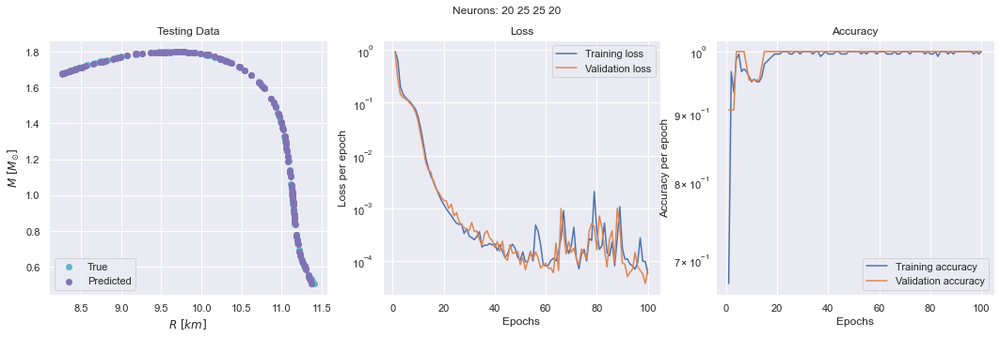

In [ ]:
eps         = 100

ape_list    = []
accur_list  = []
neu_list    = []
dist_list   = []


model = Sequential()

model.add(Dense(units = 20, input_dim=X_train.shape[1], kernel_initializer='normal', activation='tanh'))

model.add(Dense(units = 25, kernel_initializer='normal', activation='tanh'))

model.add(Dense(units = 25, kernel_initializer='normal', activation='relu'))

model.add(Dense(units = 20, kernel_initializer='normal', activation='relu'))

model.add(Dense(2, kernel_initializer='normal'))

model.compile(loss='mean_squared_error', optimizer='adam', metrics=['accuracy'])


trial = model.fit(X_train, y_train ,batch_size = 5, epochs = eps, verbose=0, validation_split = 0.15)

Predictions=model.predict(X_test)

Predictions=TargetVarScalerFit.inverse_transform(Predictions)

y_test_orig=TargetVarScalerFit.inverse_transform(y_test)

Test_Data=PredictorScalerFit.inverse_transform(X_test)

TestingData=pd.DataFrame(data=Test_Data, columns=Predictors)

TestingData['M'] = y_test_orig.T[0]
TestingData['R'] = y_test_orig.T[1]

TestingData['M_pred'] = Predictions.T[0]
TestingData['R_pred'] = Predictions.T[1]

Testing_norm   = np.sqrt(TestingData.M.values**2 + TestingData.R.values**2)
Predicted_norm = np.sqrt(TestingData.M_pred.values**2 + TestingData.R_pred.values**2)
Test_pred_norm = np.sqrt((TestingData.M.values-TestingData.M_pred.values)**2 + (TestingData.R.values-TestingData.R_pred.values)**2)


APE=100*(Test_pred_norm/Testing_norm)
TestingData['APE']=APE

print('The Accuracy of ANN model is:', 100-np.mean(APE))

import matplotlib.pyplot as plt
x1 = TestingData.R.values
y1 = TestingData.M.values

x2 = TestingData.R_pred.values
y2 = TestingData.M_pred.values

fig, ax = plt.subplots(1, 3, figsize=(18,5))
ax[0].scatter(x1,y1, color = 'c', label = 'True')
ax[0].scatter(x2,y2, color = 'm', label = 'Predicted')
ax[0].legend()
ax[0].set_xlabel('$ R \ [km] $')
ax[0].set_ylabel('$ M \ [M_{\odot}] $')
ax[0].set_title("Testing Data")


val_loss_list = trial.history['val_loss']
loss_list     = trial.history['loss']
epos          = np.linspace(1,eps,eps)
ax[1].semilogy(epos, loss_list    , label = 'Training loss')
ax[1].semilogy(epos, val_loss_list, label = 'Validation loss')
ax[1].set_xlabel('Epochs')
ax[1].set_ylabel('Loss per epoch')
ax[1].legend()
ax[1].set_title("Loss")

val_acc_list = trial.history['val_accuracy']
acc_list     = trial.history['accuracy']
epos         = np.linspace(1,eps,eps)
ax[2].semilogy(epos, acc_list    , label = 'Training accuracy')
ax[2].semilogy(epos, val_acc_list, label = 'Validation accuracy')
ax[2].set_xlabel('Epochs')
ax[2].set_ylabel('Accuracy per epoch')
ax[2].legend()
ax[2].set_title("Accuracy")

distance = np.array(acc_list)-np.array(val_acc_list)
distance = np.mean(distance[-10:])

neu_list.append(str(i)+" "+str(j)+" "+str(k)+" "+str(l))
ape_list.append(100-np.mean(APE))
dist_list.append(distance)
accur_list.append(np.mean(acc_list))

fig.suptitle('Neurons: '+str(20)+" "+str(25)+" "+str(25)+" "+str(20))
plt.show()

4/4 [==============================] - 0s 1ms/step
The Accuracy of ANN model is: 99.85926702424692


NameError: name 'i' is not defined

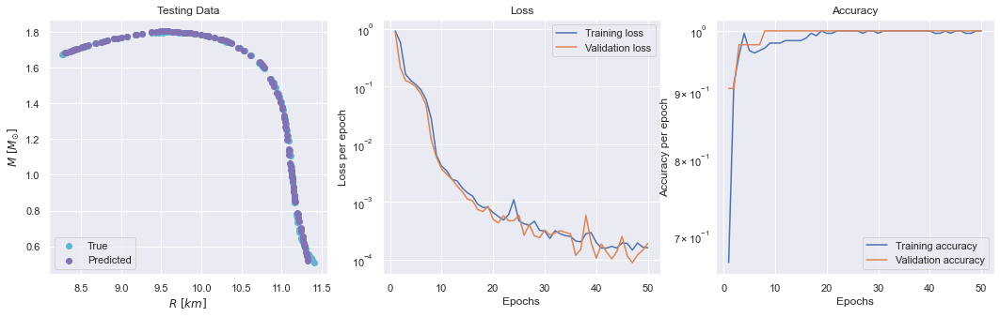

In [ ]:
eps         = 50

ape_list    = []
accur_list  = []
neu_list    = []
dist_list   = []


model = Sequential()

model.add(Dense(units = 20, input_dim=X_train.shape[1], kernel_initializer='normal', activation='tanh'))

model.add(Dense(units = 25, kernel_initializer='normal', activation='tanh'))

model.add(Dense(units = 25, kernel_initializer='normal', activation='relu'))

model.add(Dense(units = 20, kernel_initializer='normal', activation='relu'))

model.add(Dense(2, kernel_initializer='normal'))


model.compile(loss='mean_squared_error', optimizer='adam', metrics=['accuracy'])


trial = model.fit(X_train, y_train ,batch_size = 5, epochs = eps, verbose=0, validation_split = 0.15)

Predictions=model.predict(X_test)

Predictions=TargetVarScalerFit.inverse_transform(Predictions)

y_test_orig=TargetVarScalerFit.inverse_transform(y_test)

Test_Data=PredictorScalerFit.inverse_transform(X_test)

TestingData=pd.DataFrame(data=Test_Data, columns=Predictors)

TestingData['M'] = y_test_orig.T[0]
TestingData['R'] = y_test_orig.T[1]

TestingData['M_pred'] = Predictions.T[0]
TestingData['R_pred'] = Predictions.T[1]

Testing_norm   = np.sqrt(TestingData.M.values**2 + TestingData.R.values**2)
Predicted_norm = np.sqrt(TestingData.M_pred.values**2 + TestingData.R_pred.values**2)
Test_pred_norm = np.sqrt((TestingData.M.values-TestingData.M_pred.values)**2 + (TestingData.R.values-TestingData.R_pred.values)**2)


APE=100*(Test_pred_norm/Testing_norm)
TestingData['APE']=APE

print('The Accuracy of ANN model is:', 100-np.mean(APE))

import matplotlib.pyplot as plt
x1 = TestingData.R.values
y1 = TestingData.M.values

x2 = TestingData.R_pred.values
y2 = TestingData.M_pred.values

fig, ax = plt.subplots(1, 3, figsize=(18,5))
ax[0].scatter(x1,y1, color = 'c', label = 'True')
ax[0].scatter(x2,y2, color = 'm', label = 'Predicted')
ax[0].legend()
ax[0].set_xlabel('$ R \ [km] $')
ax[0].set_ylabel('$ M \ [M_{\odot}] $')
ax[0].set_title("Testing Data")


val_loss_list = trial.history['val_loss']
loss_list     = trial.history['loss']
epos          = np.linspace(1,eps,eps)
ax[1].semilogy(epos, loss_list    , label = 'Training loss')
ax[1].semilogy(epos, val_loss_list, label = 'Validation loss')
ax[1].set_xlabel('Epochs')
ax[1].set_ylabel('Loss per epoch')
ax[1].legend()
ax[1].set_title("Loss")

val_acc_list = trial.history['val_accuracy']
acc_list     = trial.history['accuracy']
epos         = np.linspace(1,eps,eps)
ax[2].semilogy(epos, acc_list    , label = 'Training accuracy')
ax[2].semilogy(epos, val_acc_list, label = 'Validation accuracy')
ax[2].set_xlabel('Epochs')
ax[2].set_ylabel('Accuracy per epoch')
ax[2].legend()
ax[2].set_title("Accuracy")

distance = np.array(acc_list)-np.array(val_acc_list)
distance = np.mean(distance[-10:])

neu_list.append(str(i)+" "+str(j)+" "+str(k)+" "+str(l))
ape_list.append(100-np.mean(APE))
dist_list.append(distance)
accur_list.append(np.mean(acc_list))

fig.suptitle('Neurons: '+str(20)+" "+str(25)+" "+str(25)+" "+str(20))
plt.show()

## Prediction for 20-25-25-20 and 100 epochs

5/5 [==============================] - 0s 750us/step


Text(0.5, 1.0, 'Trial data')

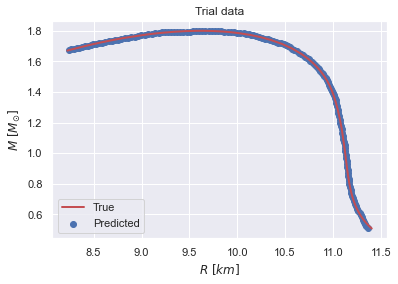

In [ ]:
import math
from sklearn.preprocessing import StandardScaler
PredictorScaler=StandardScaler()

X = np.array([np.logspace(math.log10(min(data.rho_c)), math.log10(max(data.rho_c)), num = 150, base=10),]).T

trial_df = pd.DataFrame({})

trial_df['rho_c'] = X.T[0]

PredictorScaler=StandardScaler()


PredictorScalerFit=PredictorScaler.fit(X)

X=PredictorScalerFit.transform(X)

Predictions=model.predict(X)

Predictions=TargetVarScalerFit.inverse_transform(Predictions)




trial_df['M_pred'] = Predictions.T[0]
trial_df['R_pred'] = Predictions.T[1]

x1 = data.R.values
y1 = data.M.values

x2 = trial_df.R_pred.values
y2 = trial_df.M_pred.values

plt.plot(x1, y1, linewidth = 2, color = 'r', label = 'True')
plt.scatter(x2, y2, label = 'Predicted')

plt.legend()

plt.xlabel('$ R \ [km] $')
plt.ylabel('$ M \ [M_{\odot}] $')
plt.title('Trial data')

## 20-15-15 relu tanh tanh

4/4 [==============================] - 0s 1ms/step
The Accuracy of ANN model is: 99.92470598118071


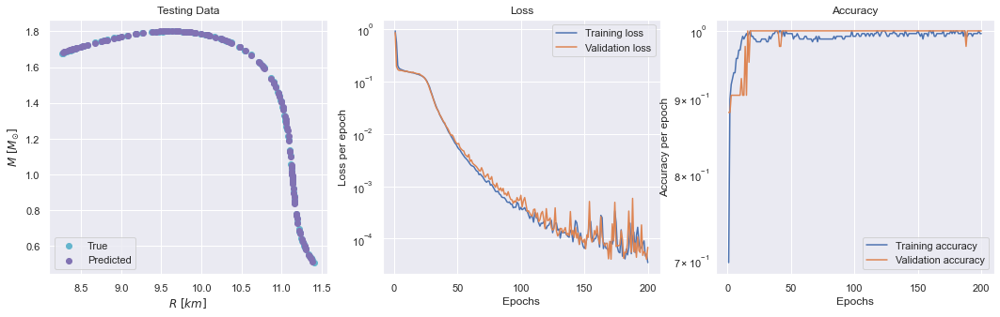

The time of execution of above program is : 12152.715921401978 ms


In [ ]:
start = time.time()

eps = 200

model = Sequential()

model.add(Dense(units = 20, input_dim=X_train.shape[1], kernel_initializer='normal', activation='relu'))

model.add(Dense(units = 15, kernel_initializer='normal', activation='tanh'))

model.add(Dense(units = 15, kernel_initializer='normal', activation='tanh'))

#             model.add(Dense(units=15, kernel_initializer='normal', activation='tanh'))

#             model.add(Dense(units=20, kernel_initializer='normal', activation='relu'))

model.add(Dense(2, kernel_initializer='normal'))

model.compile(loss='mean_squared_error', optimizer='adam', metrics=['accuracy'])

trial = model.fit(X_train, y_train ,batch_size = 5, epochs = eps, verbose=0, validation_split = 0.15)

end = time.time()


Predictions=model.predict(X_test)

Predictions=TargetVarScalerFit.inverse_transform(Predictions)

y_test_orig=TargetVarScalerFit.inverse_transform(y_test)

Test_Data=PredictorScalerFit.inverse_transform(X_test)

TestingData=pd.DataFrame(data=Test_Data, columns=Predictors)

TestingData['M'] = y_test_orig.T[0]
TestingData['R'] = y_test_orig.T[1]

TestingData['M_pred'] = Predictions.T[0]
TestingData['R_pred'] = Predictions.T[1]

Testing_norm   = np.sqrt(TestingData.M.values**2 + TestingData.R.values**2)
Predicted_norm = np.sqrt(TestingData.M_pred.values**2 + TestingData.R_pred.values**2)
Test_pred_norm = np.sqrt((TestingData.M.values-TestingData.M_pred.values)**2 + (TestingData.R.values-TestingData.R_pred.values)**2)


APE=100*(Test_pred_norm/Testing_norm)
TestingData['APE']=APE

print('The Accuracy of ANN model is:', 100-np.mean(APE))

import matplotlib.pyplot as plt
x1 = TestingData.R.values
y1 = TestingData.M.values

x2 = TestingData.R_pred.values
y2 = TestingData.M_pred.values

fig, ax = plt.subplots(1, 3, figsize=(18,5))
ax[0].scatter(x1,y1, color = 'c', label = 'True')
ax[0].scatter(x2,y2, color = 'm', label = 'Predicted')
ax[0].legend()
ax[0].set_xlabel('$ R \ [km] $')
ax[0].set_ylabel('$ M \ [M_{\odot}] $')
ax[0].set_title("Testing Data")


val_loss_list = trial.history['val_loss']
loss_list     = trial.history['loss']
epos          = np.linspace(1,eps,eps)
ax[1].semilogy(epos, loss_list    , label = 'Training loss')
ax[1].semilogy(epos, val_loss_list, label = 'Validation loss')
ax[1].set_xlabel('Epochs')
ax[1].set_ylabel('Loss per epoch')
ax[1].legend()
ax[1].set_title("Loss")

val_acc_list = trial.history['val_accuracy']
acc_list     = trial.history['accuracy']
epos         = np.linspace(1,eps,eps)
ax[2].semilogy(epos, acc_list    , label = 'Training accuracy')
ax[2].semilogy(epos, val_acc_list, label = 'Validation accuracy')
ax[2].set_xlabel('Epochs')
ax[2].set_ylabel('Accuracy per epoch')
ax[2].legend()
ax[2].set_title("Accuracy")



plt.show()


 

print("The time of execution of above program is :",(end-start) * 10**3, "ms")

5/5 [==============================] - 0s 1ms/step
The time of execution of above program is : 54.012298583984375 ms


Text(0.5, 1.0, 'Trial data')

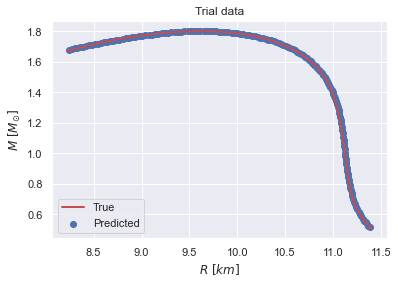

In [ ]:
import math
from sklearn.preprocessing import StandardScaler
PredictorScaler=StandardScaler()

X = np.array([np.logspace(math.log10(min(data.rho_c)), math.log10(max(data.rho_c)), num = 150, base=10),]).T

trial_df = pd.DataFrame({})

trial_df['rho_c'] = X.T[0]

start = time.time()


X=PredictorScalerFit.transform(X)

Predictions=model.predict(X)

Predictions=TargetVarScalerFit.inverse_transform(Predictions)

end = time.time()
 

print("The time of execution of above program is :",(end-start) * 10**3, "ms")


trial_df['M_pred'] = Predictions.T[0]
trial_df['R_pred'] = Predictions.T[1]

x1 = data.R.values
y1 = data.M.values

x2 = trial_df.R_pred.values
y2 = trial_df.M_pred.values

plt.plot(x1, y1, linewidth = 2, color = 'r', label = 'True')
plt.scatter(x2, y2, label = 'Predicted')

plt.legend()

plt.xlabel('$ R \ [km] $')
plt.ylabel('$ M \ [M_{\odot}] $')
plt.title('Trial data')